In [1]:
import datetime as dt
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import math
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler, StandardScaler

import argparse
import logging
import os
import time
import random
from collections import namedtuple
from typing import Optional, Union
import torch
import torch.nn.functional as F
import torch.nn.init as init
from torch import nn, optim, distributions
import torch.backends.cudnn as cudnn
import tqdm
from scipy.stats import levy_stable
import torchsde
#画热图
import seaborn as sns

In [2]:
def setup_seed(seed):
      torch.manual_seed(seed)
      torch.cuda.manual_seed_all(seed)
      np.random.seed(seed)
      # random.seed(seed)
      torch.backends.cudnn.deterministic = True

In [3]:
setup_seed(3)

In [4]:
data = pd.read_csv(".\Data set\shangzheng50.csv")

In [5]:
data=data[['date','code','open','close','high','low','volume']]

In [6]:
data

,date,code,open,close,high,low,volume
0,2004-01-02,sz50,997.00,1011.35,1021.57,993.89,8064650.0
1,2004-01-05,sz50,1008.28,1060.80,1060.90,1008.28,14468200.0
2,2004-01-06,sz50,1059.14,1075.66,1086.69,1059.09,16991300.0
3,2004-01-07,sz50,1075.56,1086.30,1095.84,1070.98,13729400.0
4,2004-01-08,sz50,1087.68,1102.66,1108.29,1082.51,10780400.0
...,...,...,...,...,...,...,...
4189,2021-03-31,sz50,3573.86,3539.37,3573.86,3518.17,29985299.0
4190,2021-04-01,sz50,3547.46,3582.65,3586.36,3545.09,21357739.0
4191,2021-04-02,sz50,3592.88,3616.76,3616.80,3583.04,23396735.0
4192,2021-04-06,sz50,3624.80,3594.71,3624.80,3581.76,17974469.0


In [7]:
data.set_index(pd.Index(np.linspace(1, len(data.index), len(data.index), dtype = int)))
data['date']= pd.to_datetime(data['date']) 
data.head()

,date,code,open,close,high,low,volume
0,2004-01-02,sz50,997.00,1011.35,1021.57,993.89,8064650.0
1,2004-01-05,sz50,1008.28,1060.80,1060.90,1008.28,14468200.0
2,2004-01-06,sz50,1059.14,1075.66,1086.69,1059.09,16991300.0
3,2004-01-07,sz50,1075.56,1086.30,1095.84,1070.98,13729400.0
4,2004-01-08,sz50,1087.68,1102.66,1108.29,1082.51,10780400.0


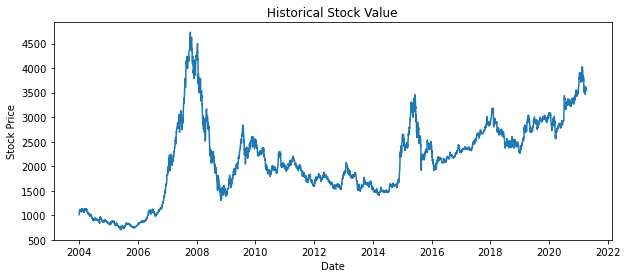

In [8]:
# Visualize the plot
plt.figure(figsize=(10,4))
plt.plot(data['date'],data['close'])
plt.title('Historical Stock Value')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.show()

# Data Cleaning and Splitting

In [9]:
# Create new dataframe with only relevant columns
stk_data = pd.DataFrame(columns = ['Date', 'Open', 'High', 'Low', 'Close'])
stk_data['Date'] = data['date']
stk_data['Open'] = data['open']
stk_data['High'] = data['high']
stk_data['Low'] = data['low']
stk_data['Close'] = data['close']
stk_data.head()

,Date,Open,High,Low,Close
0,2004-01-02,997.00,1021.57,993.89,1011.35
1,2004-01-05,1008.28,1060.90,1008.28,1060.80
2,2004-01-06,1059.14,1086.69,1059.09,1075.66
3,2004-01-07,1075.56,1095.84,1070.98,1086.30
4,2004-01-08,1087.68,1108.29,1082.51,1102.66


In [10]:
# Define the training set
percent_training: float = 0.80
num_training_samples = int(np.ceil(percent_training*len(stk_data))) # number of training samples in int
training_set = stk_data.iloc[:num_training_samples, 4:5].values # Extract the Close values for training data

In [11]:
#Define the test data
num_testing_samples: int = len(stk_data) - num_training_samples # number of test samples in int 
testing_set = stk_data.iloc[-num_testing_samples:, 4:5].values # Extract the Close values for test data

In [12]:
print('Training set shape:', training_set.shape, '\n', 'Testing set shape:', testing_set.shape)

Training set shape: (3356, 1) 
 Testing set shape: (838, 1)


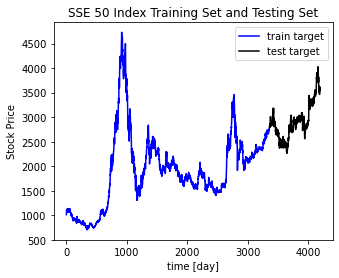

In [13]:
## show predictions
plt.figure(figsize=(5, 4))
plt.plot(np.arange(training_set.shape[0]), training_set, color='blue', label='train target')
plt.plot(np.arange(training_set.shape[0],training_set.shape[0]+testing_set.shape[0]),testing_set, color='black', label='test target')
plt.title('SSE 50 Index Training Set and Testing Set')
plt.xlabel('time [day]')
plt.ylabel('Stock Price')
plt.legend(loc='best');

In [14]:
# Scale training data
scaler = StandardScaler()
training_set_scaled = scaler.fit_transform(training_set) #2D (num_training_samples, 1)
testing_set_scaled = scaler.transform(testing_set) # 2D ndarray (num_testing_samples, 1)

In [15]:
#training data 处理
training_set_scaled1=training_set_scaled.flatten()#将数组降一维
training_set_scaled2=pd.DataFrame(columns=["closescale"],data=training_set_scaled1)#将array转为dataframe
training_set_scaled21=stk_data.loc[0:(len(training_set_scaled2)-1),'Date'].to_frame()#提取相应日期

In [16]:
training_set_scaled3= pd.concat([training_set_scaled21,training_set_scaled2],axis=1)

In [17]:
#testing data 处理
testing_set_scaled1=testing_set_scaled.flatten()#将数组降一维
testing_set_scaled2=pd.DataFrame(columns=["closescale"],data=testing_set_scaled1)#将array转为dataframe
testing_set_scaled21=stk_data.loc[len(training_set_scaled3):,'Date'].to_frame()#提取相应日期

In [18]:
testing_set_scaled21=pd.DataFrame(columns=["Date"],data=testing_set_scaled21.values)
testing_set_scaled3= pd.concat([testing_set_scaled21,testing_set_scaled2],axis=1)

# 利用相空间重构方法创建数据

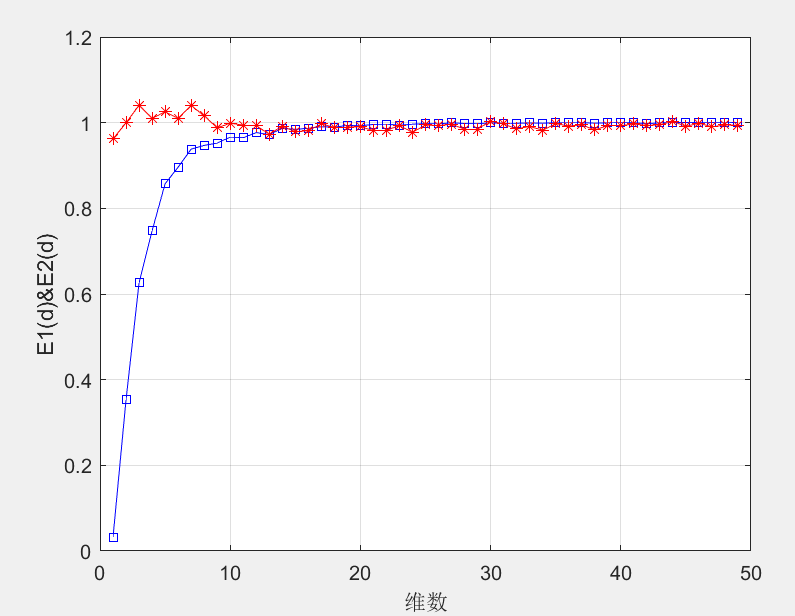

相空间重构数据

In [19]:
# data为时间序列，tau为重构的时延，d为重构的维数，T为直接预测的步数
def PhaSpaRecon(df,tau,d,T):
    data = np.array(df)[:, 1]
    date = np.array(df)[:, 0]
    lens = len(data)
    if (lens - T - (d-1) * tau) < 1:
        print("error: delay time or the embedding dimension is too large")
    else:
        Xn1 = np.zeros((d, lens-(d-1)*tau-1))
        for i in range(0, d):
            Xn1[i, :] = data[i*tau:i*tau+lens-(d-1)*tau-1]
            # for j in range(i*tau, i*tau+lens-(d-1)*tau-1):
            #     Xn[i, j] = data[j]
        Yn1 = data[(T+(d-1)*tau):T+(d-1)*tau+lens-(d-1)*tau-1]
        Yn1_date = date[(T+(d-1)*tau):T+(d-1)*tau+lens-(d-1)*tau-1]
        Yn = Yn1.reshape((len(Yn1), 1))
        Yn_date = Yn1_date.reshape((len(Yn1_date), 1))
        Yn = pd.DataFrame(Yn)
        Yn_date = pd.DataFrame(Yn_date)
        Y = pd.concat([Yn_date, Yn],axis=1)
        Xn = Xn1.T #reshape((Xn1.shape[1], Xn1.shape[0]))
        Xn = pd.DataFrame(Xn)
        X = pd.concat([Xn, Yn],axis=1)
    return Xn, Yn, Y, X

In [20]:
Xn, Yn,Y,X = PhaSpaRecon(training_set_scaled3, tau=1, d=23, T=1)

In [21]:
Xn

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,-1.202782,-1.137260,-1.117571,-1.103473,-1.081795,-1.109448,-1.063060,-1.082219,-1.112191,-1.119797,...,-1.096278,-1.081411,-1.047637,-1.048352,-1.056064,-1.039461,-1.057548,-1.071990,-1.093124,-1.090143
1,-1.137260,-1.117571,-1.103473,-1.081795,-1.109448,-1.063060,-1.082219,-1.112191,-1.119797,-1.106984,...,-1.081411,-1.047637,-1.048352,-1.056064,-1.039461,-1.057548,-1.071990,-1.093124,-1.090143,-1.053851
2,-1.117571,-1.103473,-1.081795,-1.109448,-1.063060,-1.082219,-1.112191,-1.119797,-1.106984,-1.084525,...,-1.047637,-1.048352,-1.056064,-1.039461,-1.057548,-1.071990,-1.093124,-1.090143,-1.053851,-1.054023
3,-1.103473,-1.081795,-1.109448,-1.063060,-1.082219,-1.112191,-1.119797,-1.106984,-1.084525,-1.128316,...,-1.048352,-1.056064,-1.039461,-1.057548,-1.071990,-1.093124,-1.090143,-1.053851,-1.054023,-1.046524
4,-1.081795,-1.109448,-1.063060,-1.082219,-1.112191,-1.119797,-1.106984,-1.084525,-1.128316,-1.096278,...,-1.056064,-1.039461,-1.057548,-1.071990,-1.093124,-1.090143,-1.053851,-1.054023,-1.046524,-1.055666
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,1.024806,1.018353,0.998703,0.992794,1.000479,0.995854,0.985175,1.002294,1.006931,1.009051,...,0.998027,1.024196,1.028781,1.044654,1.059004,1.052419,1.069988,1.065868,1.104929,1.108944
3329,1.018353,0.998703,0.992794,1.000479,0.995854,0.985175,1.002294,1.006931,1.009051,1.006852,...,1.024196,1.028781,1.044654,1.059004,1.052419,1.069988,1.065868,1.104929,1.108944,1.084564
3330,0.998703,0.992794,1.000479,0.995854,0.985175,1.002294,1.006931,1.009051,1.006852,0.983744,...,1.028781,1.044654,1.059004,1.052419,1.069988,1.065868,1.104929,1.108944,1.084564,1.080231
3331,0.992794,1.000479,0.995854,0.985175,1.002294,1.006931,1.009051,1.006852,0.983744,0.983386,...,1.044654,1.059004,1.052419,1.069988,1.065868,1.104929,1.108944,1.084564,1.080231,1.105777


In [22]:
train= X.values
x_train1=train[:,0:23]
y_train1=train[:,23]

In [23]:
X1n, Y1n, Y1,X1 = PhaSpaRecon(testing_set_scaled3, tau=1, d=23, T=1)

In [24]:
test= X1.values
x_test1=test[:,0:23]
y_test1=test[:,23]

In [25]:
print('x_train1 shape:', x_train1.shape, '\n', 'x_test1 shape:', x_test1.shape, '\n', 'y_train1 shape:', y_train1.shape, '\n', 'y_test1 shape:', y_test1.shape)

x_train1 shape: (3333, 23) 
 x_test1 shape: (815, 23) 
 y_train1 shape: (3333,) 
 y_test1 shape: (815,)


In [26]:
ts_  = np.arange(0, y_train1.shape[0])
ts_ext_ = np.arange(y_train1.shape[0], y_train1.shape[0] + y_test1.shape[0])
ts_full_ = np.arange(0, y_train1.shape[0] + y_test1.shape[0])

In [27]:
# Since each year has 252 trading days on average
ts_ = ts_/252; ts_ext_ = ts_ext_/252; ts_full_ = ts_full_/252 # ts_[-1] = 4.44444, ts_ext_[-1] : 5.5555

print('ts_ shape:', ts_.shape, '\n', 'ts_ext_ shape:', ts_ext_.shape, '\n', 'ts_full_ shape:', ts_full_.shape)

ts_ shape: (3333,) 
 ts_ext_ shape: (815,) 
 ts_full_ shape: (4148,)


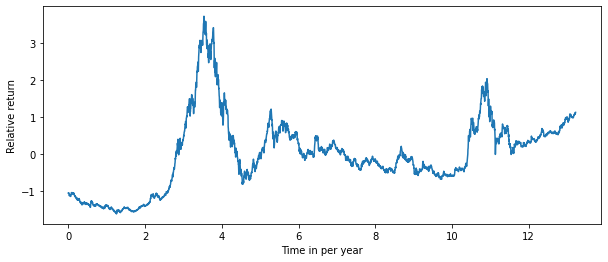

In [28]:
plt.figure(figsize = (10,4))
plt.plot(ts_, y_train1)
plt.xlabel('Time in per year')
plt.ylabel('Relative return')
plt.show()

In [29]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
xs_ = x_train1.astype(np.float64)
ys_ = y_train1.astype(np.float64)
xs_ext_ = x_test1.astype(np.float64)
ys_ext_ = y_test1.astype(np.float64)#object转float
xs = torch.tensor(xs_).float().to(device)
ys = torch.tensor(ys_).float().to(device)
# ys = ys.view(y_train.shape[0],1)
xs_ext = torch.tensor(xs_ext_).float().to(device)
ys_ext = torch.tensor(ys_ext_).float().to(device)

ts = torch.tensor(ts_).float().to(device)
ts = ts.view(ts_.shape[0],1)
ts_ext = torch.tensor(ts_ext_).float().to(device)
ts_ext = ts_ext.view(ts_ext_.shape[0],1)
ts_vis = ts_ext

In [30]:
Data = namedtuple('Data', ['ts_', 'ts_ext_', 'ts_vis_', 'ts', 'ts_ext', 'ts_vis', 'ys', 'ys_','ys_ext_'])

In [31]:
X21n, Y21n,Y21,X21 = PhaSpaRecon(training_set_scaled3, tau=1, d=23, T=2)
X22n, Y22n, Y22,X22 = PhaSpaRecon(testing_set_scaled3, tau=1, d=23, T=2)

In [32]:
train2= X21.values
train2=np.delete(train2,-1, axis=0)#减一是因为预测第二天T=2
x_train2=train2[:,0:23]
y_train2=train2[:,23]
test2= X22.values
test2=np.delete(test2,-1, axis=0)#减一是因为预测第二天T=2
x_test2=test2[:,0:23]
y_test2=test2[:,23]

In [33]:
X31n, Y31n,Y31,X31 = PhaSpaRecon(training_set_scaled3, tau=1, d=23, T=3)
X32n, Y32n, Y32,X32 = PhaSpaRecon(testing_set_scaled3, tau=1, d=23, T=3)

In [34]:
train3= X31.values
train3=np.delete(train3,[-1,-2], axis=0)#减一是因为预测第二天T=3
x_train3=train3[:,0:23]
y_train3=train3[:,23]
test3= X32.values
test3=np.delete(test3,[-1,-2], axis=0)#减一是因为预测第二天T=3
x_test3=test3[:,0:23]
y_test3=test3[:,23]

In [35]:
X41n, Y41n,Y41,X41 = PhaSpaRecon(training_set_scaled3, tau=1, d=23, T=4)
X42n, Y42n, Y42,X42 = PhaSpaRecon(testing_set_scaled3, tau=1, d=23, T=4)

In [36]:
train4= X41.values
train4=np.delete(train4,[-1,-2,-3], axis=0)#减一是因为预测第二天T=4
x_train4=train4[:,0:23]
y_train4=train4[:,23]
test4= X42.values
test4=np.delete(test4,[-1,-2,-3], axis=0)#减一是因为预测第二天T=4
x_test4=test4[:,0:23]
y_test4=test4[:,23]

# SDE Definition

In [37]:
sequence_length: int = 23
alpha, beta = 1.3, 0

In [38]:
__all__ = ['SDENet1']

class Drift1(nn.Module):
    def __init__(self):
        super(Drift1, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion1(nn.Module):
    def __init__(self):
        super(Diffusion1, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet1(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet1, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift1()
        self.diffusion = Diffusion1()
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out1=out
            Drift1=self.drift(t, out)
            return Drift1,Out1
            
        else:
            t = 0
            final_out1 = self.diffusion(t, out.detach())  
            return final_out1

def test():
    model = SDENet1(layer_depth=6)
    return model  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model1 = test()
    num_params = count_parameters(model1)
    print(num_params)

3605


In [39]:
__all__ = ['SDENet2']

class Drift2(nn.Module):
    def __init__(self):
        super(Drift2, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion2(nn.Module):
    def __init__(self):
        super(Diffusion2, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet2(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet2, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift2()
        self.diffusion = Diffusion2()
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
#        Out1=Out1.detach().numpy()#减一是因为预测后一天T=1和T=2差一天
#        Out1=np.delete(Out1,-1, axis=0)
#        Out1=torch.from_numpy(Out1)
#        out=torch.cat((out,Out1), 1)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out2=out
            Drift2=self.drift(t, out)
            return Drift2,Out2
            
        else:
            t = 0
            final_out2 = self.diffusion(t, out.detach())  
            return final_out2

def test():
    model2 = SDENet2(layer_depth=6)
    return model2  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model2 = test()
    num_params = count_parameters(model2)
    print(num_params)

3605


In [40]:
__all__ = ['SDENet3']

class Drift3(nn.Module):
    def __init__(self):
        super(Drift3, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion3(nn.Module):
    def __init__(self):
        super(Diffusion3, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet3(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet3, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift3()
        self.diffusion = Diffusion3()
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
#        Out2=Out2.detach().numpy()#减一是因为预测后一天T=2和T=3差一天
#        Out2=np.delete(Out2,-1, axis=0)
#        Out2=torch.from_numpy(Out2)
#        out=torch.cat((out,Out2), 1)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out3=out
            Drift3=self.drift(t, out)
            return Drift3,Out3
            
        else:
            t = 0
            final_out3 = self.diffusion(t, out.detach())  
            return final_out3

def test():
    model3 = SDENet3(layer_depth=6)
    return model3  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model3 = test()
    num_params = count_parameters(model3)
    print(num_params)

3605


In [41]:
__all__ = ['SDENet4']

class Drift4(nn.Module):
    def __init__(self):
        super(Drift4, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion4(nn.Module):
    def __init__(self):
        super(Diffusion4, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet4(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet4, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift4()
        self.diffusion = Diffusion4()
#        self.fc_layers = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(sequence_length, 8))#将激活层与线性层连接一起
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
#        Out3=Out3.detach().numpy()#减一是因为预测后一天T=2和T=3差一天
#        Out3=np.delete(Out3,-1, axis=0)
#        Out3=torch.from_numpy(Out3)
#        out=torch.cat((out,Out3), 1)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out4=out
            Drift4=self.drift(t, out)
#            final_out4 = self.fc_layers(out) 
#            mean41 = final_out[:,0]
#            mean42 = final_out[:,1]
#            mean43 = final_out[:,2]
#            mean44 = final_out[:,3]
#            sigma41 = F.softplus(final_out[:,5])+1e-3
#            sigma42 = F.softplus(final_out[:,6])+1e-3
#            sigma43 = F.softplus(final_out[:,7])+1e-3
#            sigma44 = F.softplus(final_out[:,8])+1e-3
            return Drift4,Out4
            
        else:
            t = 0
            final_out4 = self.diffusion(t, out.detach())  
            return final_out4

def test():
    model4 = SDENet4(layer_depth=6)
    return model4  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model4 = test()
    num_params = count_parameters(model4)
    print(num_params)

3605


# SDE_Regression

DataSet loading

In [42]:
X_train1 = torch.from_numpy(x_train1.astype(np.float64)).float()
X_test1 = torch.from_numpy(x_test1.astype(np.float64)).float()
Y_train1 = torch.from_numpy(y_train1.astype(np.float64)).float()
Y_test1 = torch.from_numpy(y_test1.astype(np.float64)).float()
print('X_train1.shape:', X_train1.shape, '\nX_test1.shape:', X_test1.shape, '\nY_train1.shape:', Y_train1.shape, '\nY_test1.shape:', Y_test1.shape)

X_train1.shape: torch.Size([3333, 23]) 
X_test1.shape: torch.Size([815, 23]) 
Y_train1.shape: torch.Size([3333]) 
Y_test1.shape: torch.Size([815])


In [43]:
X_train2 = torch.from_numpy(x_train2.astype(np.float64)).float()
X_test2 = torch.from_numpy(x_test2.astype(np.float64)).float()
Y_train2 = torch.from_numpy(y_train2.astype(np.float64)).float()
Y_test2 = torch.from_numpy(y_test2.astype(np.float64)).float()
print('X_train2.shape:', X_train2.shape, '\nX_test2.shape:', X_test2.shape, '\nY_train2.shape:', Y_train2.shape, '\nY_test2.shape:', Y_test2.shape)

X_train2.shape: torch.Size([3332, 23]) 
X_test2.shape: torch.Size([814, 23]) 
Y_train2.shape: torch.Size([3332]) 
Y_test2.shape: torch.Size([814])


In [44]:
X_train3 = torch.from_numpy(x_train3.astype(np.float64)).float()
X_test3 = torch.from_numpy(x_test3.astype(np.float64)).float()
Y_train3 = torch.from_numpy(y_train3.astype(np.float64)).float()
Y_test3 = torch.from_numpy(y_test3.astype(np.float64)).float()
print('X_train3.shape:', X_train3.shape, '\nX_test3.shape:', X_test3.shape, '\nY_train3.shape:', Y_train3.shape, '\nY_test3.shape:', Y_test3.shape)

X_train3.shape: torch.Size([3331, 23]) 
X_test3.shape: torch.Size([813, 23]) 
Y_train3.shape: torch.Size([3331]) 
Y_test3.shape: torch.Size([813])


In [45]:
X_train4 = torch.from_numpy(x_train4.astype(np.float64)).float()
X_test4 = torch.from_numpy(x_test4.astype(np.float64)).float()
Y_train4 = torch.from_numpy(y_train4.astype(np.float64)).float()
Y_test4 = torch.from_numpy(y_test4.astype(np.float64)).float()
print('X_train4.shape:', X_train4.shape, '\nX_test4.shape:', X_test4.shape, '\nY_train4.shape:', Y_train4.shape, '\nY_test4.shape:', Y_test4.shape)

X_train4.shape: torch.Size([3330, 23]) 
X_test4.shape: torch.Size([812, 23]) 
Y_train4.shape: torch.Size([3330]) 
Y_test4.shape: torch.Size([812])


Arguments

In [46]:
from __future__ import print_function

parser = argparse.ArgumentParser(description='PyTorch SDENet Training')
parser.add_argument('--epochs', type=int, default=100, help='number of epochs to train')
parser.add_argument('--lr', default=1e-4, type=float, help='learning rate')
parser.add_argument('--lr2', default=0.01, type=float, help='learning rate')
parser.add_argument('--gpu', type=int, default=0)
parser.add_argument('--seed', type=float, default=0)
parser.add_argument('--droprate', type=float, default=0.1, help='learning rate decay')
parser.add_argument('--decreasing_lr', default=[20], nargs='+', help='decreasing strategy')
parser.add_argument('--decreasing_lr2', default=[], nargs='+', help='decreasing strategy')

args = parser.parse_args([])
print(args)
device = torch.device('cuda:' + str(args.gpu) if torch.cuda.is_available() else 'cpu')

batch_size1 = y_train1.squeeze().shape[0]
batch_size2 = y_train2.squeeze().shape[0]
batch_size3 = y_train3.squeeze().shape[0]
batch_size4 = y_train4.squeeze().shape[0]
Iter = 50
Iter_test = 1

Namespace(decreasing_lr=[20], decreasing_lr2=[], droprate=0.1, epochs=100, gpu=0, lr=0.0001, lr2=0.01, seed=0)


# Model

In [47]:
from sklearn.metrics import mean_squared_error
net1 = SDENet1(25)
net1 = net1.to(device)
net2 = SDENet2(25)
net2 = net2.to(device)
net3 = SDENet3(25)
net3 = net3.to(device)
net4 = SDENet4(25)
net4 = net4.to(device)
attention = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(4*sequence_length, 8))
criterion = nn.BCELoss()

real_label = 0
fake_label = 1
optimizer_F = optim.SGD([ {'params': net1.downsampling_layers.parameters()}, {'params': net1.drift.parameters()},{'params': net2.downsampling_layers.parameters()},{'params': net2.drift.parameters()},{'params': net3.downsampling_layers.parameters()},{'params': net3.drift.parameters()} ,{'params': net4.downsampling_layers.parameters()},{'params': net4.drift.parameters()},{'params': attention.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F1 = optim.SGD([ {'params': net1.downsampling_layers.parameters()}, {'params': net1.drift.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F2 = optim.SGD([ {'params': net2.downsampling_layers.parameters()}, {'params': net2.drift.parameters}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F3 = optim.SGD([ {'params': net3.downsampling_layers.parameters()}, {'params': net3.drift.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F4 = optim.SGD([ {'params': net4.downsampling_layers.parameters()}, {'params': net4.drift.parameters()},{'params': net4.fc_layers.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
optimizer_G = optim.SGD([ {'params': net1.diffusion.parameters()},{'params': net2.diffusion.parameters()},{'params': net3.diffusion.parameters()},{'params': net4.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G1 = optim.SGD([ {'params': net1.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G2 = optim.SGD([ {'params': net2.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G3 = optim.SGD([{'params': net3.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G4 = optim.SGD([{'params': net4.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
def nll_loss(y, mean, sigma):
    loss = torch.mean(torch.log(sigma**2)+(y-mean)**2/(sigma**2))
    return loss
def mse(y, mean):
    loss = torch.mean((y-mean)**2)
    return loss

# Training
def train(epoch):
    print('\nEpoch: %d' % epoch)
    net1.train()
    net2.train()
    net3.train()
    net4.train()
#    if epoch == 0:
#        net.sigma = 0.1
#    if epoch == 30:
#        net.sigma = 0.5
    train_loss = 0
    train_loss_in = 0
    train_loss_out = 0
    total = 0
    for iternum in range(Iter):
        inputs1, targets1 = X_train1, Y_train1[0:-3]
        inputs2, targets2 = X_train2, Y_train2[0:-2]
        inputs3, targets3 = X_train3, Y_train3[0:-1]
        inputs4, targets4 = X_train4, Y_train4
        # print(inputs.shape)
        inputs1, targets1 = inputs1.to(device), targets1.to(device)
        #optimizer_F1.zero_grad()
        inputs2, targets2 = inputs2.to(device), targets2.to(device)
        #optimizer_F2.zero_grad()
        inputs3, targets3 = inputs3.to(device), targets3.to(device)
        #optimizer_F3.zero_grad()
        inputs4, targets4 = inputs4.to(device), targets4.to(device)
        #optimizer_F4.zero_grad()
        optimizer_F.zero_grad()
        Drift1,Out1 = net1(inputs1)
        Drift2,Out2 = net2(inputs2)
        Drift3,Out3 = net3(inputs3)
        Drift4,Out4 = net4(inputs4)
        #print(Drift)
        #print(Out4.shape)
        Out=torch.cat([Out1[0:-3,:],Out2[0:-2,:],Out3[0:-1,:],Out4],1)
        #attention = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(4*sequence_length, 8))
        final_out=attention(Out)
        mean41 = final_out[:,0]
        mean42 = final_out[:,1]
        mean43 = final_out[:,2]
        mean44 = final_out[:,3]
        sigma41 = F.softplus(final_out[:,4])+1e-3
        sigma42 = F.softplus(final_out[:,5])+1e-3
        sigma43 = F.softplus(final_out[:,6])+1e-3
        sigma44 = F.softplus(final_out[:,7])+1e-3       
        loss1 = nll_loss(targets1, mean41, sigma41)
        loss2 = nll_loss(targets2, mean42, sigma42)
        loss3 = nll_loss(targets3, mean43, sigma43)
        loss4 = nll_loss(targets4, mean44, sigma44)
        loss=loss1+loss2+loss3+loss4
        loss.backward()
        optimizer_F.step()
        train_loss += loss.item()
        #loss1.backward()
        #nn.utils.clip_grad_norm_(net1.parameters(), 100.)
        #optimizer_F1.step()
        #loss2 = nll_loss(targets2, mean42, sigma42)
        #loss2.backward()
        #nn.utils.clip_grad_norm_(net2.parameters(), 100.)
        #optimizer_F2.step()
        #loss3 = nll_loss(targets3, mean43, sigma43)
        #loss3.backward()
        #nn.utils.clip_grad_norm_(net3.parameters(), 100.)
        #optimizer_F3.step()
        #loss4 = nll_loss(targets4, mean44, sigma44)
        # loss = criterion(targets, mean)
        #loss4.backward()
        #nn.utils.clip_grad_norm_(net4.parameters(), 100.)
        #optimizer_F4.step()
        

        label1 = torch.full((batch_size1,1), real_label, device=device)
        label2 = torch.full((batch_size2,1), real_label, device=device)
        label3 = torch.full((batch_size3,1), real_label, device=device)
        label4 = torch.full((batch_size4,1), real_label, device=device)
        optimizer_G.zero_grad()
        predict_in1 = net1(inputs1, training_diffusion=True)
        predict_in2 = net2(inputs2, training_diffusion=True)
        predict_in3 = net3(inputs3, training_diffusion=True)
        predict_in4 = net4(inputs4, training_diffusion=True)
        loss_in = criterion(predict_in1, label1.float())+criterion(predict_in2, label2.float())+criterion(predict_in3, label3.float())+criterion(predict_in4, label4.float())
        loss_in.backward()
        label1.fill_(fake_label)
        label2.fill_(fake_label)
        label3.fill_(fake_label)
        label4.fill_(fake_label)

        inputs_out1 = 2 * torch.randn(batch_size1, sequence_length, device = device) + inputs1
        inputs_out2 = 2 * torch.randn(batch_size2, sequence_length, device = device) + inputs2
        inputs_out3 = 2 * torch.randn(batch_size3, sequence_length, device = device) + inputs3
        inputs_out4 = 2 * torch.randn(batch_size4, sequence_length, device = device) + inputs4
        predict_out1 = net1(inputs_out1, training_diffusion=True)
        predict_out2 = net2(inputs_out2, training_diffusion=True)
        predict_out3 = net3(inputs_out3, training_diffusion=True)
        predict_out4 = net4(inputs_out4, training_diffusion=True)
        loss_out = criterion(predict_out1, label1.float())+criterion(predict_out2, label2.float())+criterion(predict_out3, label3.float())+criterion(predict_out4, label4.float())
        
        loss_out.backward()
        train_loss_out += loss_out.item()
        train_loss_in += loss_in.item()
        optimizer_G.step()
#    plt.figure(figsize = (5, 4))
#    plt.subplot(221)
    plt.figure(1,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean41.cpu().detach().numpy()),label = 'prediction(t+1)')
    plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean41.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma41.cpu().detach().numpy())), scaler.inverse_transform(mean41.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma41.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets1.cpu().detach().numpy()),label = 'truth(t+1)')
    plt.ylim(700,5000)
    plt.legend()
#    plt.subplot(222)
    plt.figure(2,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean42.cpu().detach().numpy()),label = 'prediction(t+2)')
    plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean42.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma42.cpu().detach().numpy())), scaler.inverse_transform(mean42.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma42.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)    
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets2.cpu().detach().numpy()),label = 'truth(t+2)')
    plt.ylim(700,5000)
    plt.legend()
#    plt.subplot(223)
    plt.figure(3,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean43.cpu().detach().numpy()),label = 'prediction(t+3)')
    plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean43.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma43.cpu().detach().numpy())), scaler.inverse_transform(mean43.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma43.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets3.cpu().detach().numpy()),label = 'truth(t+3)')
    plt.ylim(700,5000)
    plt.legend()
#    plt.subplot(224)
    plt.figure(4,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean44.cpu().detach().numpy()),label = 'prediction(t+4)')
    plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean44.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma44.cpu().detach().numpy())), scaler.inverse_transform(mean44.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma44.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets4.cpu().detach().numpy()),label = 'truth(t+4)')
    plt.ylim(700,5000)
    img_path = os.path.join('/content/output/', f'train_{epoch}.png')
    plt.savefig(img_path, dpi = 300)
    plt.legend()
    plt.show()
    loss11=mean_squared_error(Y_train1.numpy()[0:-3], mean41.cpu().detach().numpy())
    loss22=mean_squared_error(Y_train2.numpy()[0:-2], mean42.cpu().detach().numpy())
    loss33=mean_squared_error(Y_train3.numpy()[0:-1], mean43.cpu().detach().numpy())
    loss44=mean_squared_error(Y_train4.numpy(), mean44.cpu().detach().numpy())
    print('Train epoch:{} \tLoss: {:.6f}| Loss_in: {:.6f}| Loss_out: {:.6f}'.format(epoch, train_loss/Iter, train_loss_in/Iter, train_loss_out/Iter))
    #return mean_squared_error(Y_train1.numpy()[0:-3], mean41.cpu().detach().numpy()),mean_squared_error(Y_train2.numpy()[0:-2], mean42.cpu().detach().numpy()),mean_squared_error(Y_train3.numpy()[0:-1], mean43.cpu().detach().numpy()),mean_squared_error(Y_train4.numpy(), mean44.cpu().detach().numpy())
    #return mean_squared_error(Y_train4.numpy(), mean44.cpu().detach().numpy())
    return loss11,loss22,loss33,loss44

In [48]:
# Testing
def test(epoch):
    net1.eval()
    net2.eval()
    net3.eval()
    net4.eval()
    test_loss = 0
    total = 0
    with torch.no_grad():
        for iternum in range(Iter_test):
            inputs1, targets1 = X_test1, Y_test1[0:-3]
            inputs2, targets2 = X_test2, Y_test2[0:-2]
            inputs3, targets3 = X_test3, Y_test3[0:-1]
            inputs4, targets4 = X_test4, Y_test4
            inputs1, targets1 = inputs1.to(device), targets1.to(device)
            inputs2, targets2 = inputs2.to(device), targets2.to(device)
            inputs3, targets3 = inputs3.to(device), targets3.to(device)
            inputs4, targets4 = inputs4.to(device), targets4.to(device)
            current_mean1 = 0
            current_mean2 = 0
            current_mean3 = 0
            current_mean4 = 0
            current_sigma1 = 0
            current_sigma2 = 0
            current_sigma3 = 0
            current_sigma4 = 0
            for i in range(1):
                #mean, sigma ,Drift= net(inputs)
                Drift1,Out1 = net1(inputs1)
                Drift2,Out2 = net2(inputs2)
                Drift3,Out3 = net3(inputs3)
                Drift4,Out4 = net4(inputs4)
                Out=torch.cat([Out1[0:-3,:],Out2[0:-2,:],Out3[0:-1,:],Out4],1)
                final_out=attention(Out)
                mean41 = final_out[:,0]
                mean42 = final_out[:,1]
                mean43 = final_out[:,2]
                mean44 = final_out[:,3]
                sigma41 = F.softplus(final_out[:,4])+1e-3
                sigma42 = F.softplus(final_out[:,5])+1e-3
                sigma43 = F.softplus(final_out[:,6])+1e-3
                sigma44 = F.softplus(final_out[:,7])+1e-3 
                current_mean1 = current_mean1 + mean41
                current_mean2 = current_mean2 + mean42
                current_mean3 = current_mean3 + mean43
                current_mean4 = current_mean4 + mean44
                current_sigma1= current_sigma1+ sigma41
                current_sigma2= current_sigma2+ sigma42
                current_sigma3= current_sigma3+ sigma43
                current_sigma4= current_sigma4+ sigma44
            current_mean1 = current_mean1/1
            current_mean2 = current_mean2/1
            current_mean3 = current_mean3/1
            current_mean4 = current_mean4/1
            current_sigma1 = current_sigma1/1
            current_sigma2 = current_sigma2/1
            current_sigma3 = current_sigma3/1
            current_sigma4 = current_sigma4/1            
            loss1 = mse(targets1, current_mean1)
            loss2 = mse(targets2, current_mean2)
            loss3 = mse(targets3, current_mean3)
            loss4 = mse(targets4, current_mean4)
            loss=loss1+loss2+loss3+loss4
#            plt.figure(figsize = (8, 4))
#            plt.subplot(221)
            plt.figure(1,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean1.cpu().detach().numpy()),label = 'prediction(t+1)')
#             plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean1.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma1.cpu().detach().numpy())), 
#                              scaler.inverse_transform(current_mean1.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma1.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets1.cpu().detach().numpy()),label = 'truth(t+1)')
            plt.ylim(2000,4800)
            plt.legend()
#            plt.subplot(222)
            plt.figure(2,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean2.cpu().detach().numpy()),label = 'prediction(t+2)')
#             plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean2.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma2.cpu().detach().numpy())), 
#                              scaler.inverse_transform(current_mean2.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma2.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets2.cpu().detach().numpy()),label = 'truth(t+2)')
            plt.ylim(2000,4800)
            plt.legend()
#            plt.subplot(223)
            plt.figure(3,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean3.cpu().detach().numpy()),label = 'prediction(t+3)')
#             plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean3.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma3.cpu().detach().numpy())), 
#                              scaler.inverse_transform(current_mean3.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma3.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets3.cpu().detach().numpy()),label = 'truth(t+3)')
            plt.ylim(2000,4800)
            plt.legend()
#            plt.subplot(224)
            plt.figure(4,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean4.cpu().detach().numpy()),label = 'prediction(t+4)')
#             plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean4.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma4.cpu().detach().numpy())), 
#                              scaler.inverse_transform(current_mean4.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma4.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets4.cpu().detach().numpy()),label = 'truth(t+4)')
            plt.ylim(2000,4800)
            img_path = os.path.join('/content/output/', f'test_{epoch}.png')
            plt.savefig(img_path, dpi = 300)
            plt.legend()
            plt.show()
            test_loss += loss.item()
    
            loss11 = mean_squared_error(Y_test1.numpy()[0:-3], current_mean1.cpu().detach().numpy()) 
            loss22 = mean_squared_error(Y_test2.numpy()[0:-2], current_mean2.cpu().detach().numpy())
            loss33 = mean_squared_error(Y_test3.numpy()[0:-1], current_mean3.cpu().detach().numpy())
            loss44 = mean_squared_error(Y_test4.numpy(), current_mean4.cpu().detach().numpy())
    print('Test epoch:{} \tLoss: {:.6f}'.format(epoch, np.sqrt(test_loss/Iter_test)))
    return loss11,loss22,loss33,loss44
    #return loss11, current_mean1.cpu().detach().numpy()), mean_squared_error(Y_test2.numpy()[0:-2], current_mean2.cpu().detach().numpy()),mean_squared_error(Y_test3.numpy()[0:-1], current_mean3.cpu().detach().numpy()),mean_squared_error(Y_test4.numpy(), current_mean4.cpu().detach().numpy())
    #return mean_squared_error(Y_test3.numpy()[0:-1], current_mean3.cpu().detach().numpy())

# Run Epochs


Epoch: 1


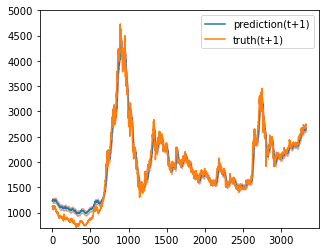

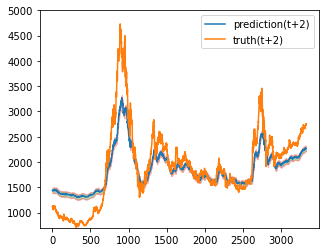

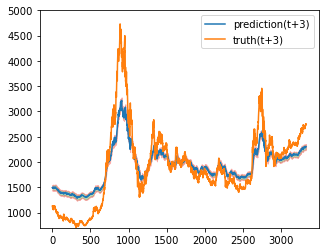

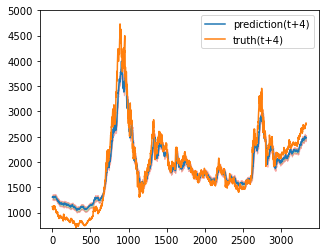

Train epoch:1 	Loss: 1.607710| Loss_in: 2.392886| Loss_out: 1.274690


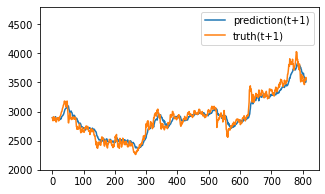

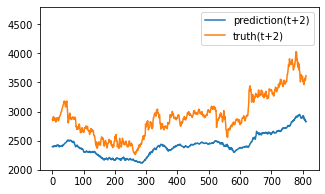

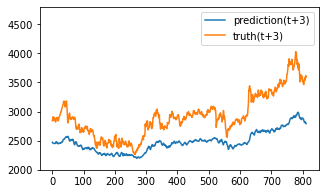

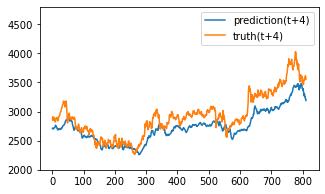

Test epoch:1 	Loss: 1.018598

Epoch: 2


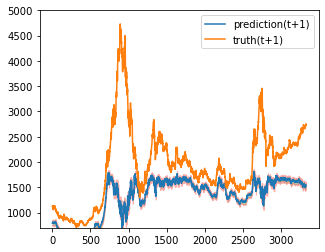

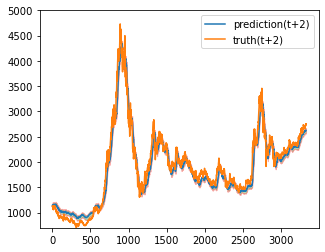

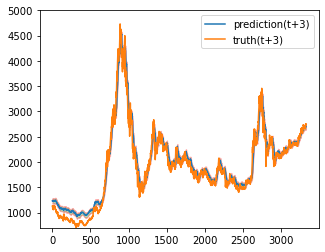

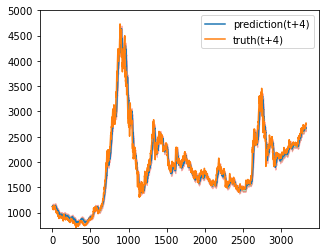

Train epoch:2 	Loss: 0.601431| Loss_in: 0.809109| Loss_out: 0.415612


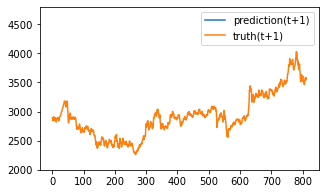

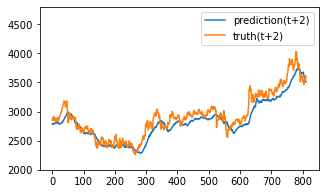

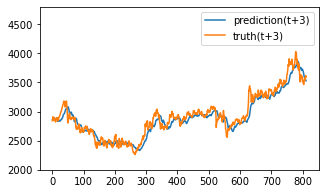

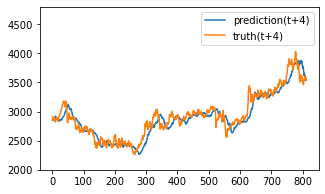

Test epoch:2 	Loss: 2.037252

Epoch: 3


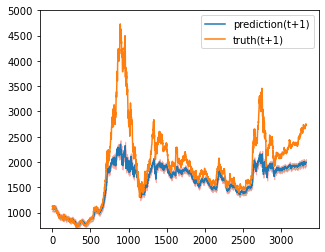

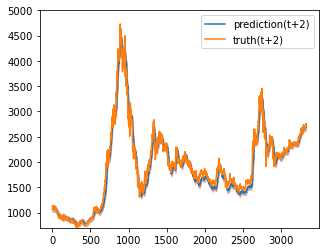

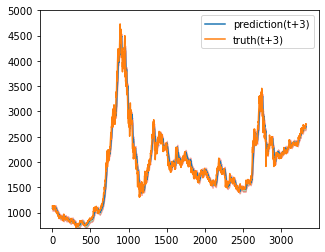

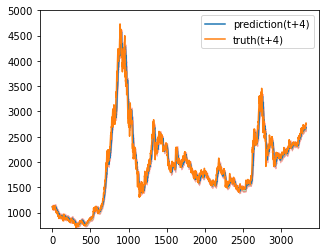

Train epoch:3 	Loss: -3.065358| Loss_in: 0.392883| Loss_out: 0.209581


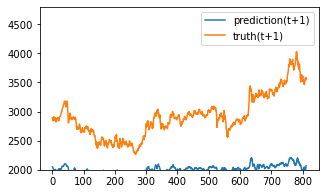

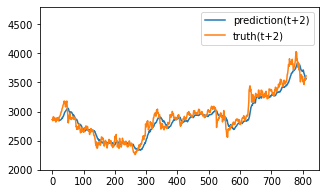

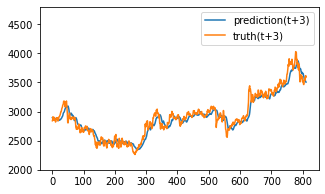

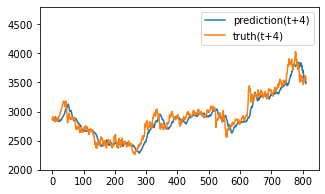

Test epoch:3 	Loss: 1.307234

Epoch: 4


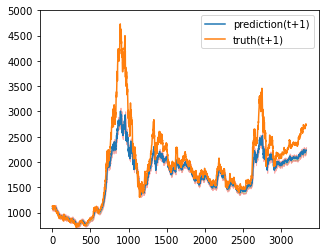

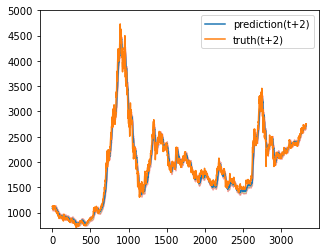

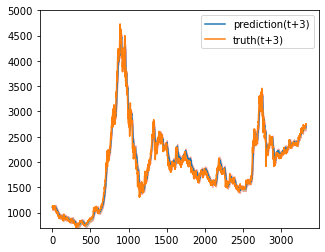

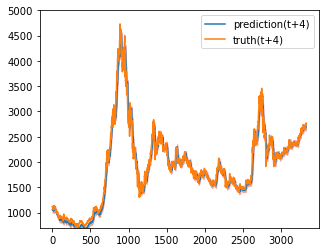

Train epoch:4 	Loss: -6.438764| Loss_in: 0.247378| Loss_out: 0.140206


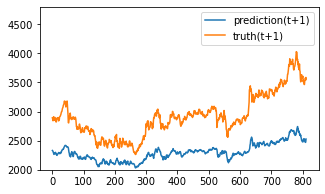

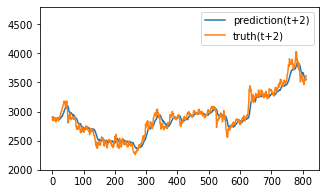

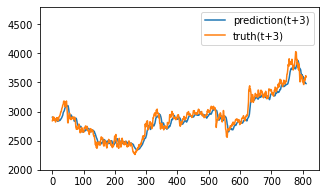

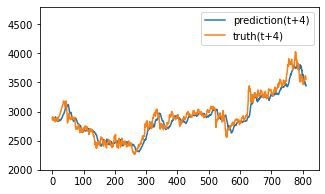

Test epoch:4 	Loss: 0.908110

Epoch: 5


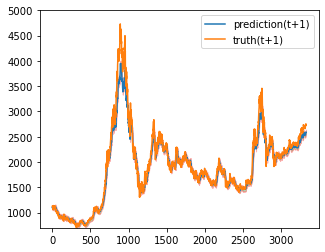

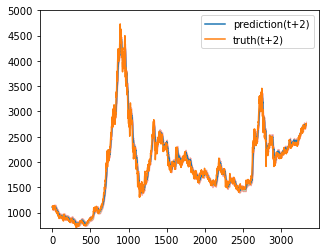

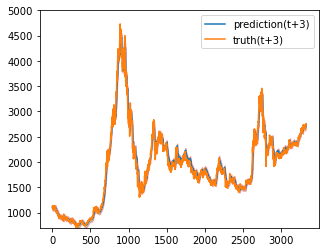

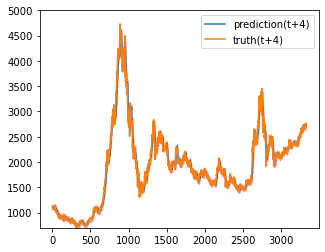

Train epoch:5 	Loss: -8.268023| Loss_in: 0.176201| Loss_out: 0.105068


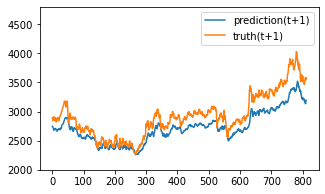

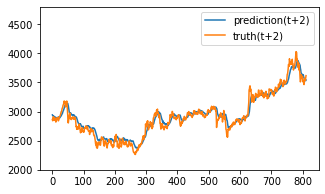

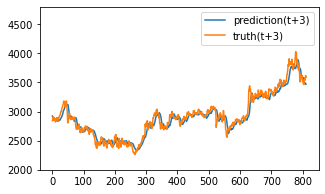

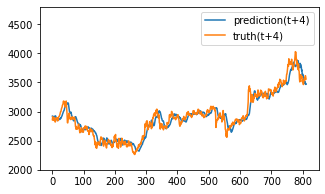

Test epoch:5 	Loss: 0.369747

Epoch: 6


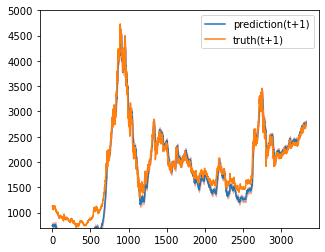

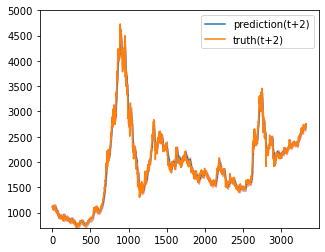

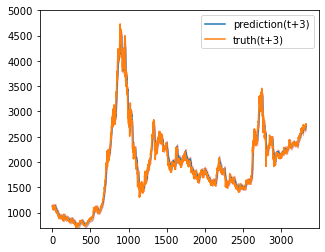

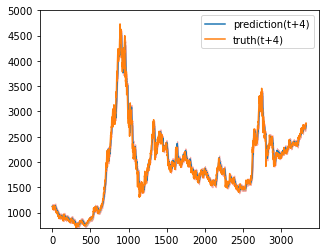

Train epoch:6 	Loss: -7.995247| Loss_in: 0.149098| Loss_out: 0.087831


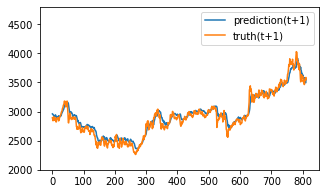

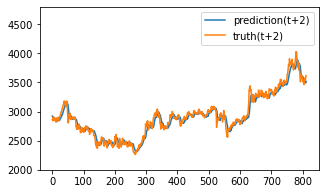

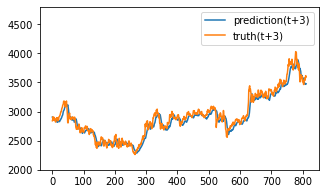

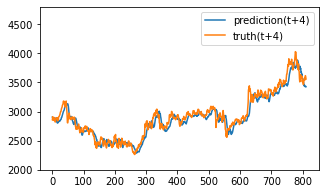

Test epoch:6 	Loss: 0.235495

Epoch: 7


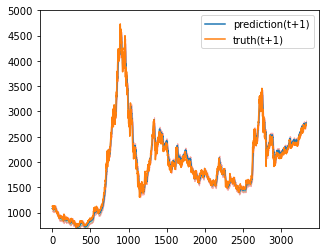

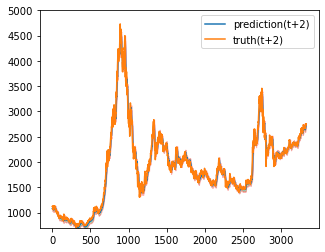

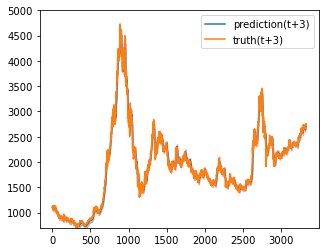

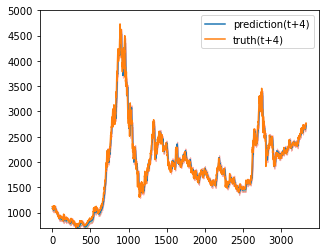

Train epoch:7 	Loss: -9.222762| Loss_in: 0.104523| Loss_out: 0.078418


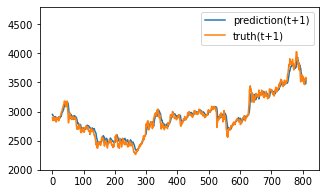

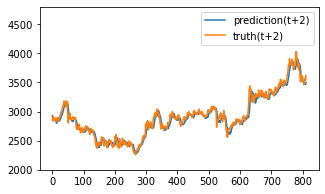

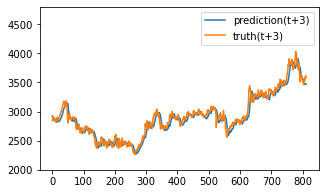

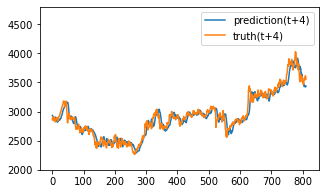

Test epoch:7 	Loss: 0.220500

Epoch: 8


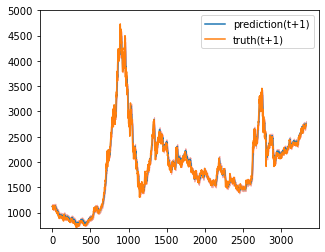

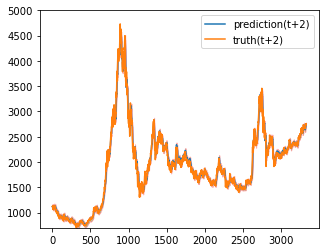

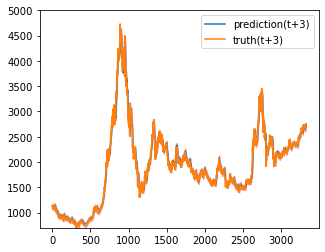

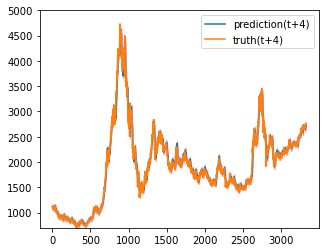

Train epoch:8 	Loss: -11.470165| Loss_in: 0.089167| Loss_out: 0.061273


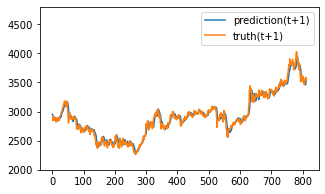

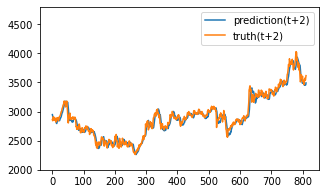

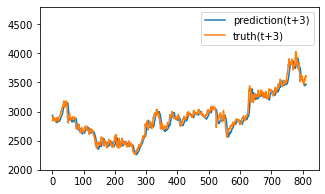

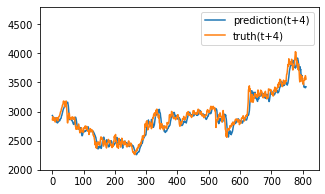

Test epoch:8 	Loss: 0.216573

Epoch: 9


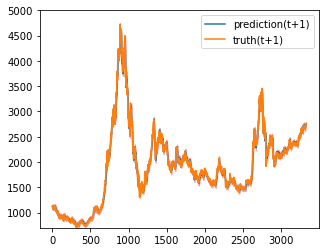

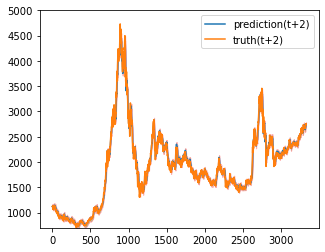

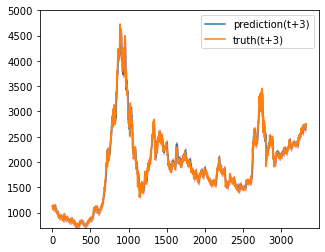

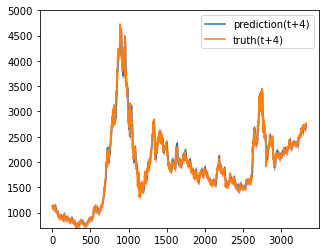

Train epoch:9 	Loss: -12.997155| Loss_in: 0.078260| Loss_out: 0.054143


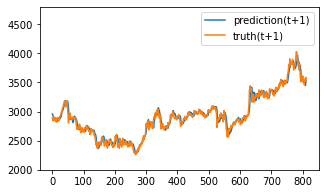

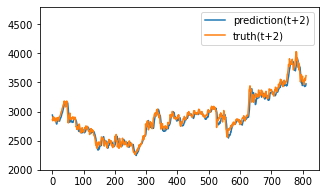

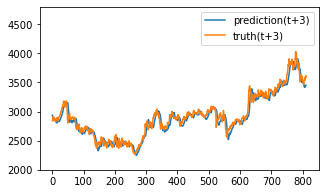

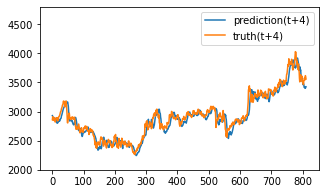

Test epoch:9 	Loss: 0.218178

Epoch: 10


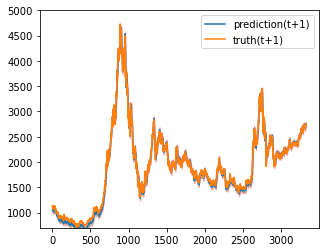

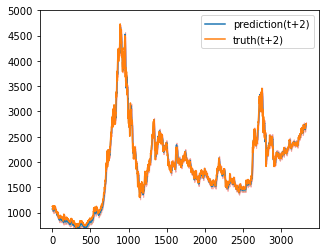

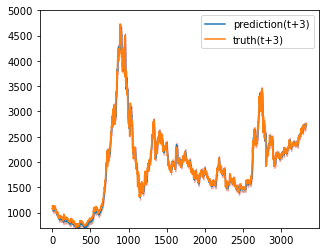

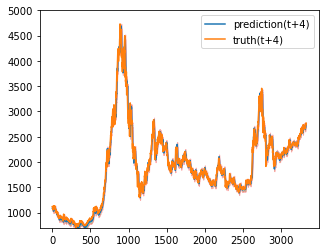

Train epoch:10 	Loss: -14.502333| Loss_in: 0.067236| Loss_out: 0.049405


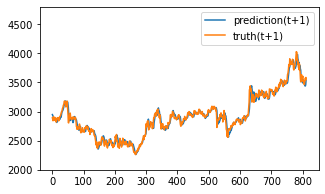

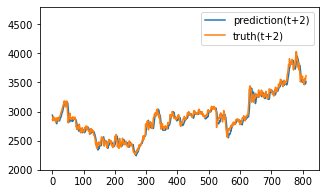

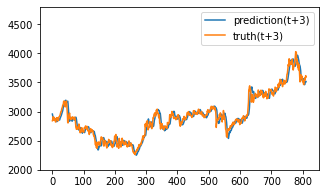

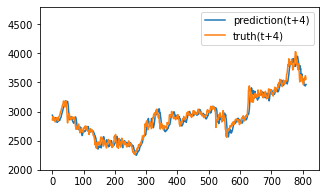

Test epoch:10 	Loss: 0.207300

Epoch: 11


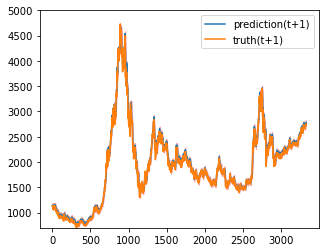

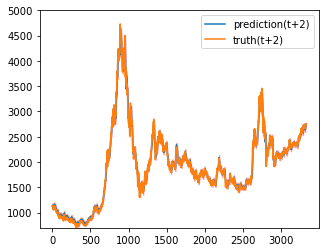

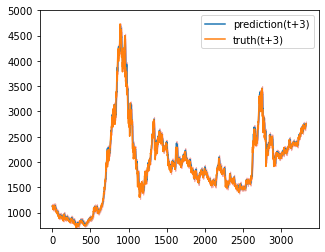

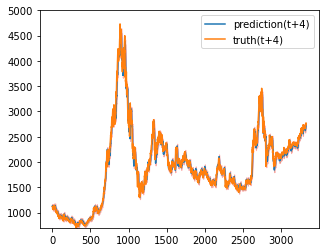

Train epoch:11 	Loss: -15.329593| Loss_in: 0.060161| Loss_out: 0.045124


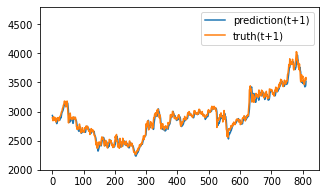

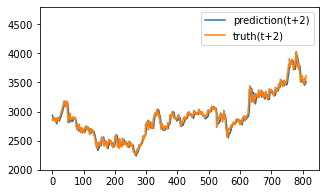

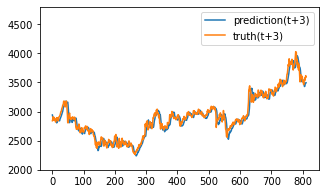

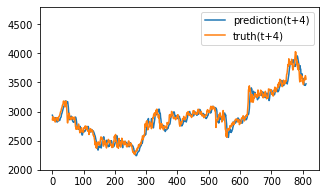

Test epoch:11 	Loss: 0.205301

Epoch: 12


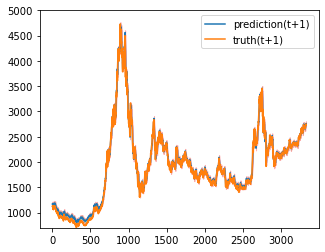

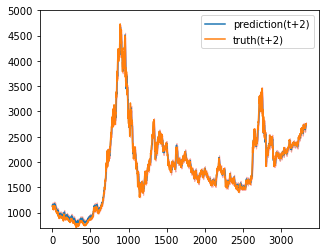

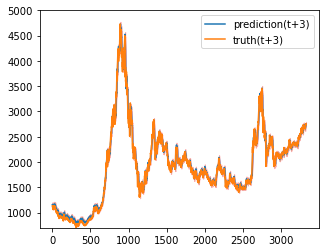

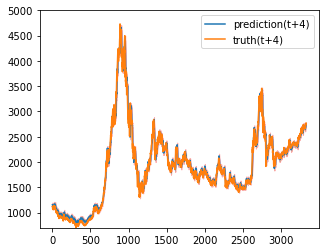

Train epoch:12 	Loss: -15.951366| Loss_in: 0.052458| Loss_out: 0.040600


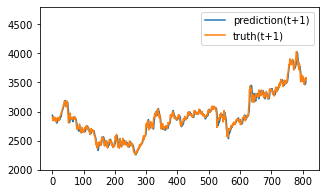

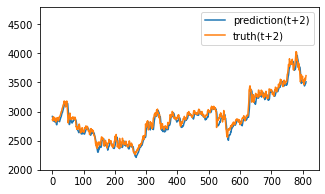

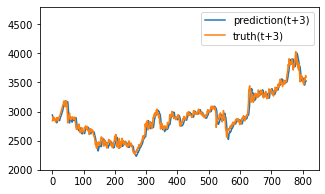

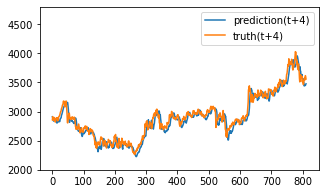

Test epoch:12 	Loss: 0.206816

Epoch: 13


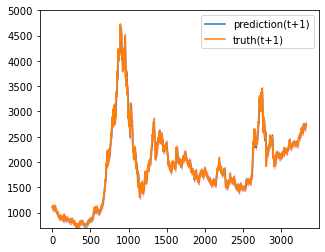

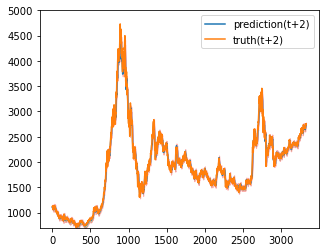

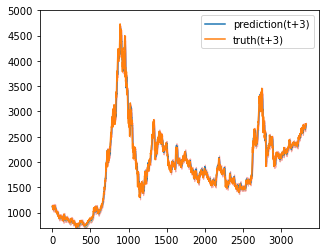

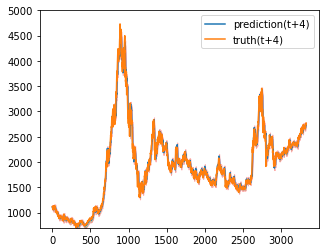

Train epoch:13 	Loss: -14.752321| Loss_in: 0.055065| Loss_out: 0.039438


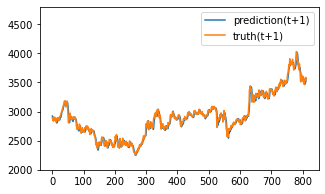

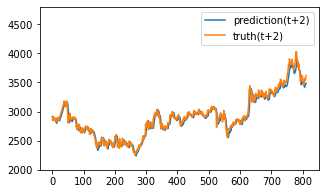

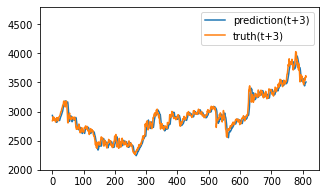

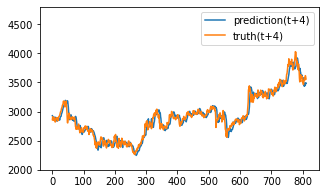

Test epoch:13 	Loss: 0.197352

Epoch: 14


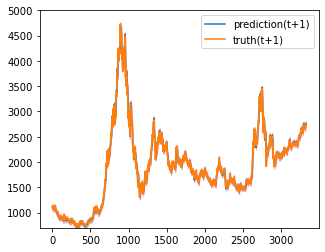

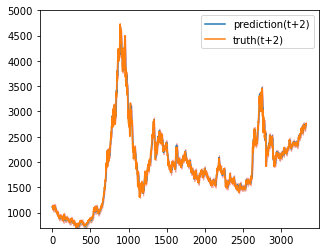

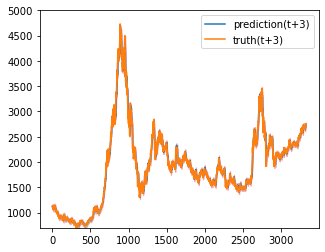

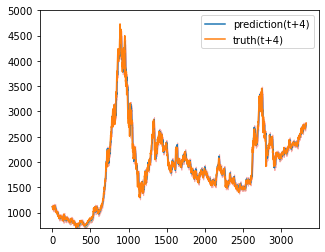

Train epoch:14 	Loss: -17.011690| Loss_in: 0.042648| Loss_out: 0.036699


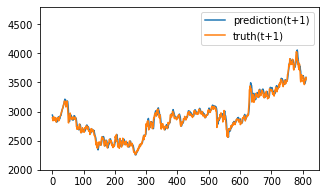

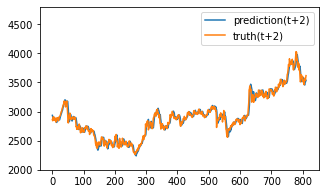

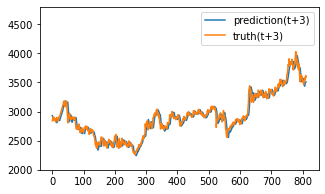

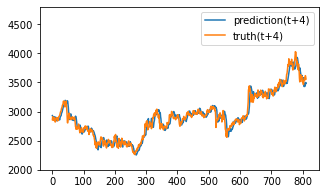

Test epoch:14 	Loss: 0.191321

Epoch: 15


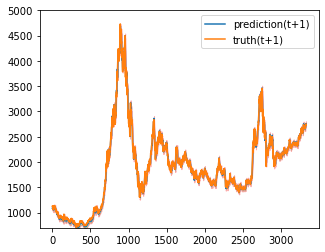

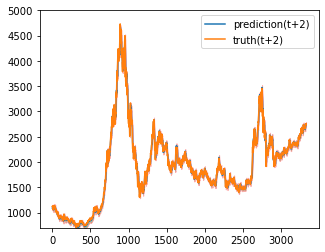

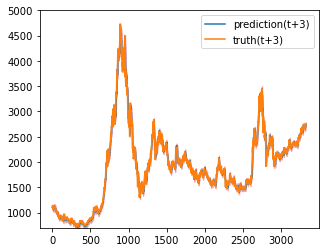

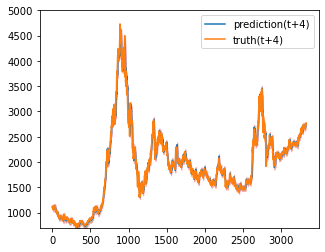

Train epoch:15 	Loss: -17.355403| Loss_in: 0.039243| Loss_out: 0.032652


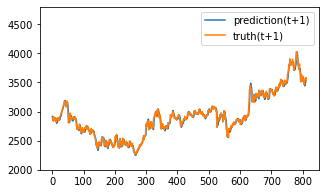

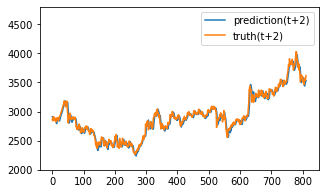

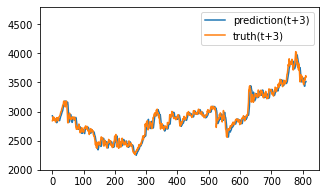

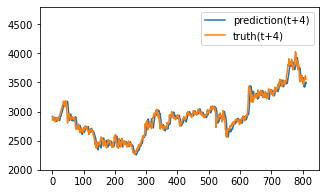

Test epoch:15 	Loss: 0.188604

Epoch: 16


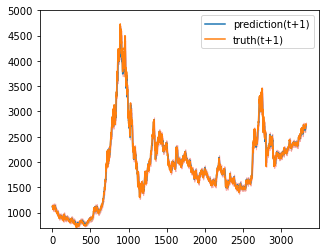

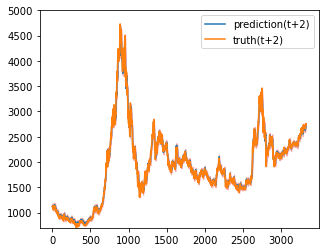

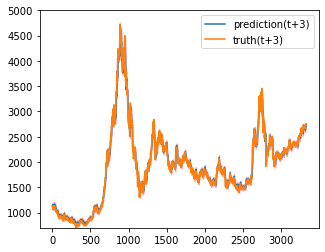

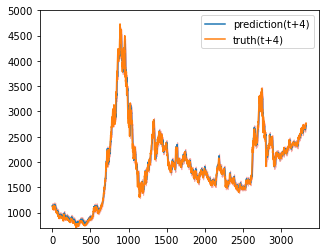

Train epoch:16 	Loss: -17.026461| Loss_in: 0.037135| Loss_out: 0.029590


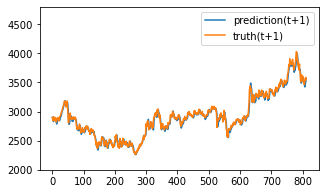

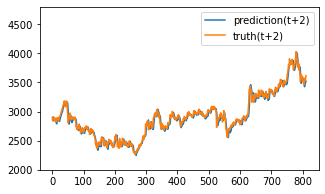

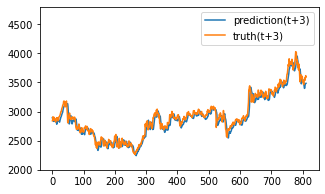

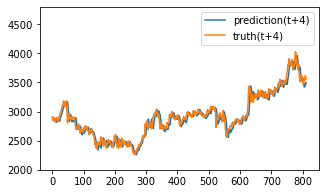

Test epoch:16 	Loss: 0.193676

Epoch: 17


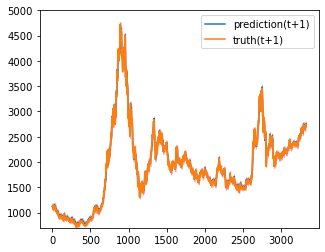

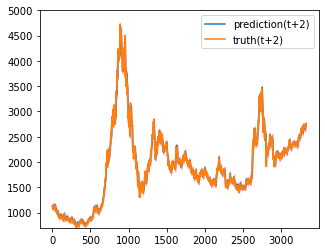

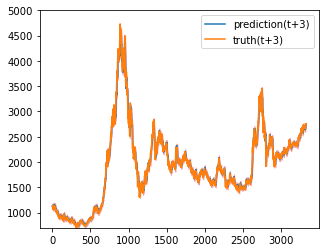

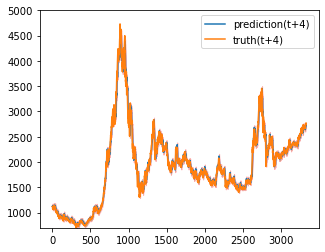

Train epoch:17 	Loss: -17.225463| Loss_in: 0.035361| Loss_out: 0.027893


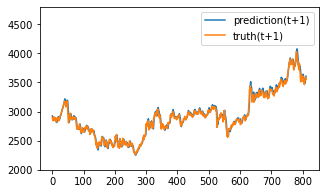

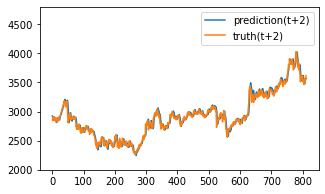

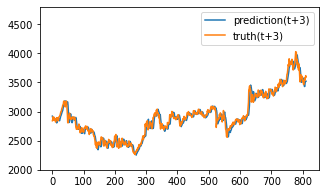

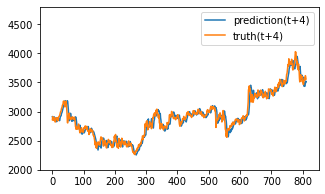

Test epoch:17 	Loss: 0.186038

Epoch: 18


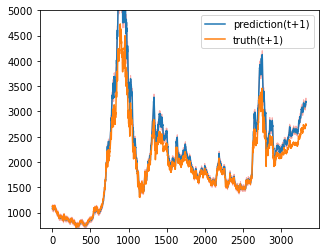

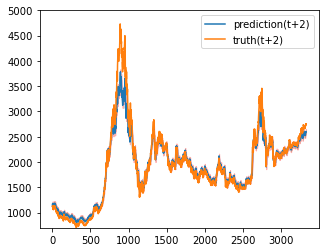

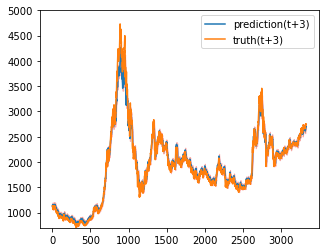

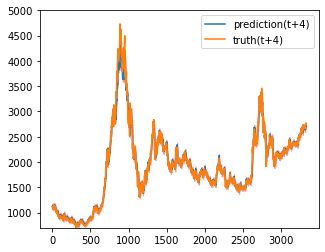

Train epoch:18 	Loss: -13.699301| Loss_in: 0.045940| Loss_out: 0.026464


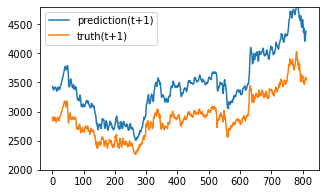

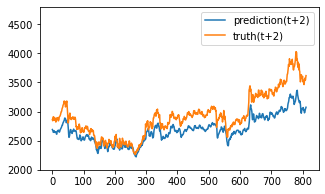

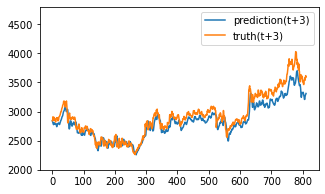

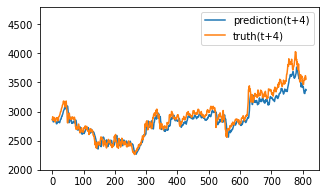

Test epoch:18 	Loss: 0.857811

Epoch: 19


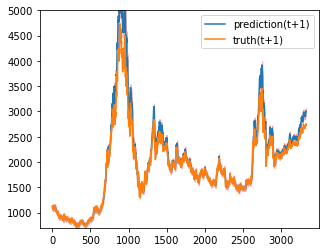

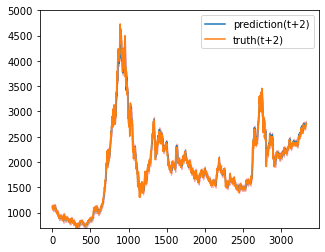

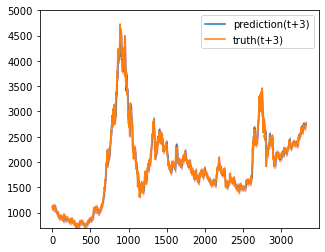

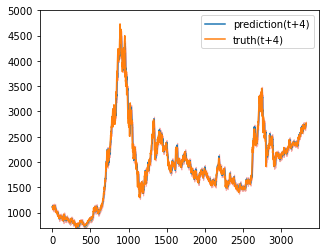

Train epoch:19 	Loss: -13.094968| Loss_in: 0.042498| Loss_out: 0.033419


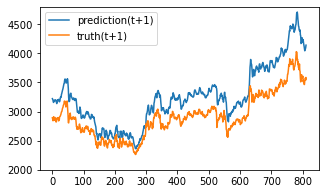

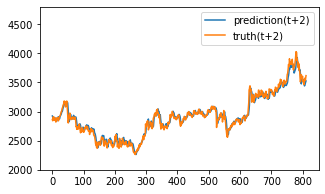

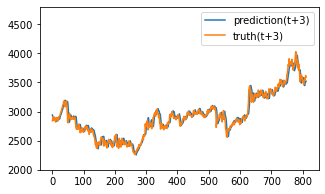

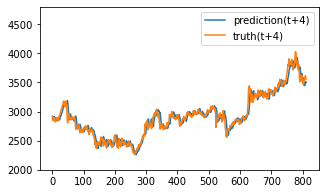

Test epoch:19 	Loss: 0.499631

Epoch: 20


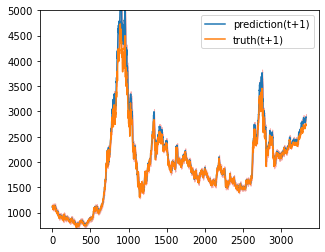

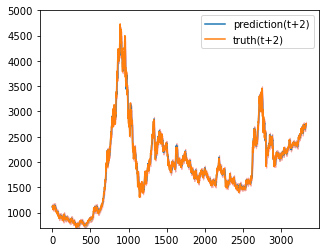

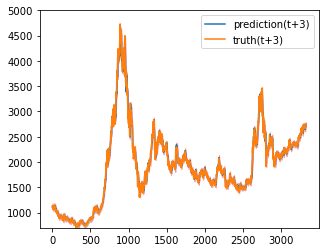

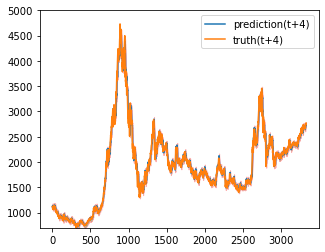

Train epoch:20 	Loss: -15.392435| Loss_in: 0.031309| Loss_out: 0.030364


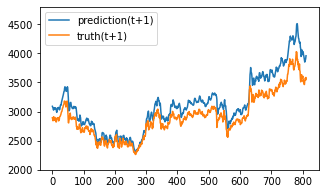

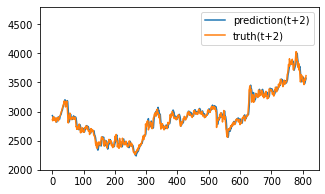

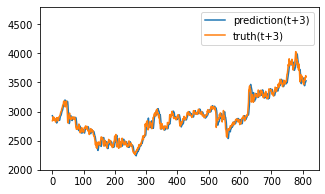

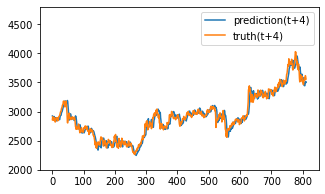

Test epoch:20 	Loss: 0.341844

Epoch: 21


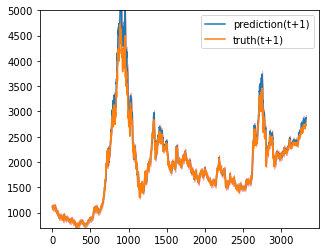

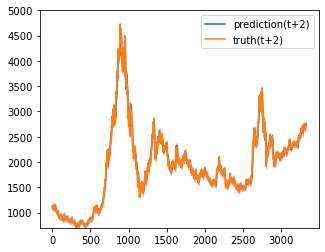

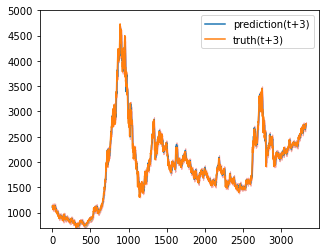

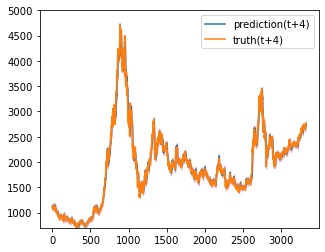

Train epoch:21 	Loss: -16.490251| Loss_in: 0.027817| Loss_out: 0.025775


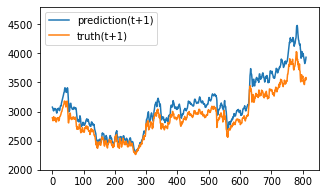

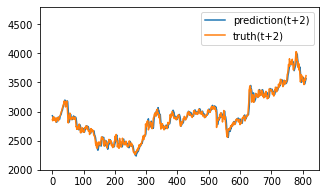

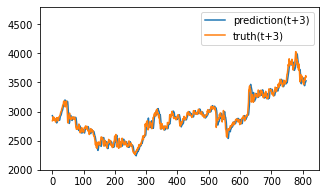

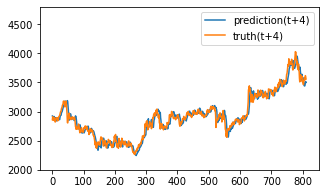

Test epoch:21 	Loss: 0.324523

Epoch: 22


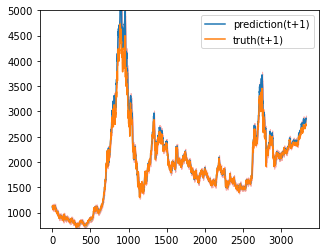

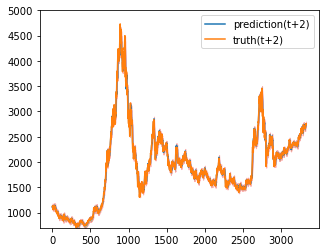

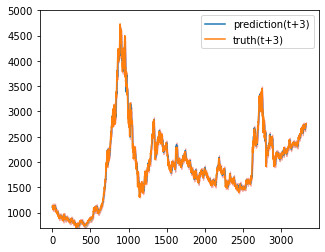

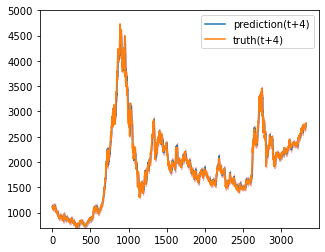

Train epoch:22 	Loss: -16.617965| Loss_in: 0.026267| Loss_out: 0.023568


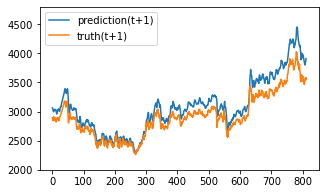

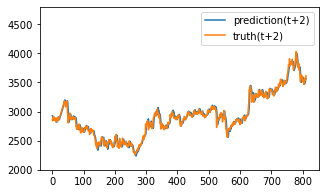

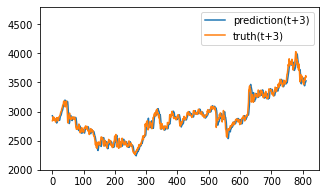

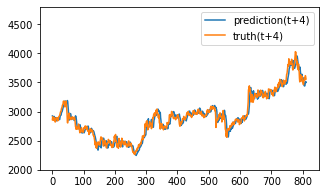

Test epoch:22 	Loss: 0.308657

Epoch: 23


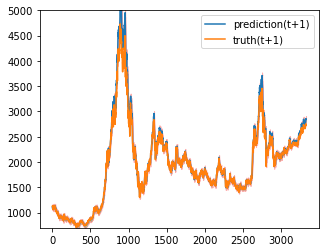

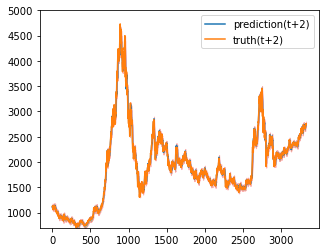

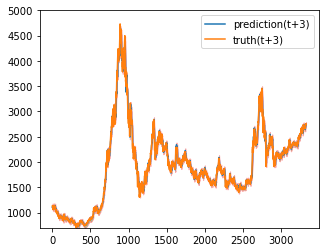

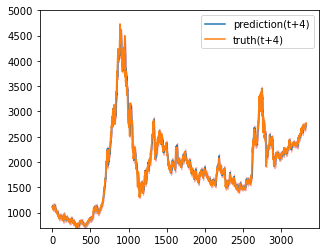

Train epoch:23 	Loss: -16.710684| Loss_in: 0.025158| Loss_out: 0.021769


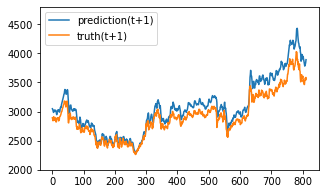

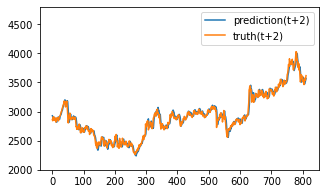

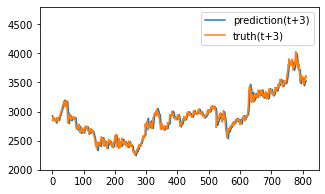

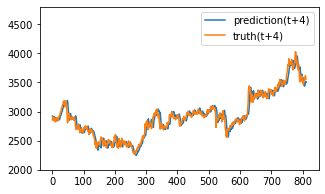

Test epoch:23 	Loss: 0.295033

Epoch: 24


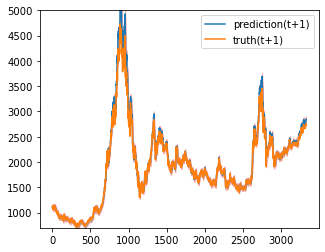

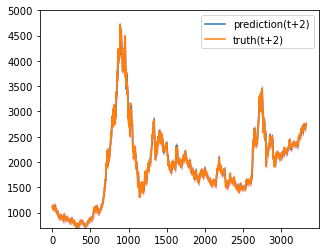

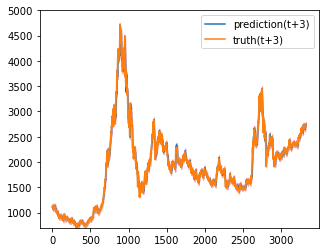

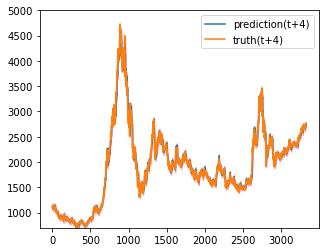

Train epoch:24 	Loss: -16.780773| Loss_in: 0.024192| Loss_out: 0.020687


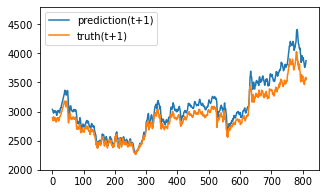

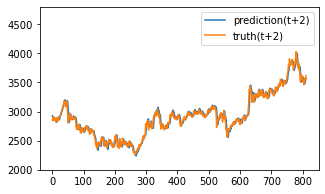

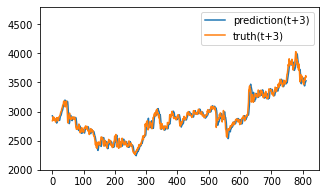

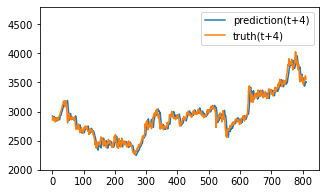

Test epoch:24 	Loss: 0.282496

Epoch: 25


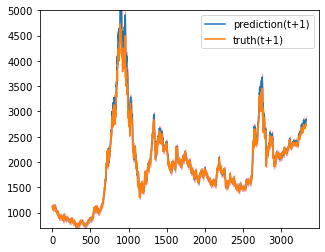

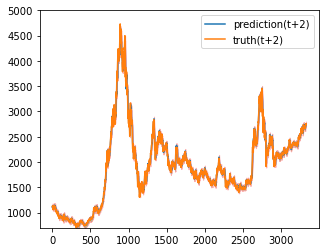

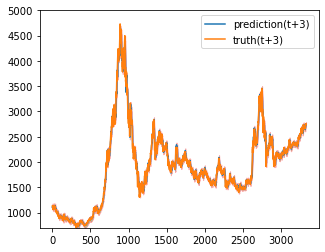

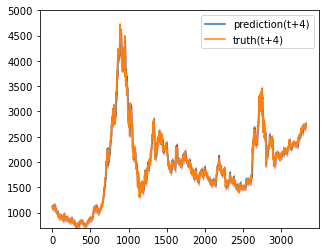

Train epoch:25 	Loss: -16.867549| Loss_in: 0.023254| Loss_out: 0.019603


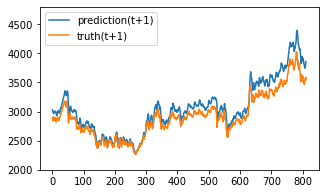

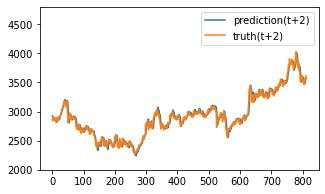

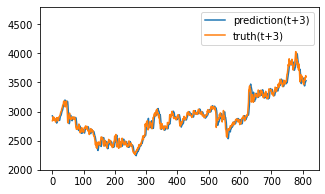

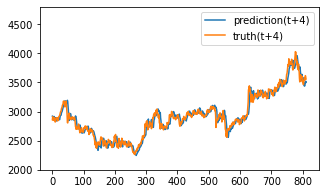

Test epoch:25 	Loss: 0.273529

Epoch: 26


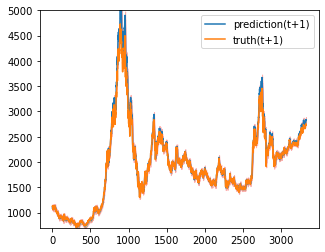

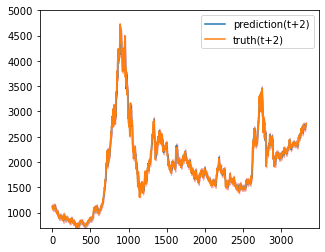

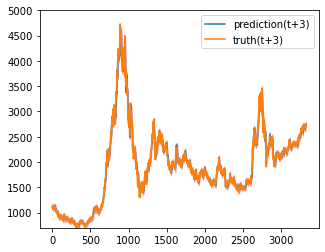

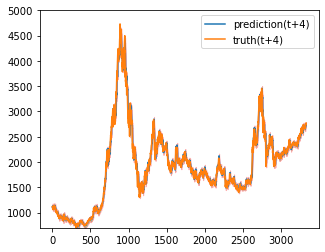

Train epoch:26 	Loss: -16.746740| Loss_in: 0.022519| Loss_out: 0.019014


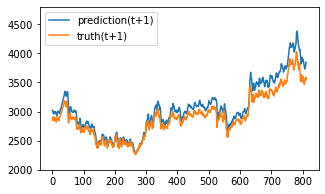

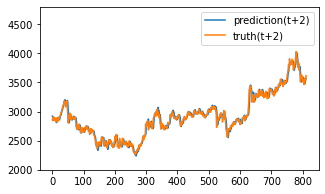

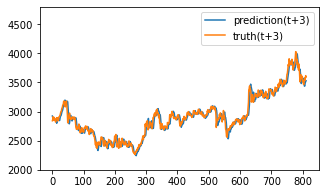

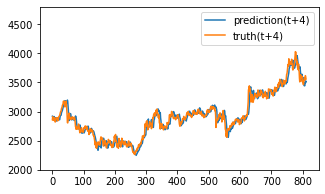

Test epoch:26 	Loss: 0.266752

Epoch: 27


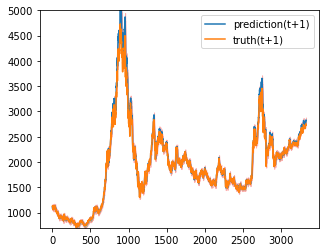

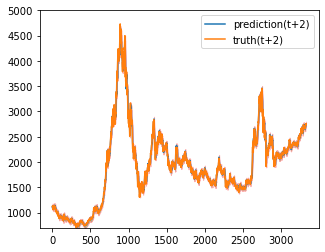

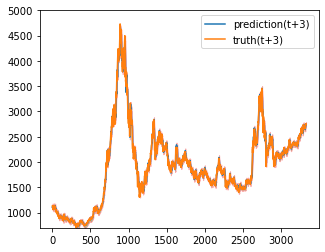

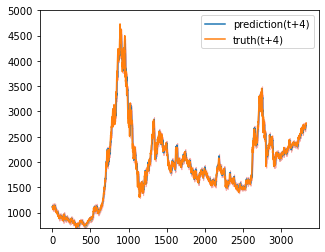

Train epoch:27 	Loss: -17.006809| Loss_in: 0.021752| Loss_out: 0.018169


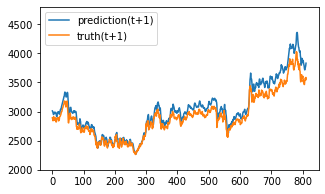

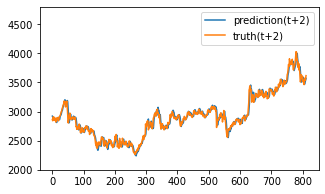

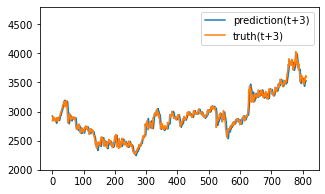

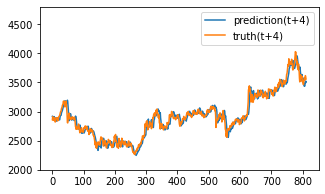

Test epoch:27 	Loss: 0.256290

Epoch: 28


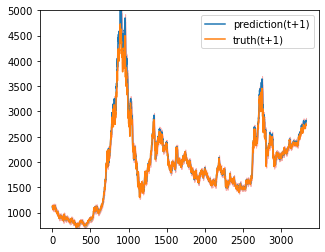

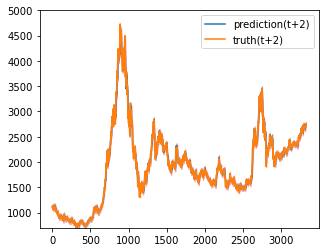

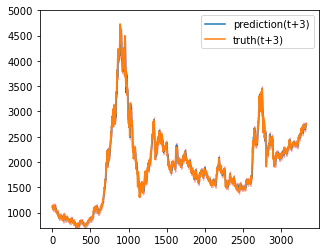

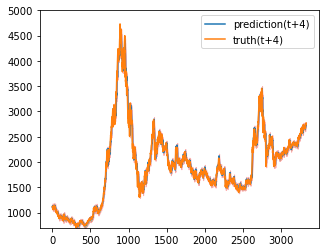

Train epoch:28 	Loss: -17.098364| Loss_in: 0.021077| Loss_out: 0.017668


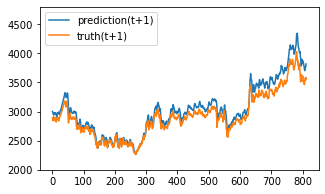

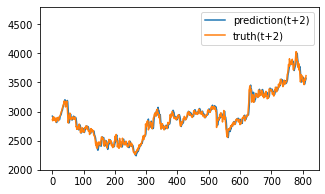

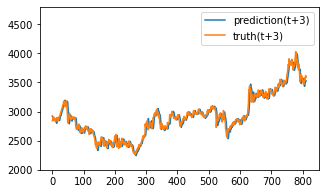

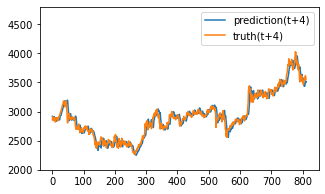

Test epoch:28 	Loss: 0.248559

Epoch: 29


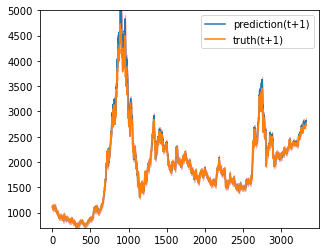

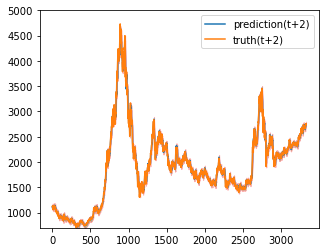

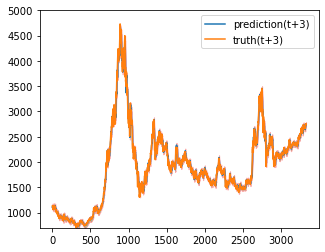

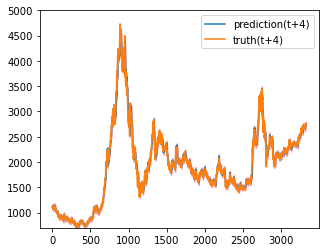

Train epoch:29 	Loss: -17.166973| Loss_in: 0.020465| Loss_out: 0.017406


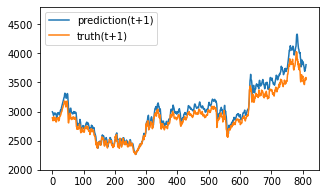

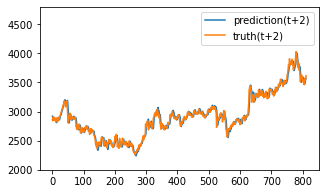

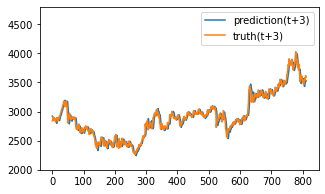

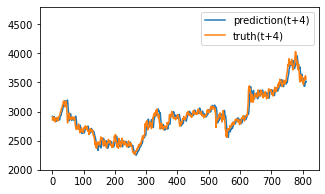

Test epoch:29 	Loss: 0.241595

Epoch: 30


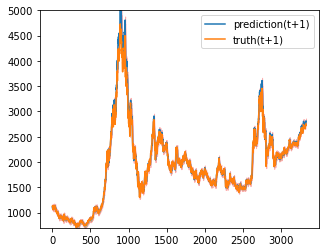

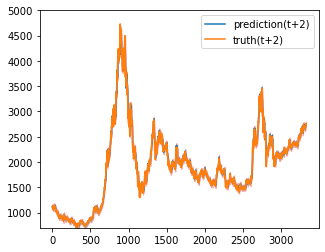

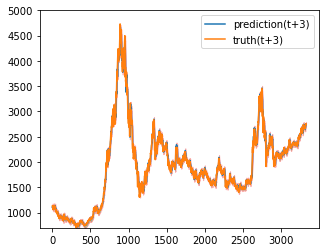

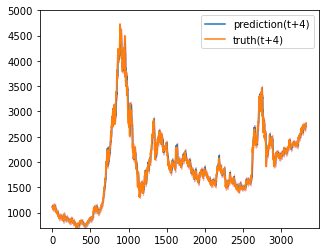

Train epoch:30 	Loss: -17.236019| Loss_in: 0.019992| Loss_out: 0.016858


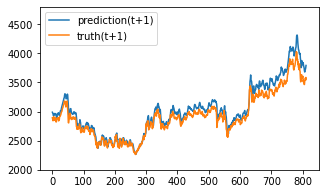

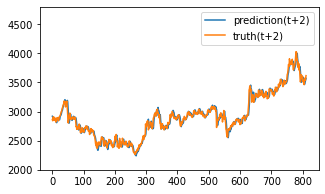

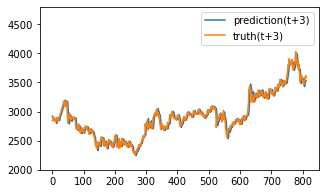

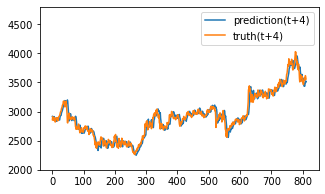

Test epoch:30 	Loss: 0.234807

Epoch: 31


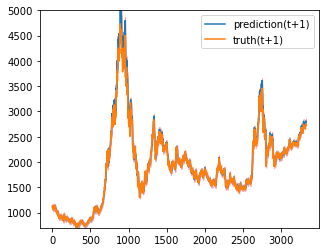

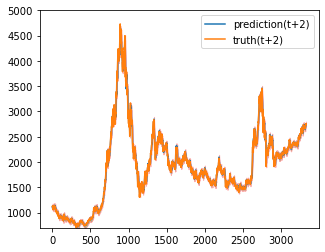

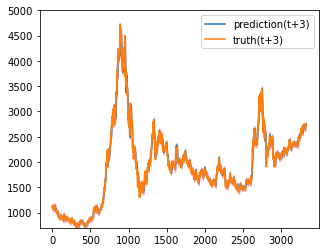

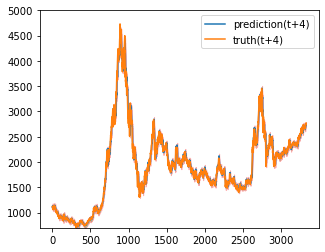

Train epoch:31 	Loss: -17.305374| Loss_in: 0.019491| Loss_out: 0.016459


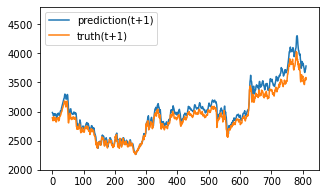

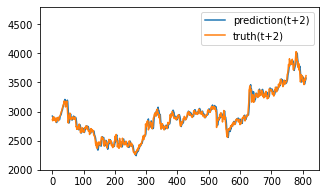

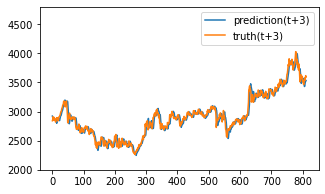

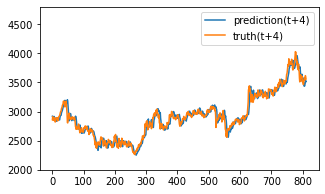

Test epoch:31 	Loss: 0.230223

Epoch: 32


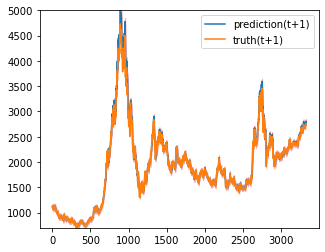

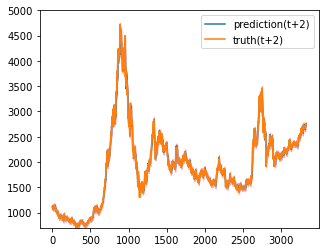

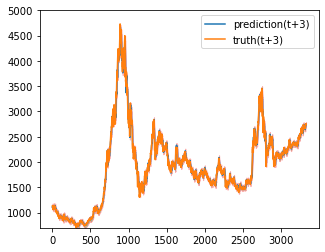

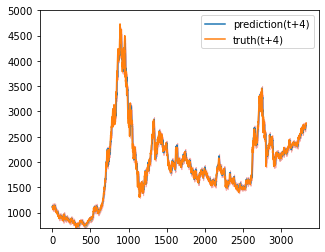

Train epoch:32 	Loss: -17.371048| Loss_in: 0.019015| Loss_out: 0.015905


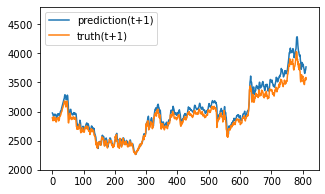

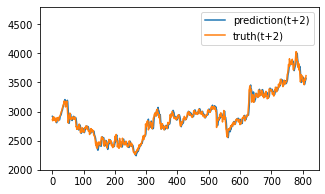

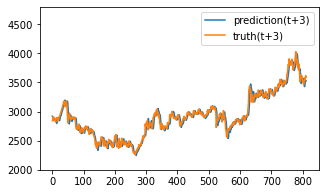

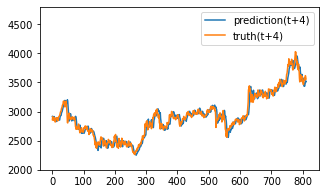

Test epoch:32 	Loss: 0.222888

Epoch: 33


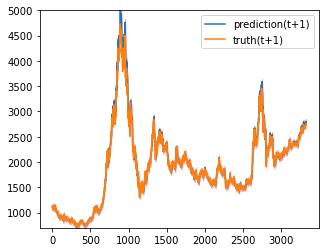

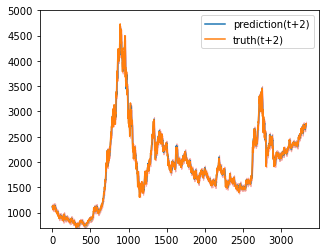

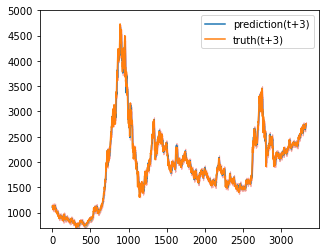

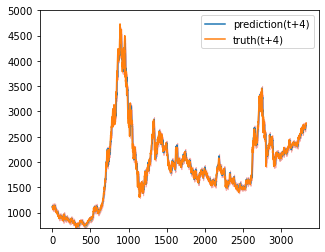

Train epoch:33 	Loss: -17.429321| Loss_in: 0.018470| Loss_out: 0.015502


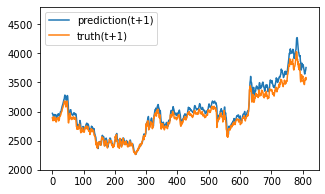

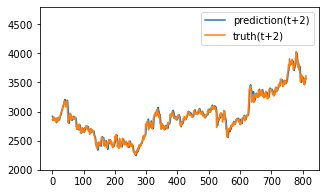

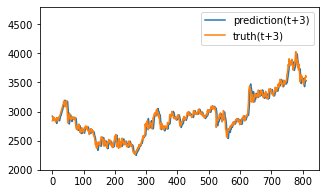

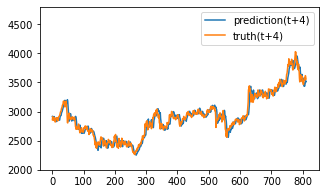

Test epoch:33 	Loss: 0.218215

Epoch: 34


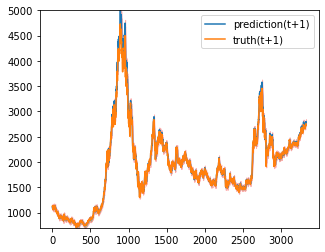

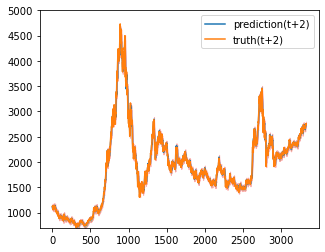

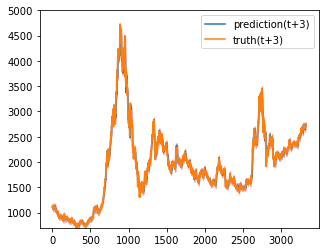

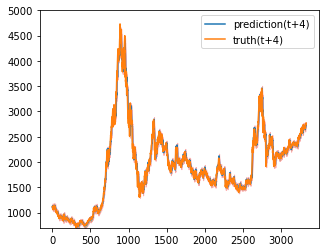

Train epoch:34 	Loss: -17.486566| Loss_in: 0.018085| Loss_out: 0.015098


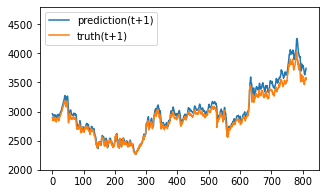

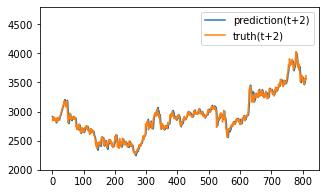

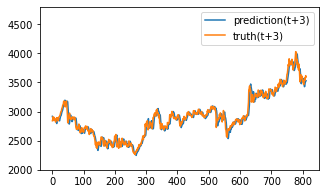

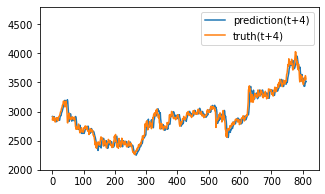

Test epoch:34 	Loss: 0.212951

Epoch: 35


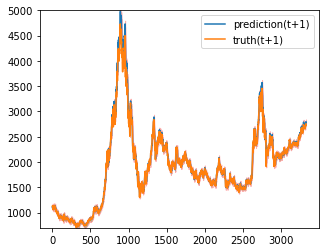

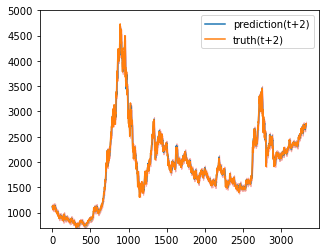

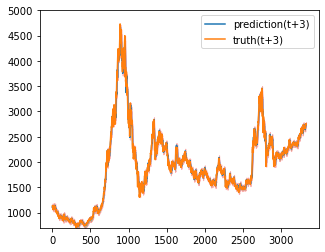

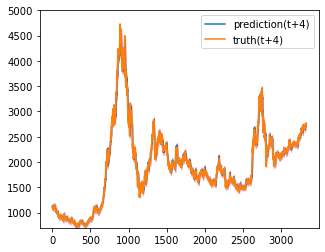

Train epoch:35 	Loss: -17.545227| Loss_in: 0.017661| Loss_out: 0.014855


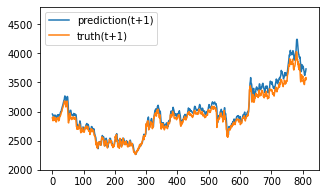

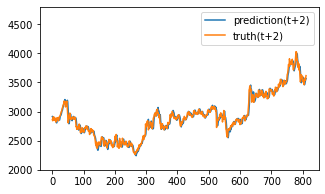

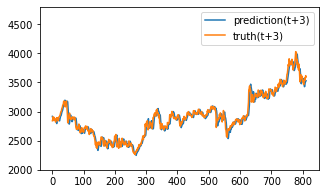

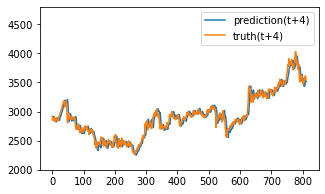

Test epoch:35 	Loss: 0.208950

Epoch: 36


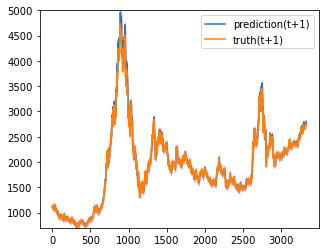

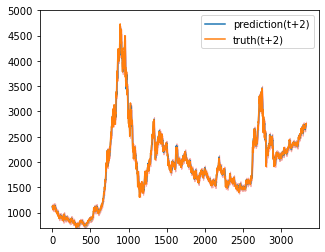

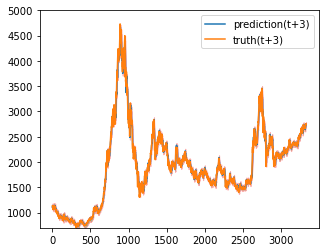

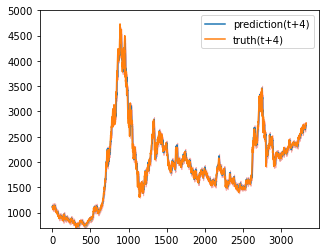

Train epoch:36 	Loss: -17.555898| Loss_in: 0.017336| Loss_out: 0.014666


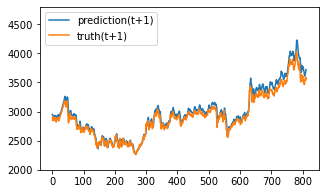

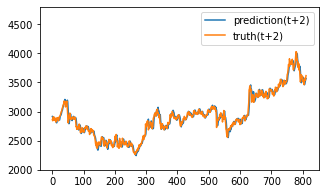

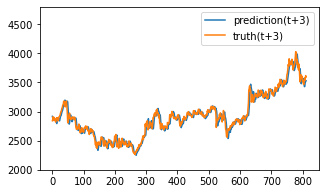

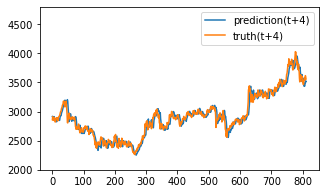

Test epoch:36 	Loss: 0.204489

Epoch: 37


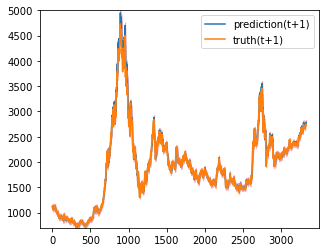

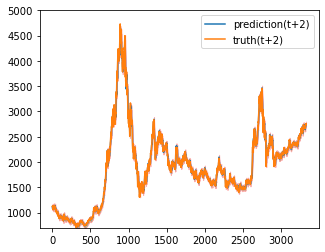

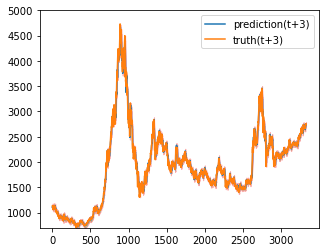

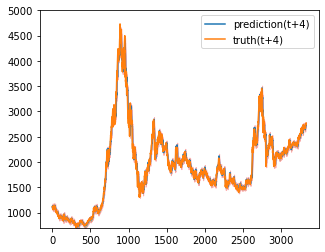

Train epoch:37 	Loss: -17.634763| Loss_in: 0.016987| Loss_out: 0.014303


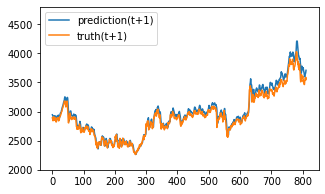

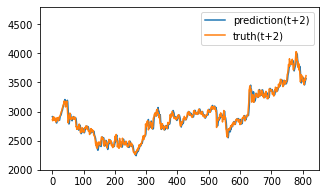

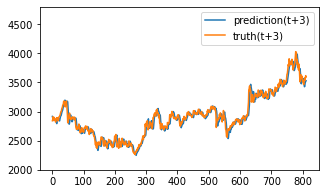

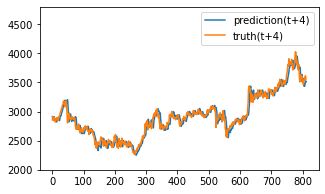

Test epoch:37 	Loss: 0.200499

Epoch: 38


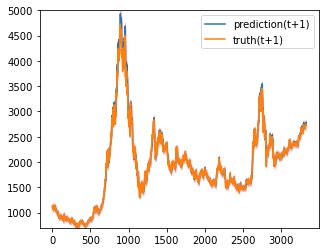

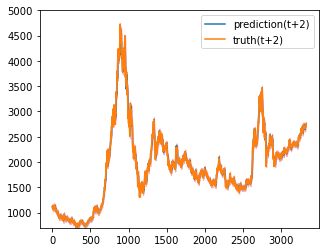

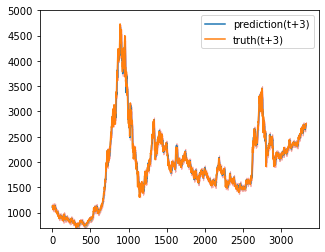

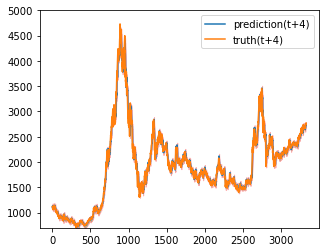

Train epoch:38 	Loss: -17.700999| Loss_in: 0.016680| Loss_out: 0.014057


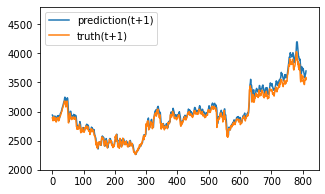

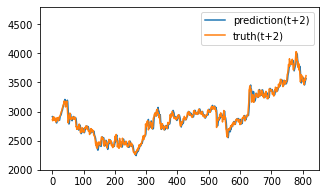

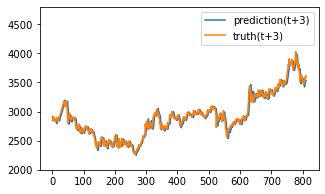

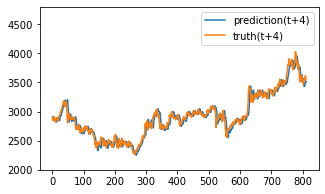

Test epoch:38 	Loss: 0.197302

Epoch: 39


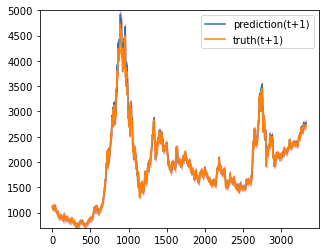

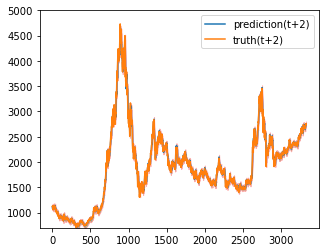

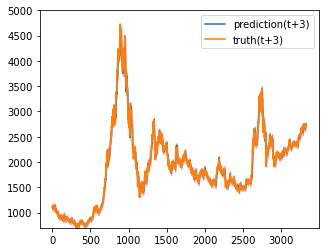

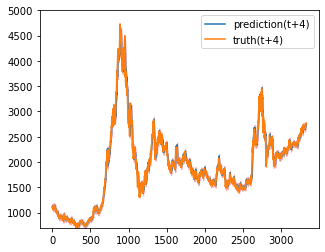

Train epoch:39 	Loss: -17.740843| Loss_in: 0.016330| Loss_out: 0.013805


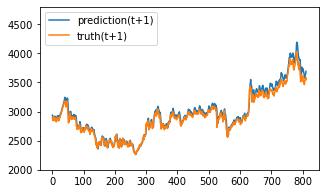

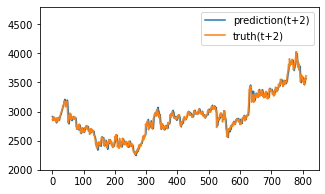

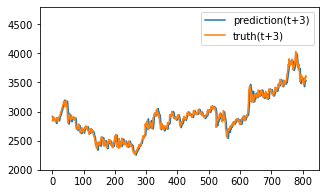

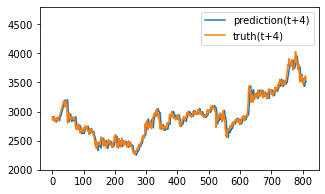

Test epoch:39 	Loss: 0.195331

Epoch: 40


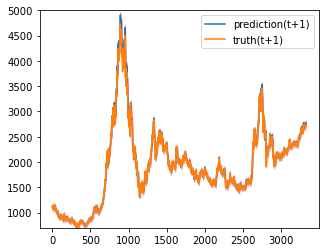

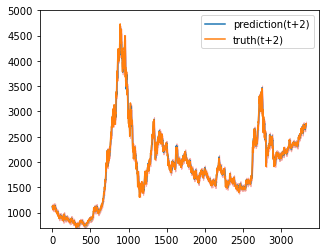

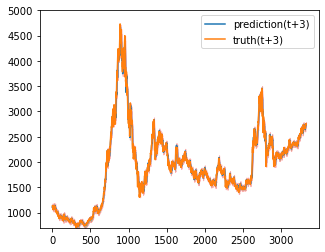

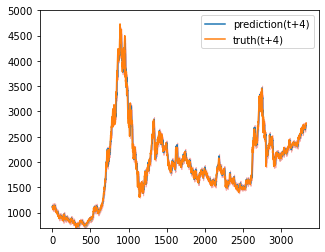

Train epoch:40 	Loss: -17.795274| Loss_in: 0.016078| Loss_out: 0.013554


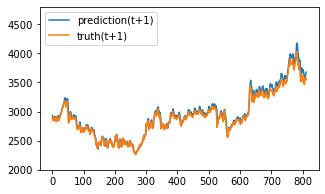

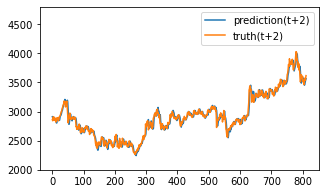

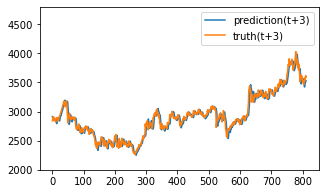

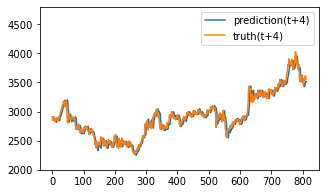

Test epoch:40 	Loss: 0.192334

Epoch: 41


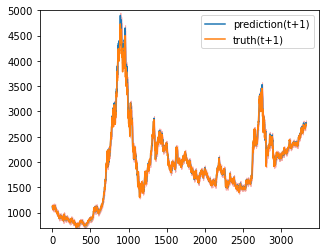

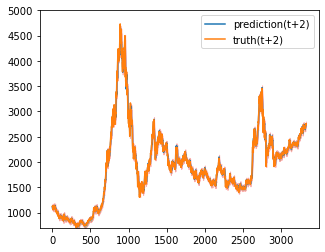

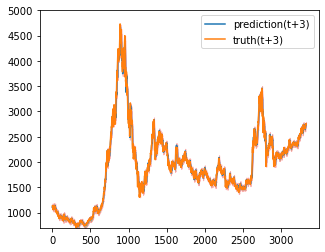

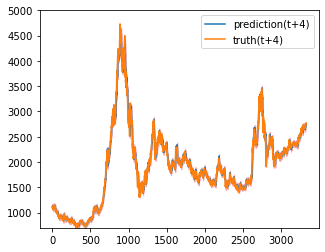

Train epoch:41 	Loss: -17.837649| Loss_in: 0.015785| Loss_out: 0.013427


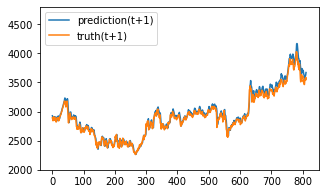

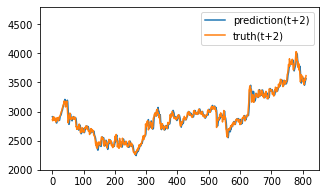

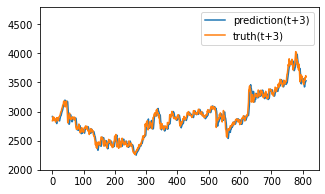

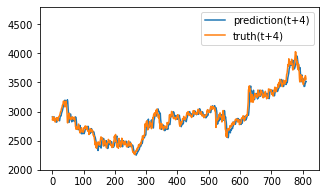

Test epoch:41 	Loss: 0.190542

Epoch: 42


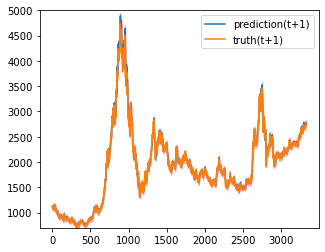

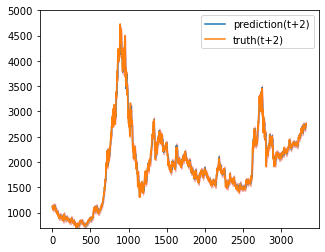

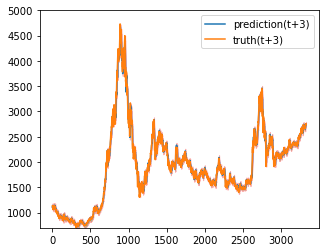

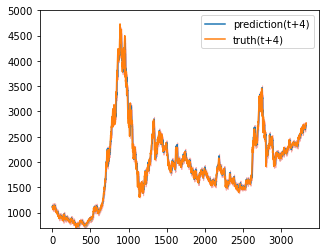

Train epoch:42 	Loss: -17.858545| Loss_in: 0.015526| Loss_out: 0.013289


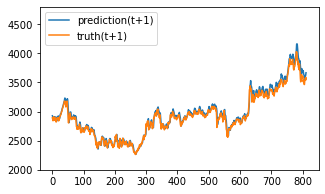

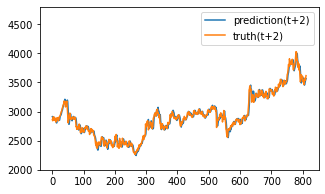

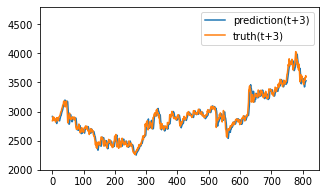

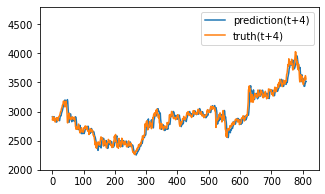

Test epoch:42 	Loss: 0.189777

Epoch: 43


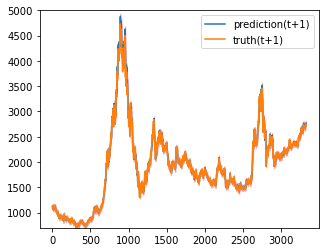

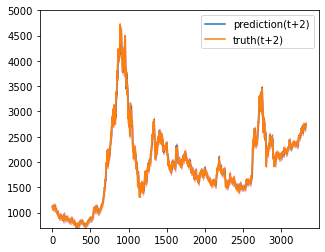

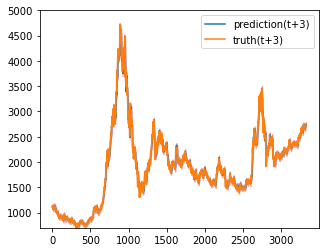

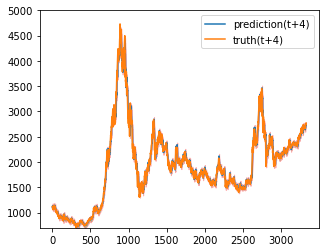

Train epoch:43 	Loss: -17.908953| Loss_in: 0.015351| Loss_out: 0.013086


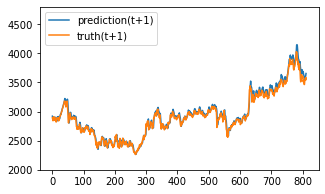

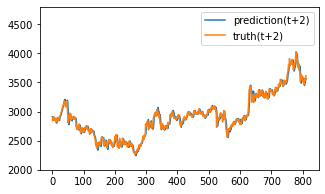

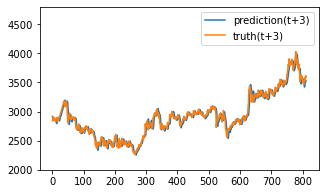

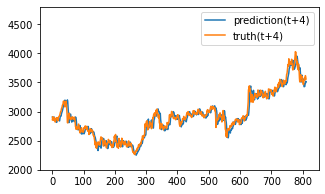

Test epoch:43 	Loss: 0.187668

Epoch: 44


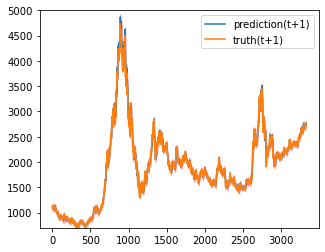

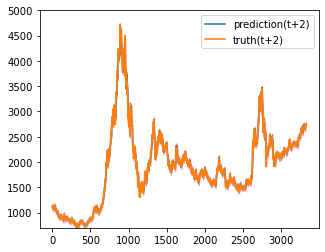

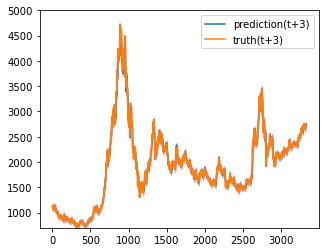

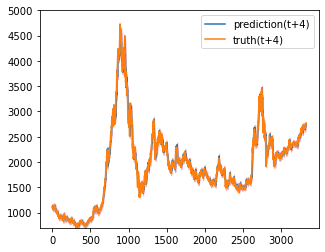

Train epoch:44 	Loss: -17.945284| Loss_in: 0.015118| Loss_out: 0.013048


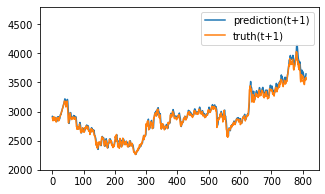

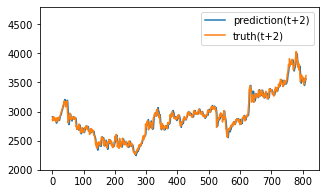

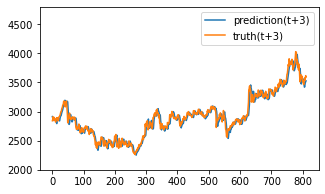

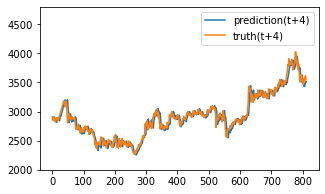

Test epoch:44 	Loss: 0.186288

Epoch: 45


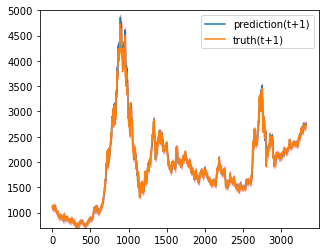

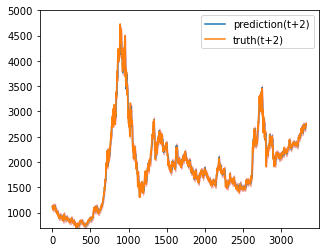

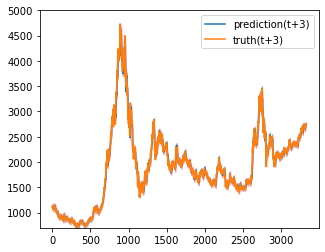

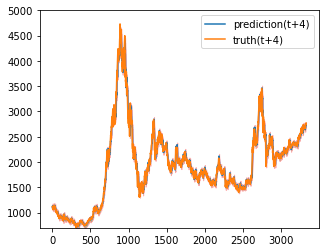

Train epoch:45 	Loss: -17.987765| Loss_in: 0.014912| Loss_out: 0.012716


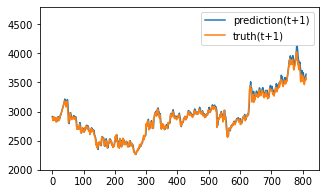

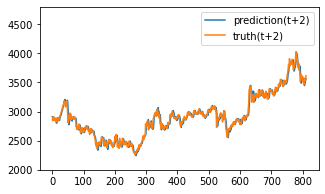

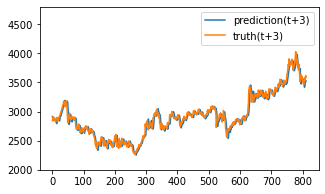

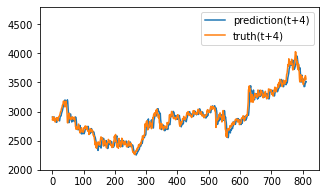

Test epoch:45 	Loss: 0.185471

Epoch: 46


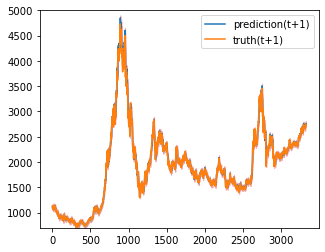

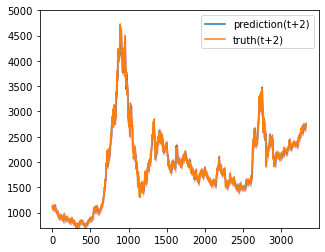

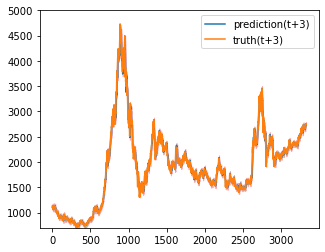

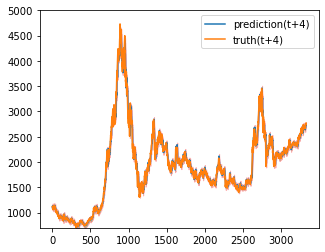

Train epoch:46 	Loss: -18.006921| Loss_in: 0.014678| Loss_out: 0.012632


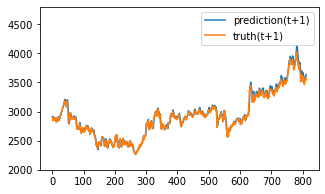

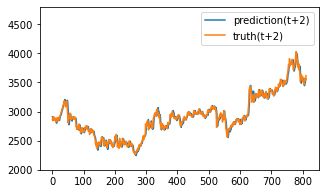

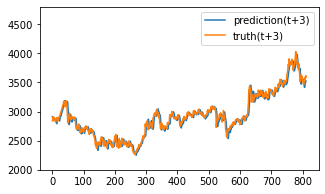

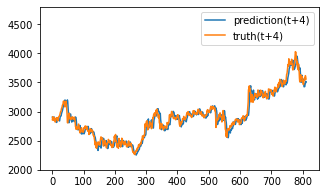

Test epoch:46 	Loss: 0.184925

Epoch: 47


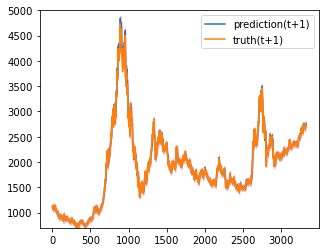

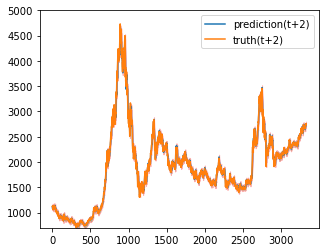

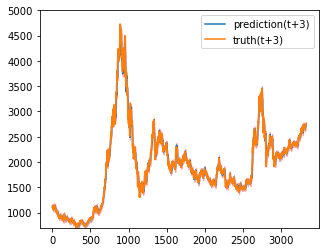

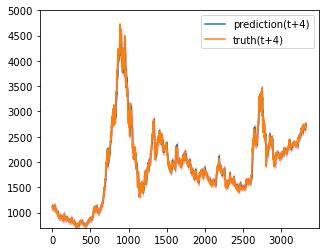

Train epoch:47 	Loss: -18.051323| Loss_in: 0.014521| Loss_out: 0.012424


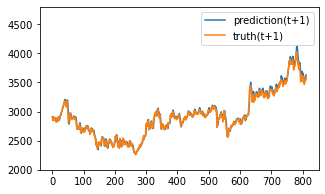

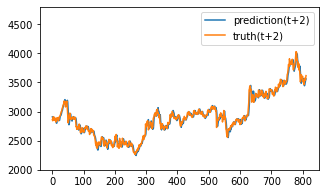

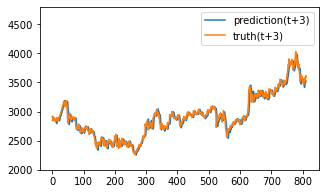

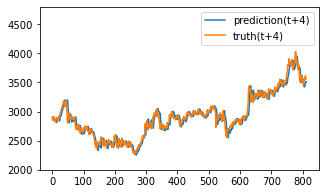

Test epoch:47 	Loss: 0.184152

Epoch: 48


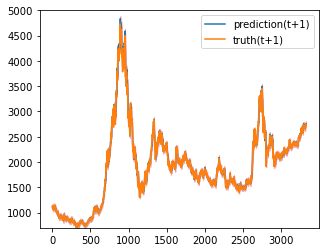

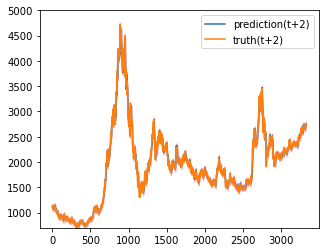

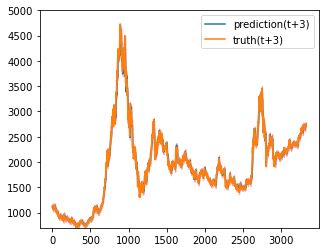

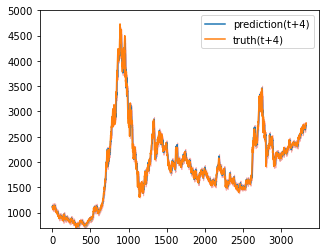

Train epoch:48 	Loss: -18.080489| Loss_in: 0.014310| Loss_out: 0.012303


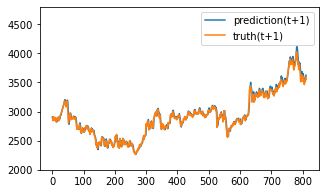

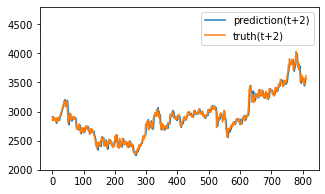

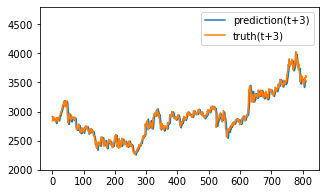

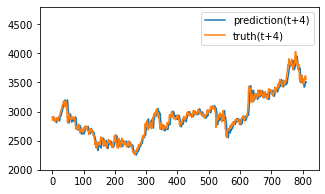

Test epoch:48 	Loss: 0.183824

Epoch: 49


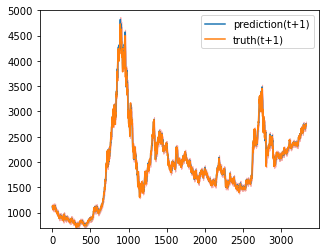

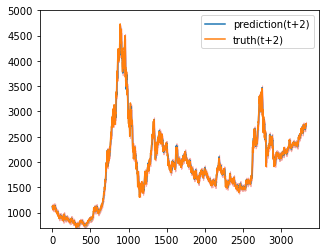

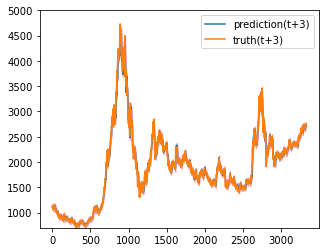

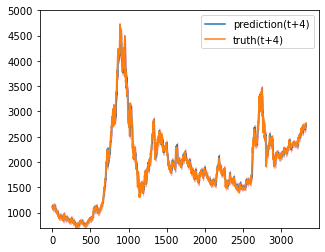

Train epoch:49 	Loss: -17.695398| Loss_in: 0.014166| Loss_out: 0.012313


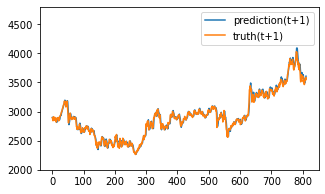

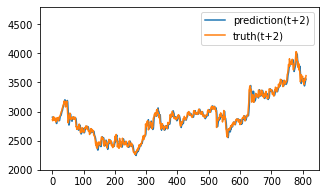

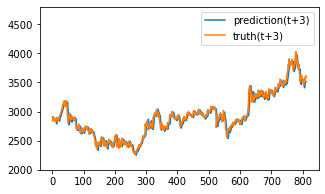

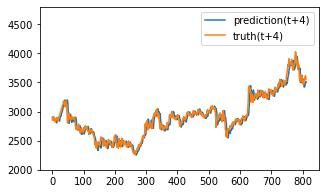

Test epoch:49 	Loss: 0.183591

Epoch: 50


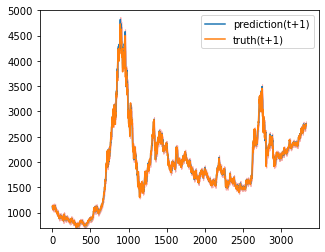

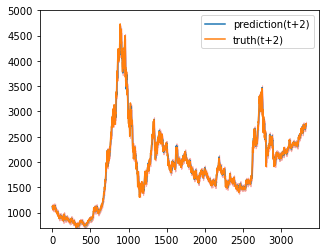

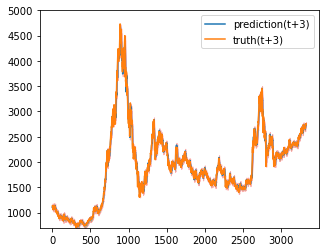

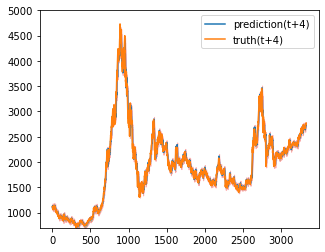

Train epoch:50 	Loss: -18.112122| Loss_in: 0.014000| Loss_out: 0.012149


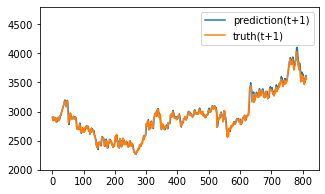

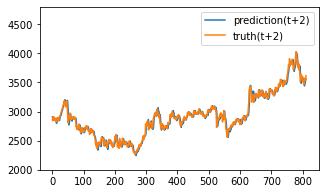

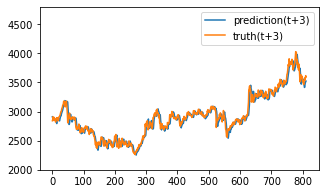

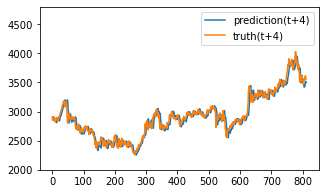

Test epoch:50 	Loss: 0.183107

Epoch: 51


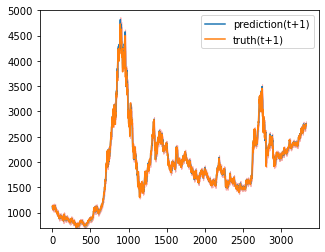

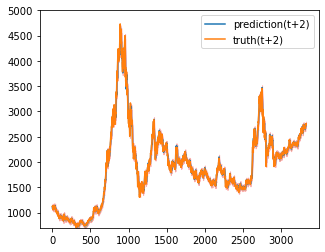

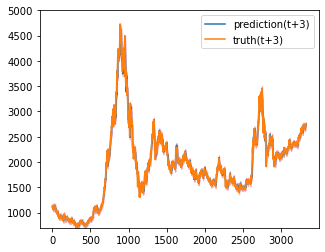

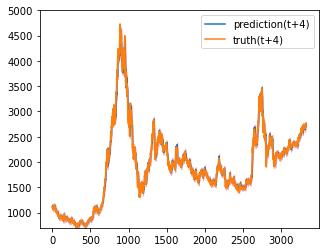

Train epoch:51 	Loss: -18.151557| Loss_in: 0.013815| Loss_out: 0.011878


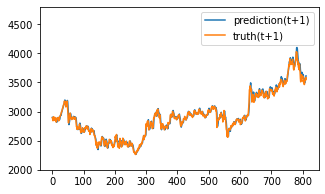

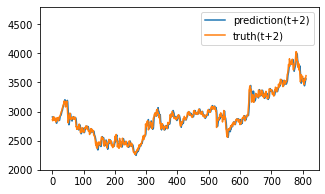

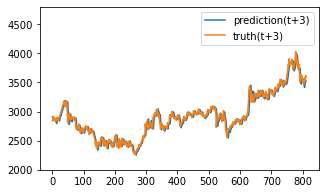

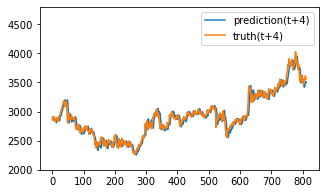

Test epoch:51 	Loss: 0.182569

Epoch: 52


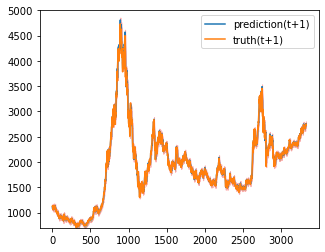

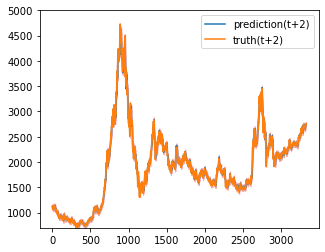

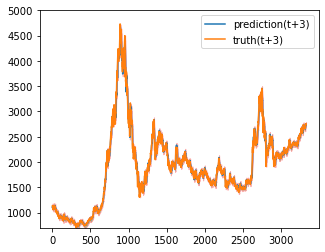

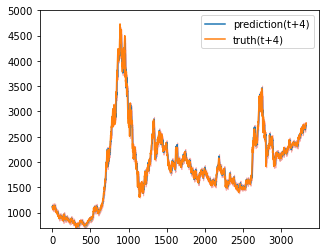

Train epoch:52 	Loss: -18.173429| Loss_in: 0.013628| Loss_out: 0.011894


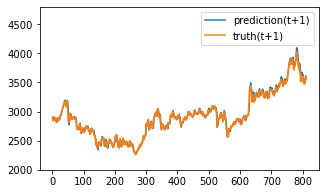

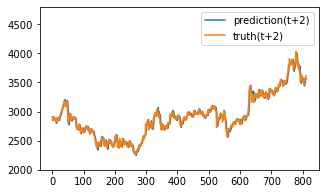

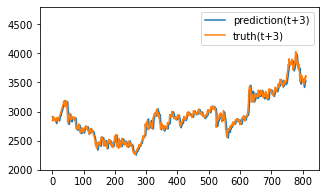

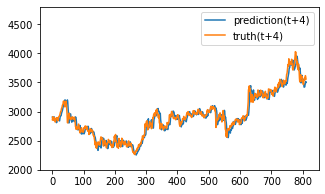

Test epoch:52 	Loss: 0.182393

Epoch: 53


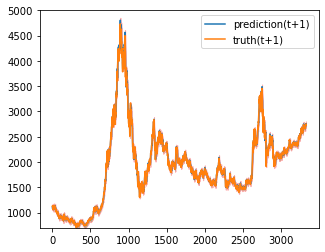

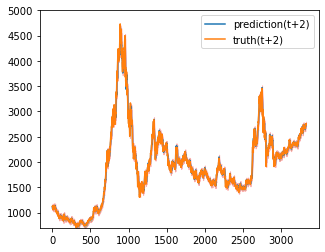

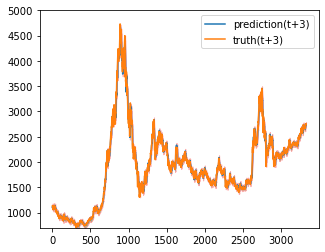

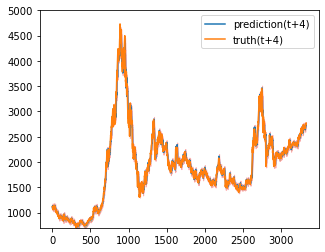

Train epoch:53 	Loss: -18.192295| Loss_in: 0.013540| Loss_out: 0.011908


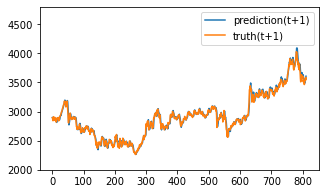

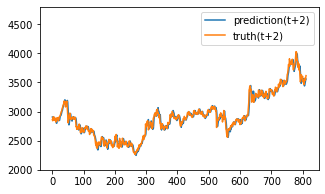

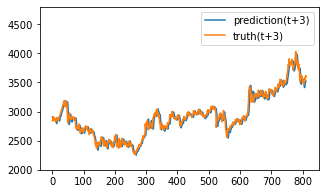

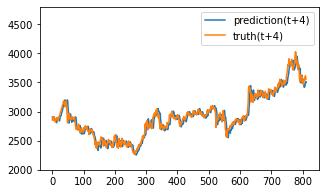

Test epoch:53 	Loss: 0.182403

Epoch: 54


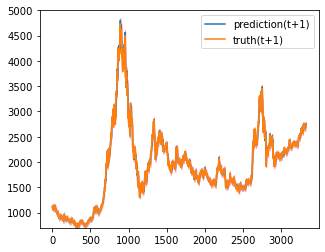

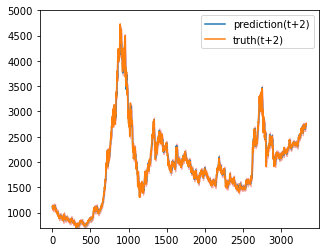

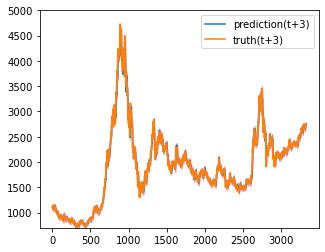

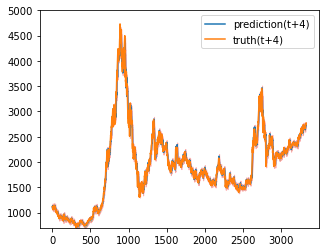

Train epoch:54 	Loss: -18.208004| Loss_in: 0.013411| Loss_out: 0.011471


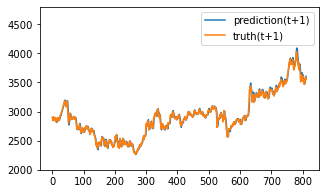

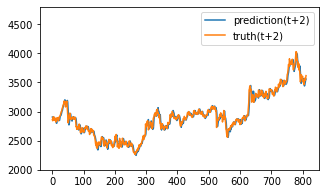

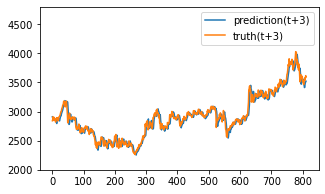

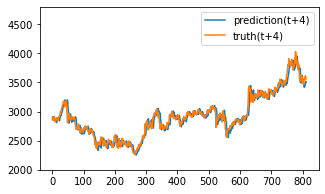

Test epoch:54 	Loss: 0.182104

Epoch: 55


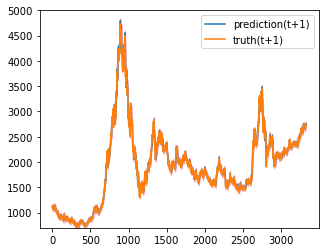

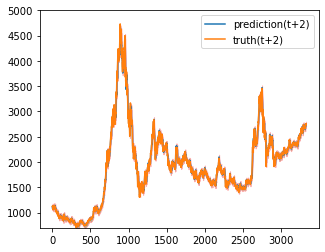

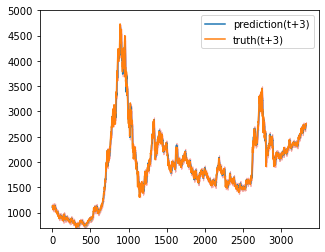

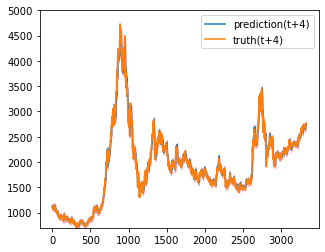

Train epoch:55 	Loss: -18.227240| Loss_in: 0.013245| Loss_out: 0.011466


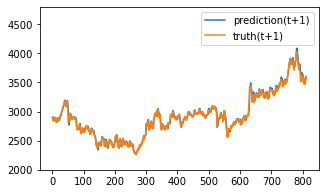

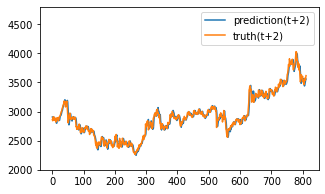

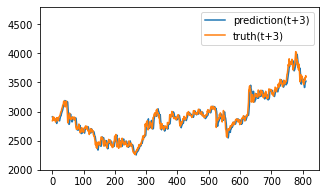

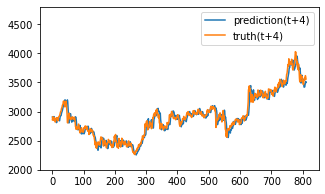

Test epoch:55 	Loss: 0.181761

Epoch: 56


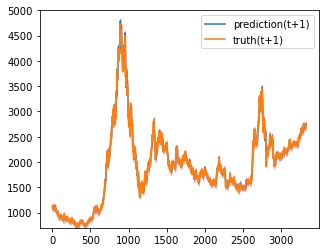

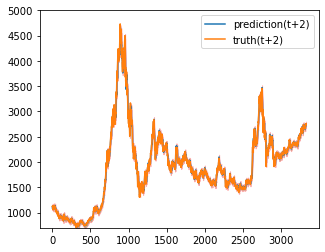

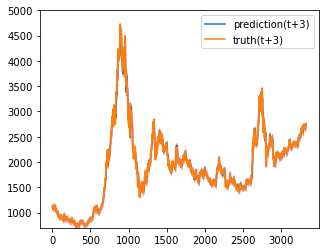

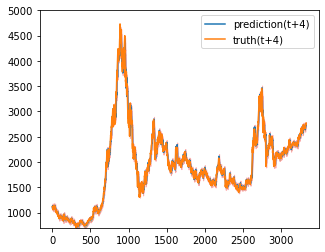

Train epoch:56 	Loss: -18.243678| Loss_in: 0.013083| Loss_out: 0.011175


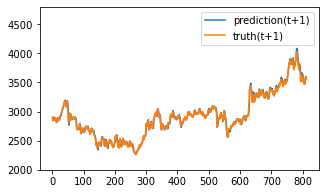

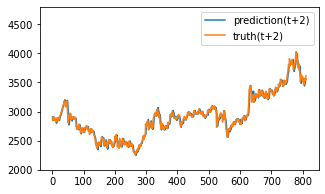

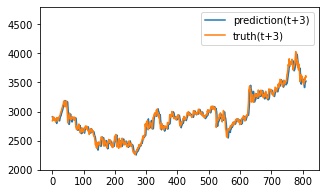

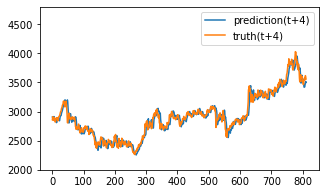

Test epoch:56 	Loss: 0.181576

Epoch: 57


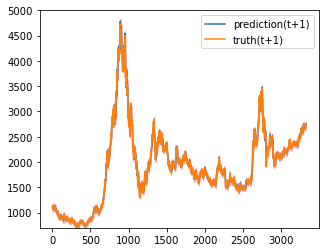

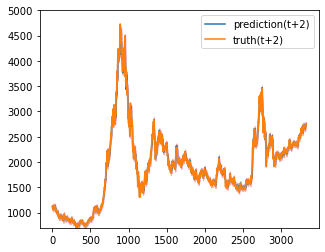

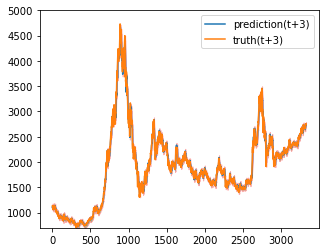

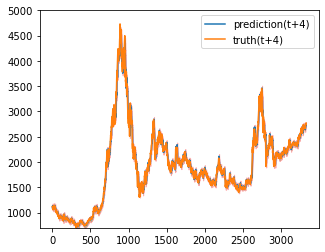

Train epoch:57 	Loss: -18.251670| Loss_in: 0.012927| Loss_out: 0.011247


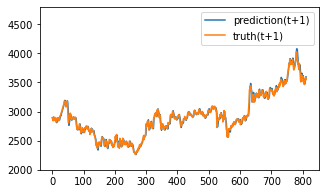

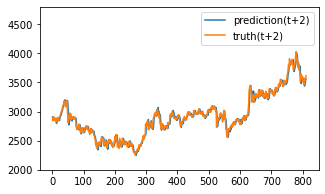

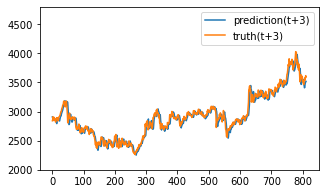

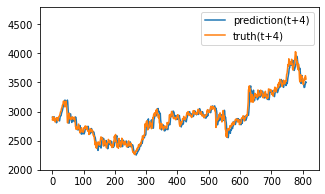

Test epoch:57 	Loss: 0.182085

Epoch: 58


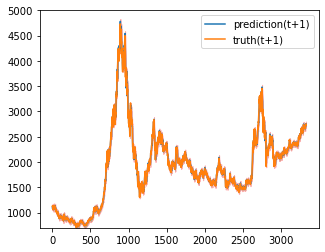

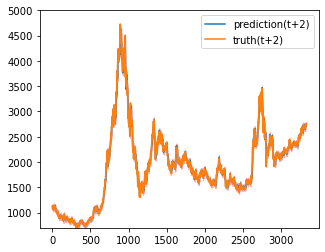

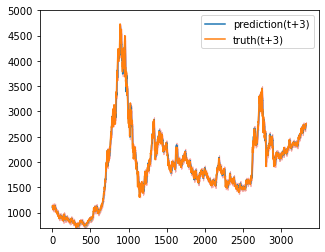

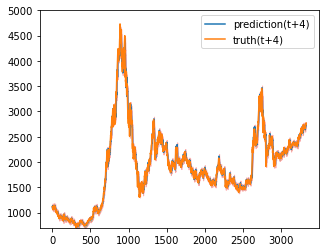

Train epoch:58 	Loss: -18.271376| Loss_in: 0.012821| Loss_out: 0.011019


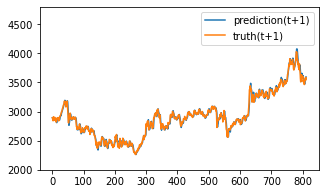

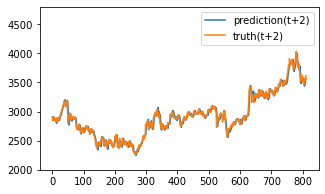

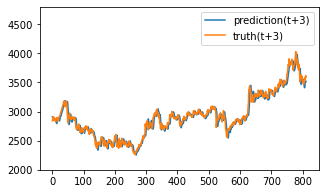

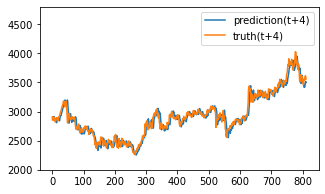

Test epoch:58 	Loss: 0.181638

Epoch: 59


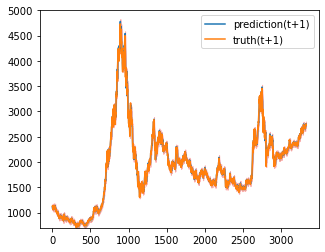

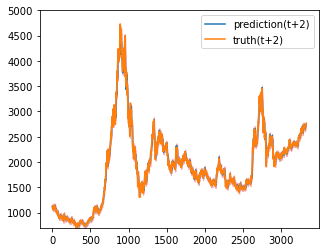

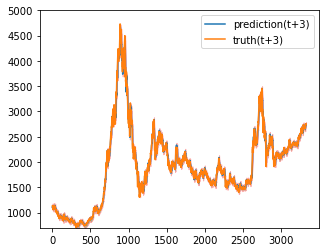

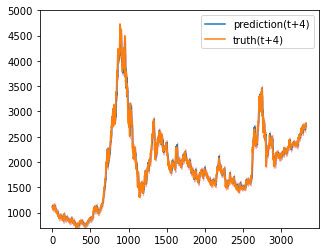

Train epoch:59 	Loss: -18.268716| Loss_in: 0.012711| Loss_out: 0.011374


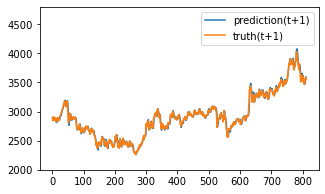

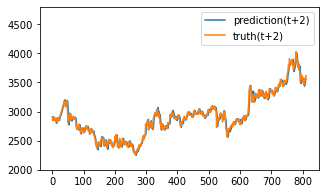

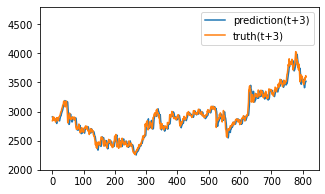

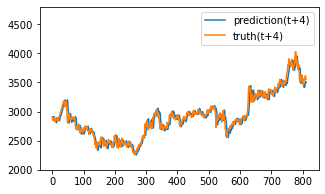

Test epoch:59 	Loss: 0.181372

Epoch: 60


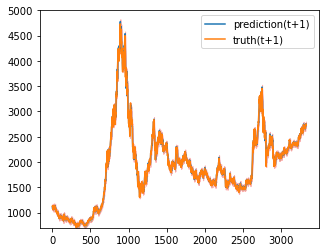

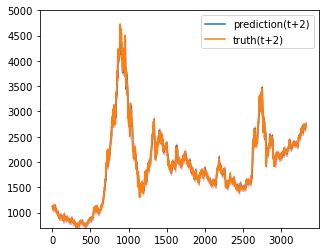

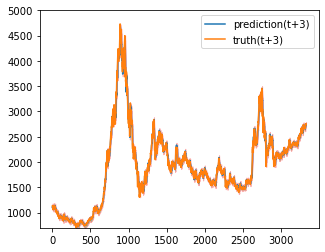

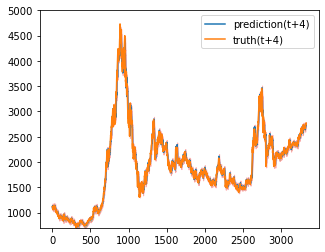

Train epoch:60 	Loss: -18.290927| Loss_in: 0.012655| Loss_out: 0.010993


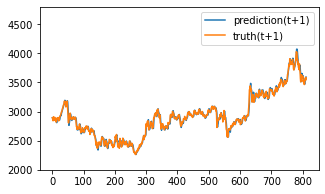

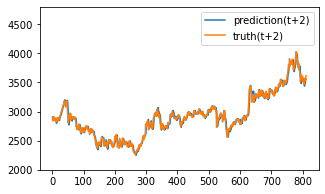

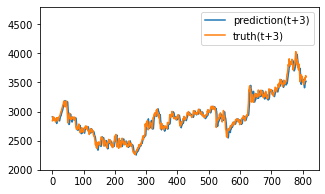

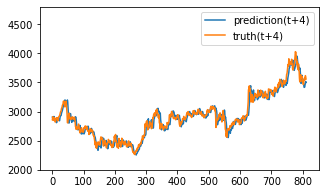

Test epoch:60 	Loss: 0.181260

Epoch: 61


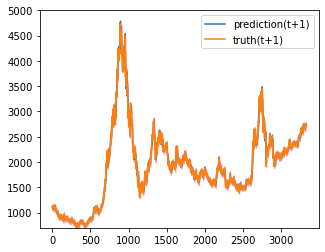

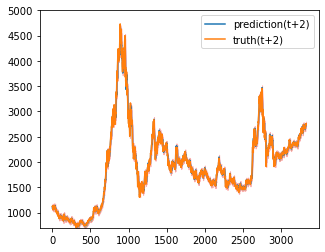

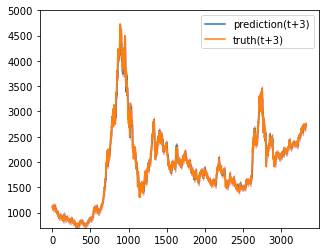

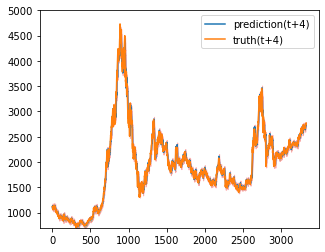

Train epoch:61 	Loss: -18.304770| Loss_in: 0.012503| Loss_out: 0.010739


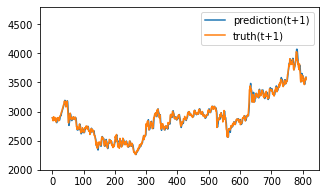

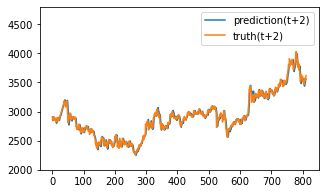

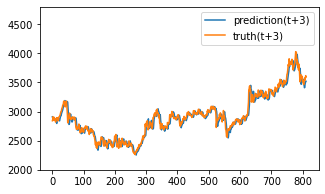

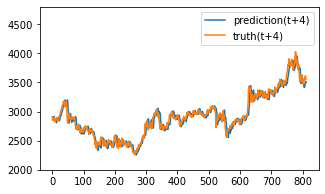

Test epoch:61 	Loss: 0.181153

Epoch: 62


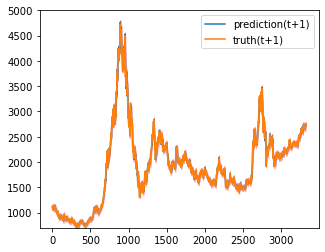

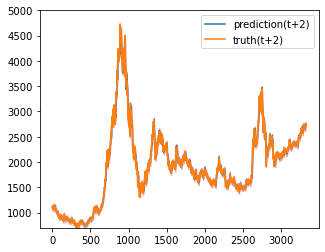

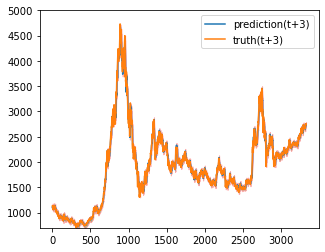

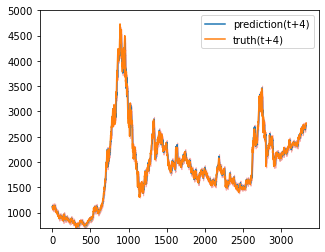

Train epoch:62 	Loss: -18.314843| Loss_in: 0.012371| Loss_out: 0.010694


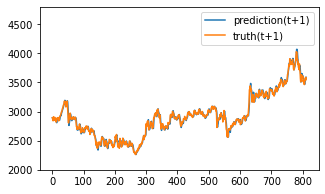

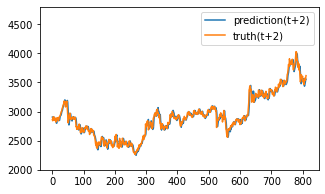

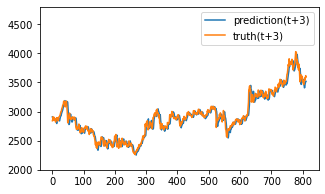

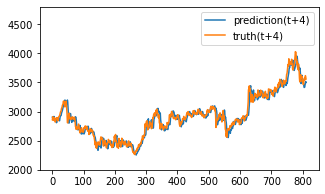

Test epoch:62 	Loss: 0.181264

Epoch: 63


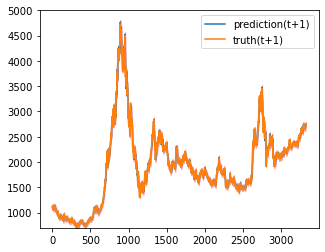

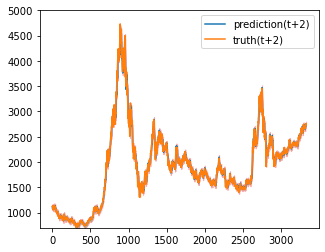

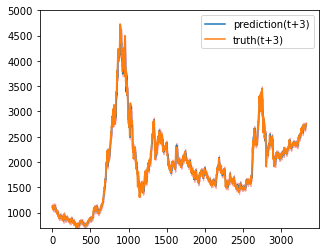

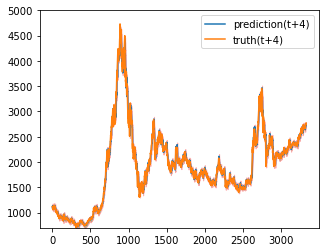

Train epoch:63 	Loss: -18.323580| Loss_in: 0.012276| Loss_out: 0.010948


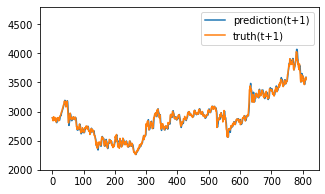

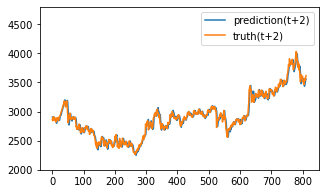

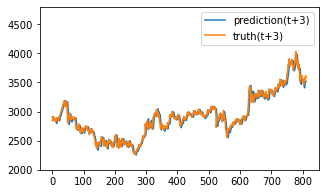

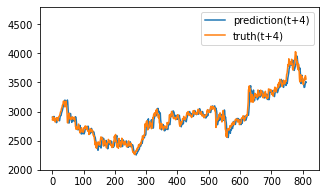

Test epoch:63 	Loss: 0.180988

Epoch: 64


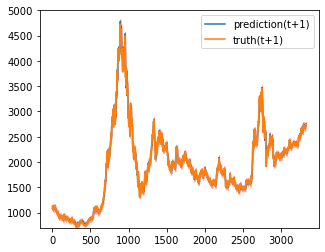

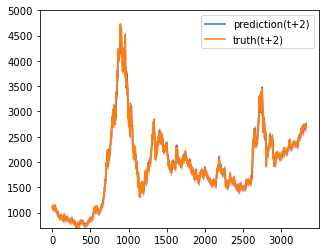

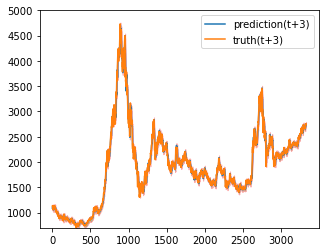

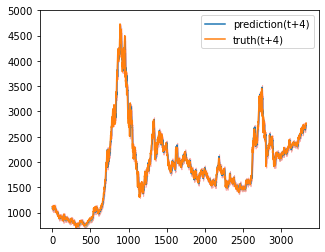

Train epoch:64 	Loss: -16.439858| Loss_in: 0.012757| Loss_out: 0.010526


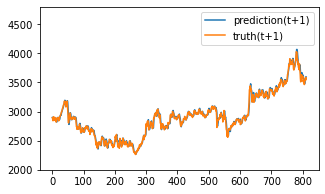

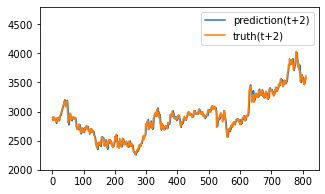

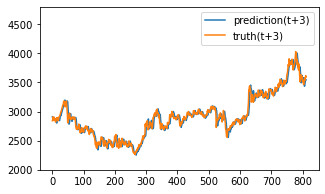

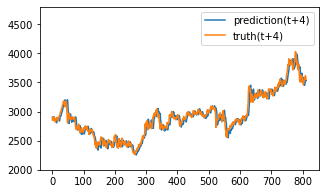

Test epoch:64 	Loss: 0.179314

Epoch: 65


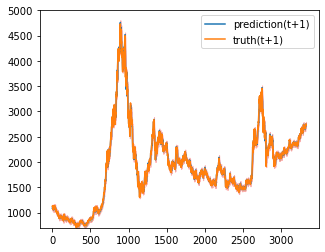

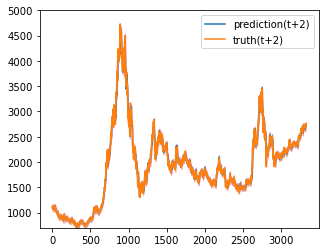

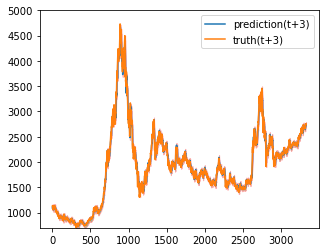

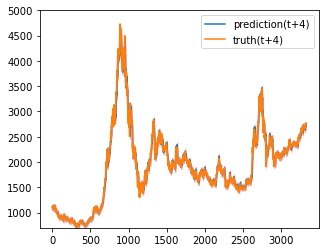

Train epoch:65 	Loss: -17.945650| Loss_in: 0.012780| Loss_out: 0.010943


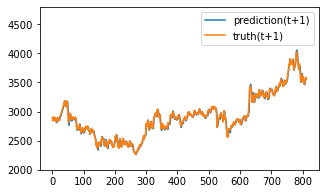

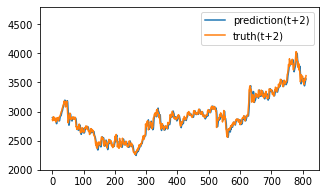

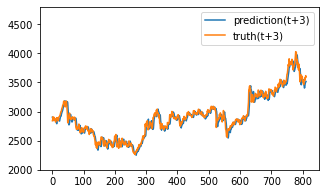

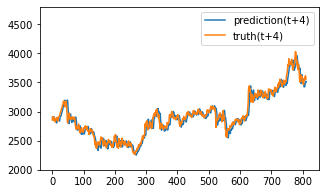

Test epoch:65 	Loss: 0.181707

Epoch: 66


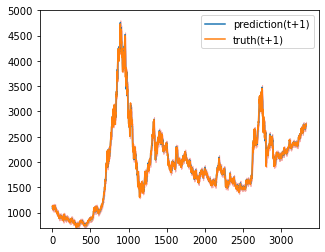

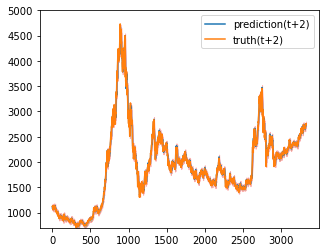

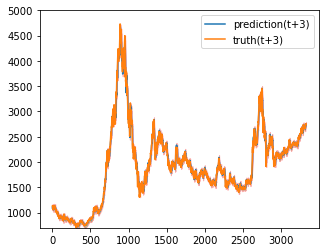

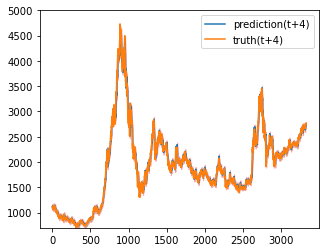

Train epoch:66 	Loss: -18.187935| Loss_in: 0.011975| Loss_out: 0.010593


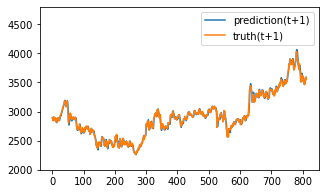

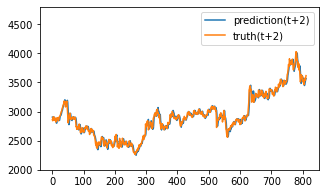

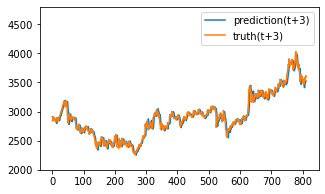

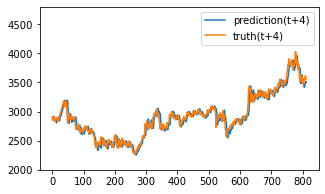

Test epoch:66 	Loss: 0.180561

Epoch: 67


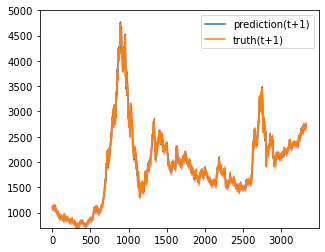

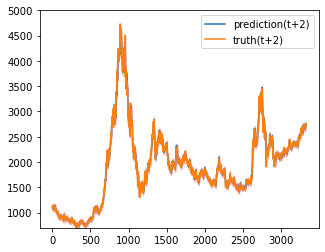

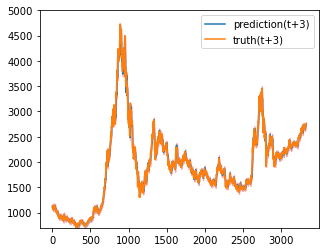

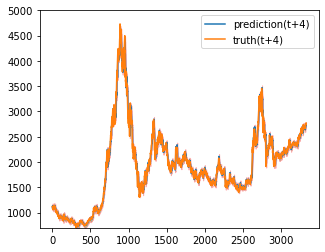

Train epoch:67 	Loss: -18.276484| Loss_in: 0.011817| Loss_out: 0.010677


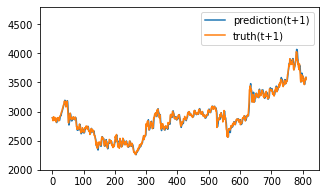

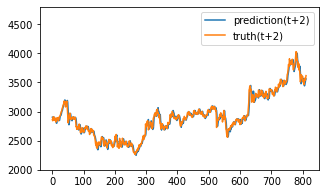

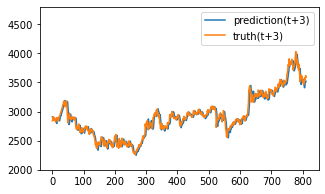

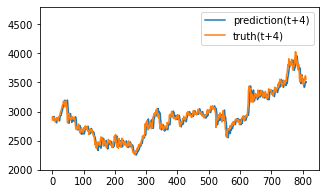

Test epoch:67 	Loss: 0.180813

Epoch: 68


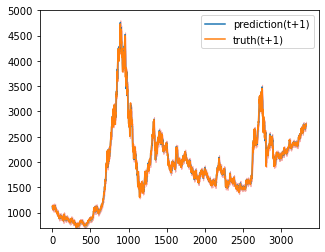

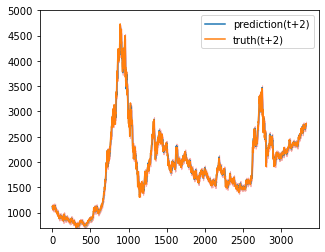

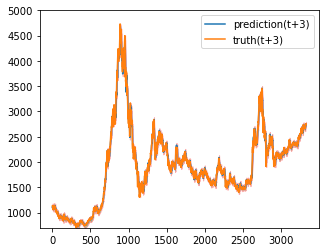

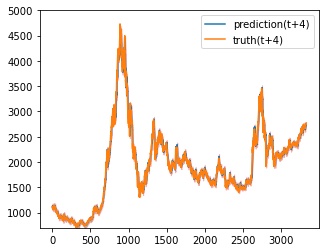

Train epoch:68 	Loss: -18.304717| Loss_in: 0.011749| Loss_out: 0.010408


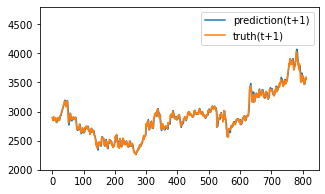

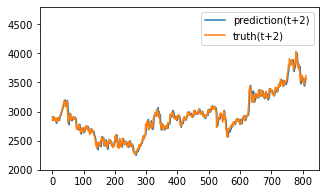

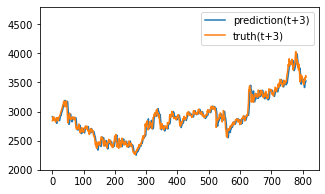

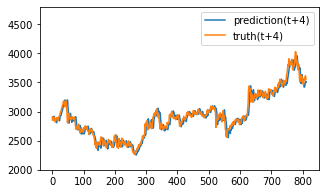

Test epoch:68 	Loss: 0.180246

Epoch: 69


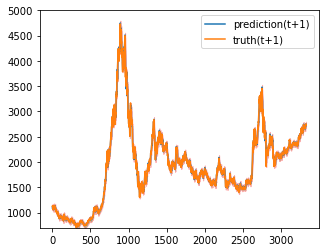

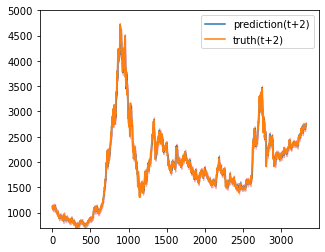

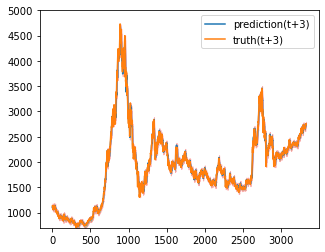

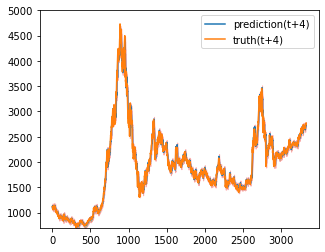

Train epoch:69 	Loss: -18.339081| Loss_in: 0.011661| Loss_out: 0.010163


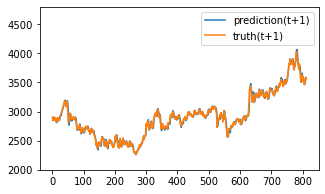

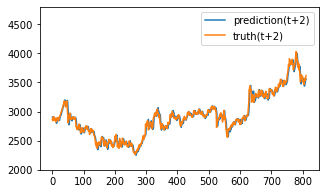

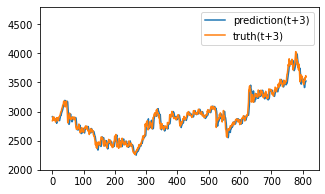

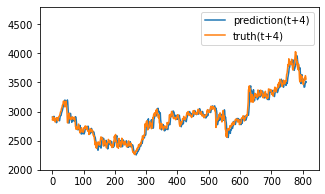

Test epoch:69 	Loss: 0.180133

Epoch: 70


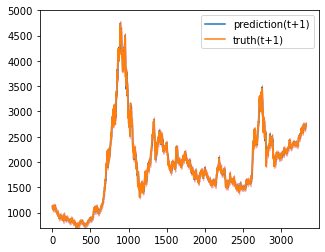

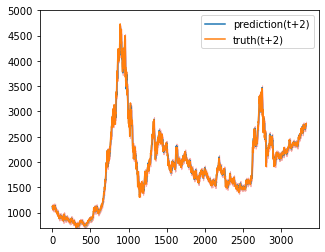

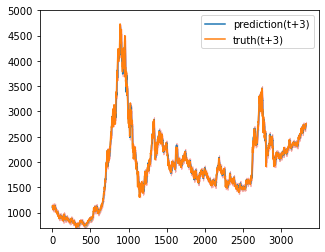

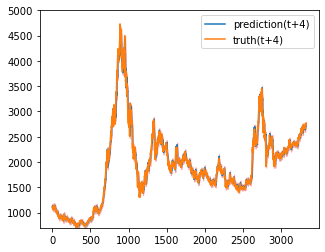

Train epoch:70 	Loss: -18.352936| Loss_in: 0.011580| Loss_out: 0.010198


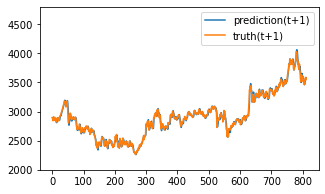

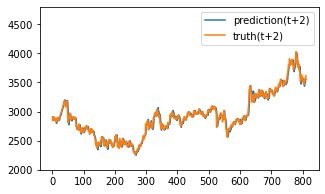

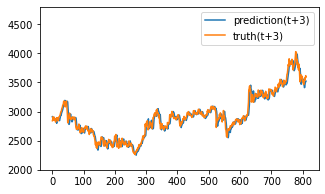

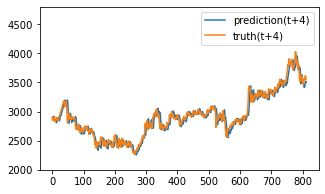

Test epoch:70 	Loss: 0.180177

Epoch: 71


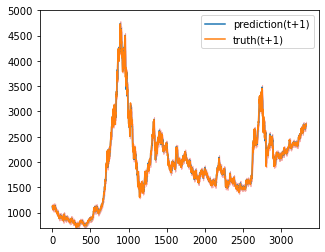

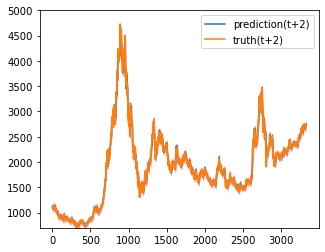

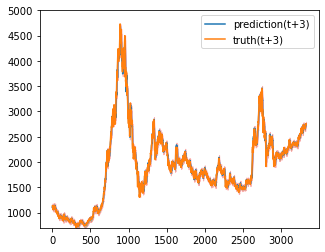

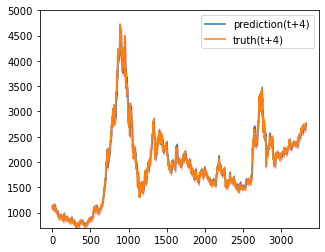

Train epoch:71 	Loss: -18.308761| Loss_in: 0.011515| Loss_out: 0.010292


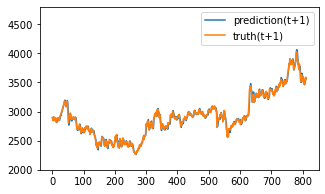

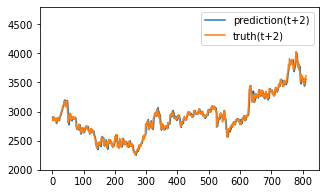

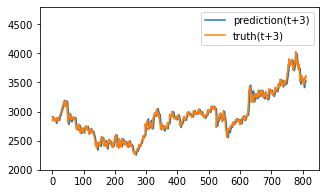

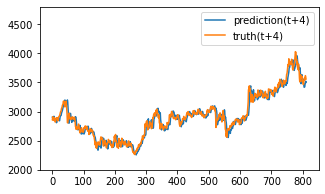

Test epoch:71 	Loss: 0.179960

Epoch: 72


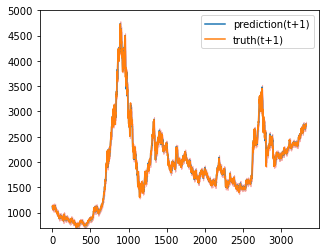

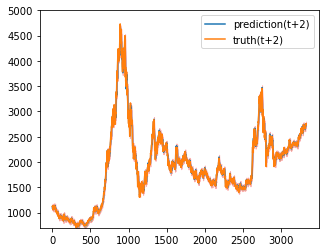

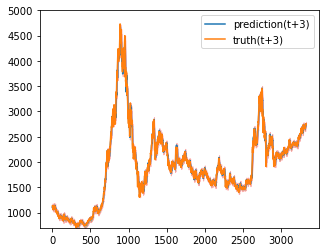

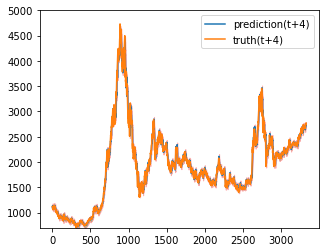

Train epoch:72 	Loss: -18.370696| Loss_in: 0.011489| Loss_out: 0.010087


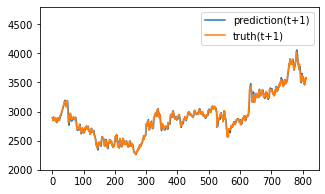

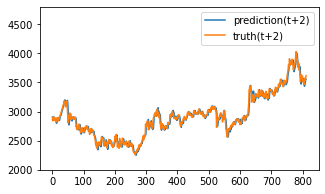

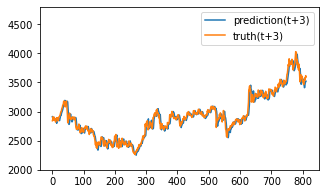

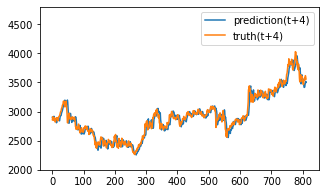

Test epoch:72 	Loss: 0.180079

Epoch: 73


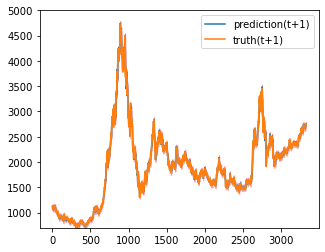

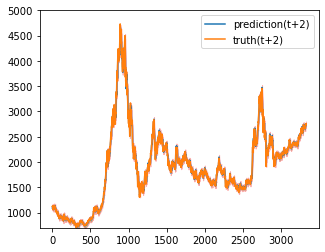

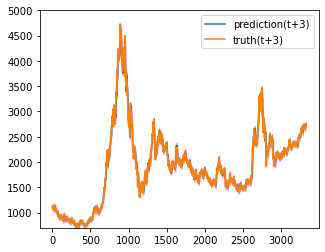

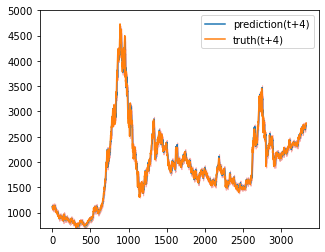

Train epoch:73 	Loss: -18.373304| Loss_in: 0.011454| Loss_out: 0.010092


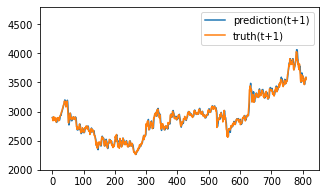

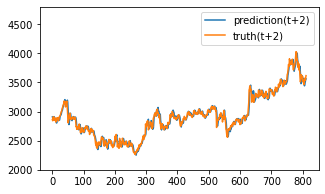

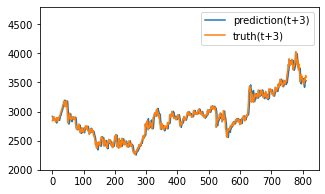

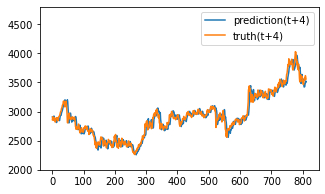

Test epoch:73 	Loss: 0.179188

Epoch: 74


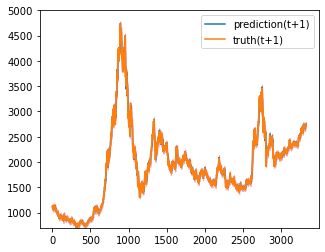

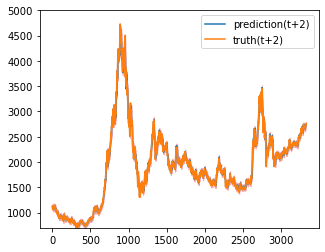

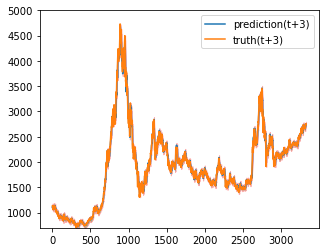

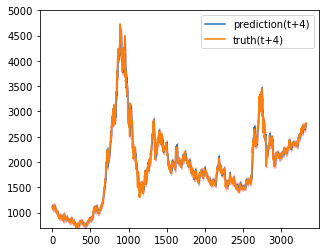

Train epoch:74 	Loss: -18.359427| Loss_in: 0.011382| Loss_out: 0.010005


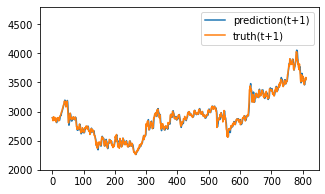

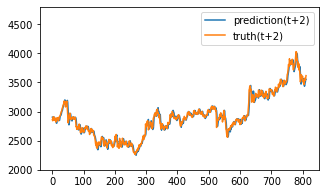

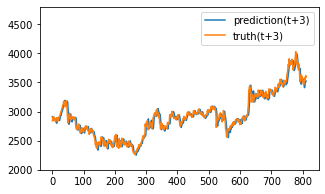

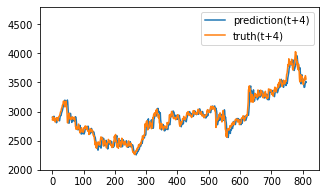

Test epoch:74 	Loss: 0.179759

Epoch: 75


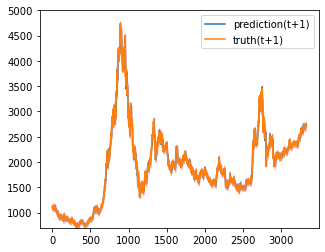

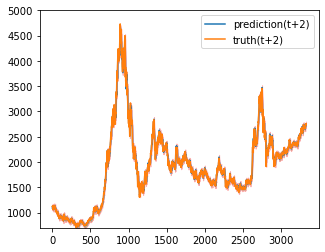

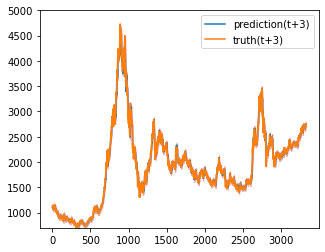

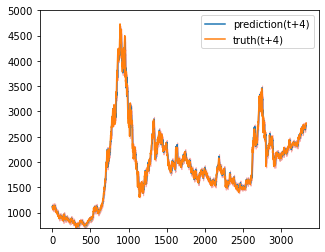

Train epoch:75 	Loss: -18.396789| Loss_in: 0.011318| Loss_out: 0.009880


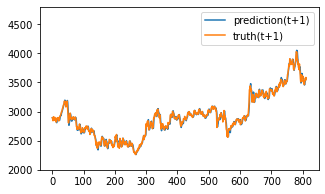

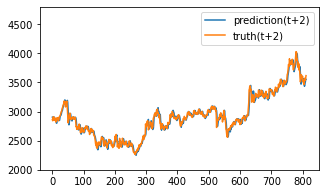

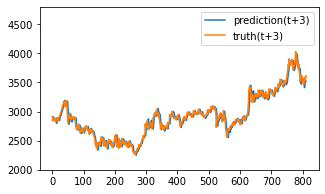

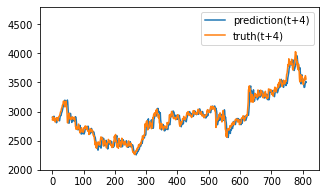

Test epoch:75 	Loss: 0.179758

Epoch: 76


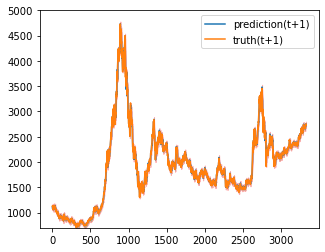

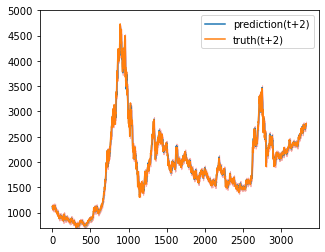

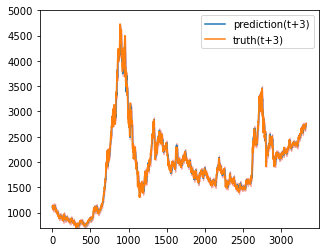

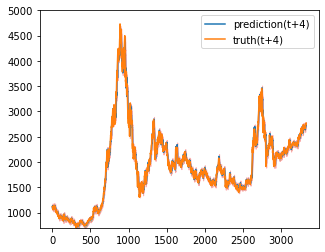

Train epoch:76 	Loss: -18.403745| Loss_in: 0.011258| Loss_out: 0.009931


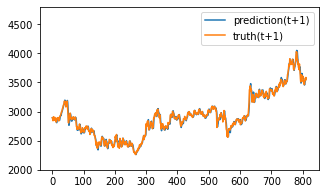

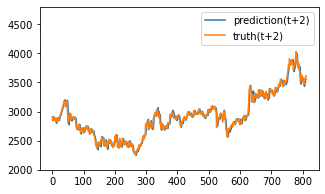

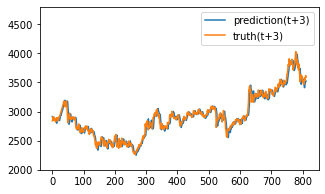

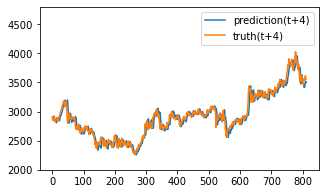

Test epoch:76 	Loss: 0.179683

Epoch: 77


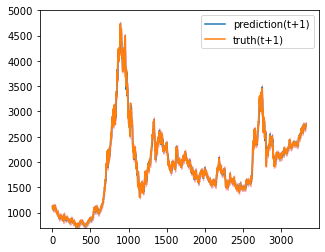

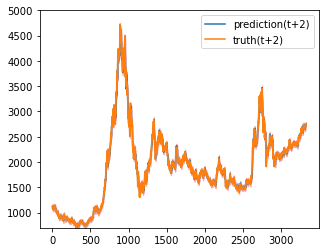

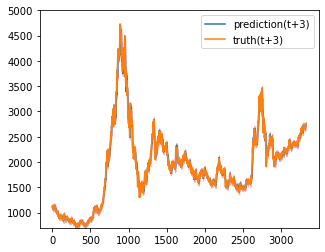

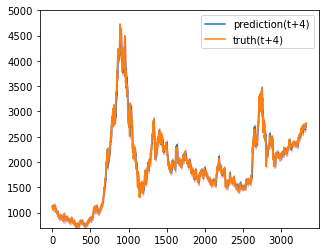

Train epoch:77 	Loss: -18.407170| Loss_in: 0.011220| Loss_out: 0.009841


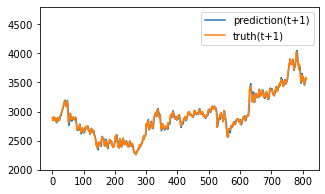

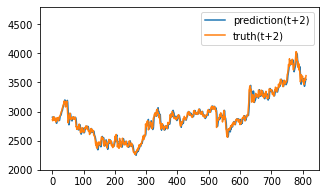

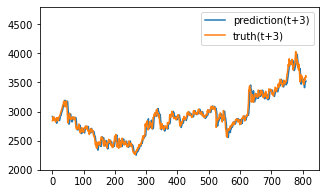

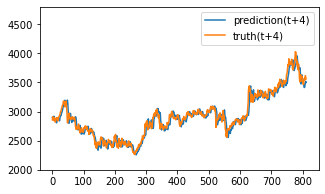

Test epoch:77 	Loss: 0.179797

Epoch: 78


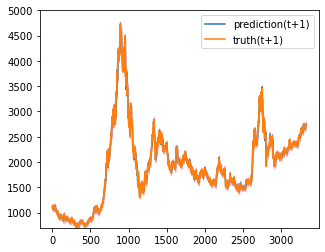

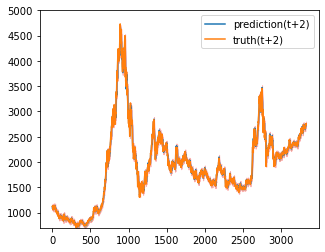

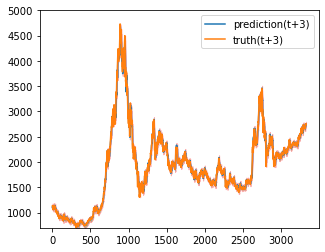

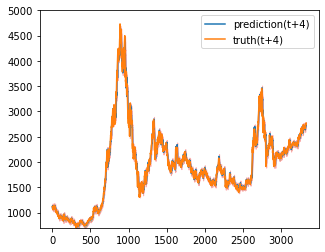

Train epoch:78 	Loss: -18.415128| Loss_in: 0.011138| Loss_out: 0.009697


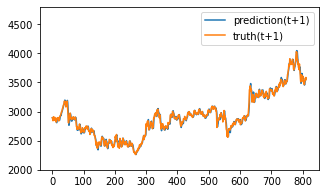

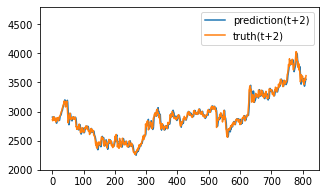

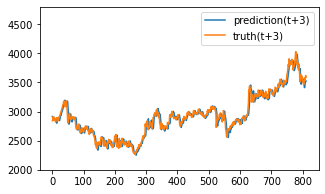

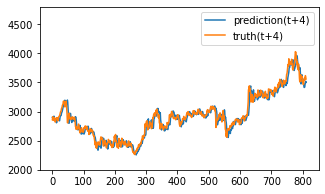

Test epoch:78 	Loss: 0.179493

Epoch: 79


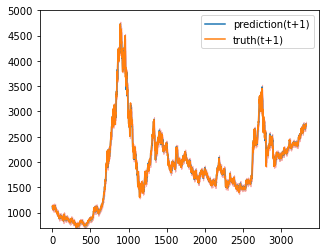

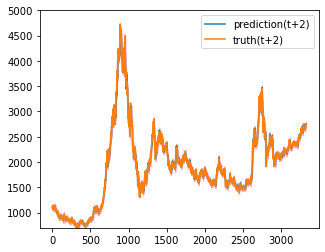

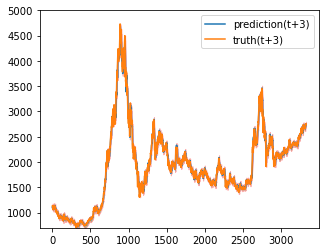

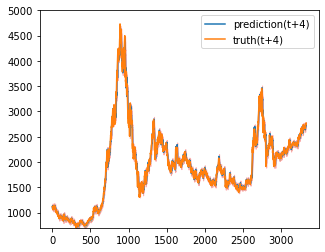

Train epoch:79 	Loss: -18.421530| Loss_in: 0.011082| Loss_out: 0.009819


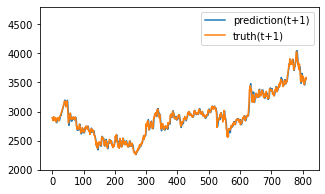

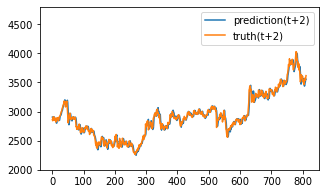

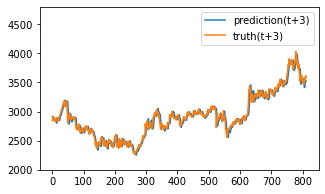

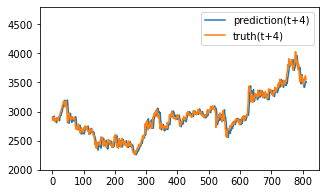

Test epoch:79 	Loss: 0.179230

Epoch: 80


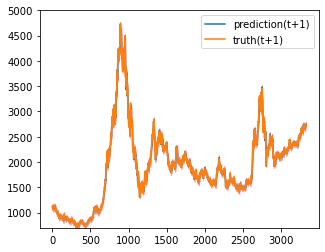

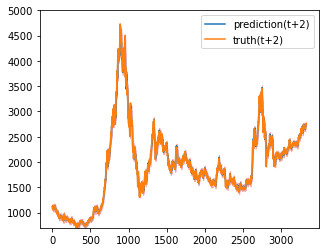

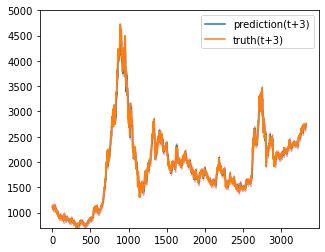

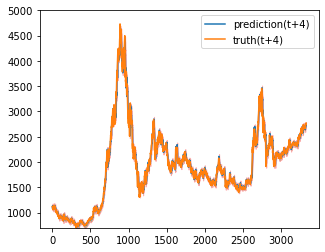

Train epoch:80 	Loss: -18.428059| Loss_in: 0.011079| Loss_out: 0.009905


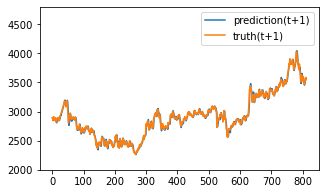

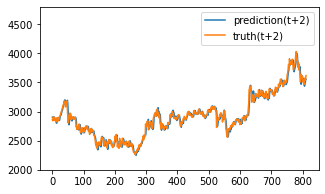

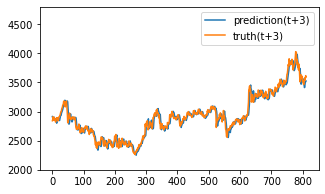

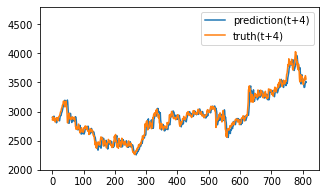

Test epoch:80 	Loss: 0.179348

Epoch: 81


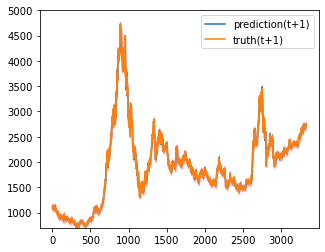

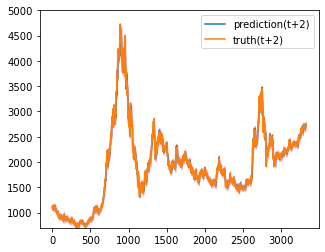

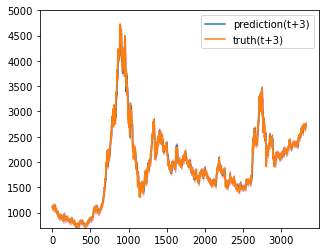

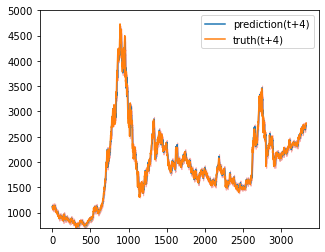

Train epoch:81 	Loss: -18.434109| Loss_in: 0.011033| Loss_out: 0.009692


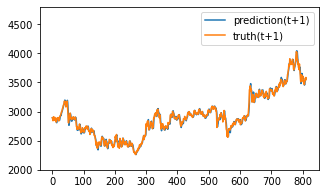

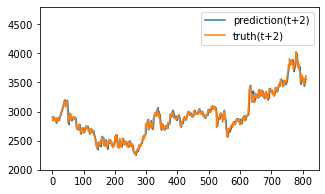

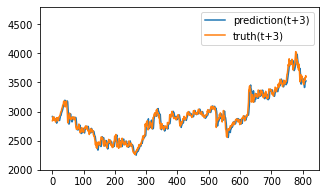

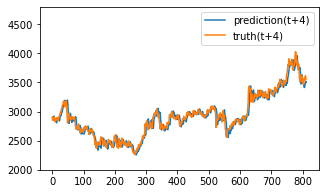

Test epoch:81 	Loss: 0.179195

Epoch: 82


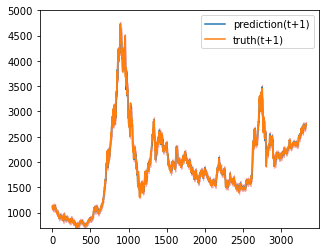

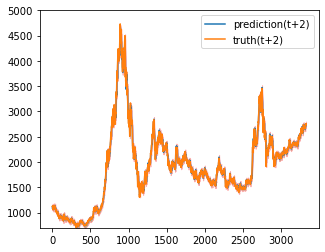

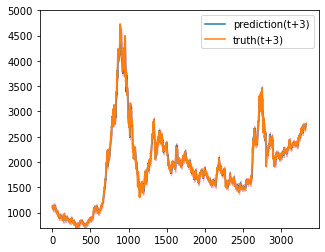

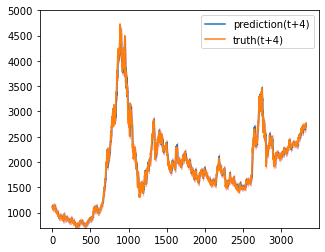

Train epoch:82 	Loss: -18.438438| Loss_in: 0.010987| Loss_out: 0.009608


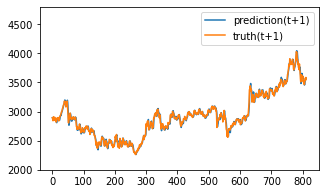

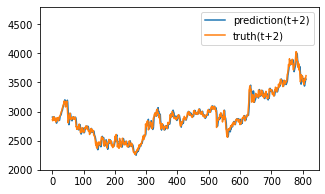

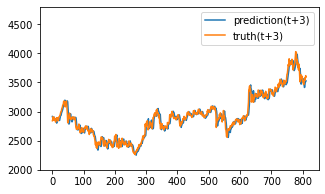

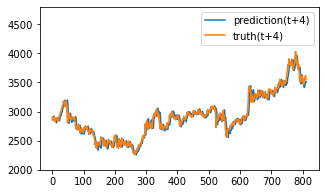

Test epoch:82 	Loss: 0.178990

Epoch: 83


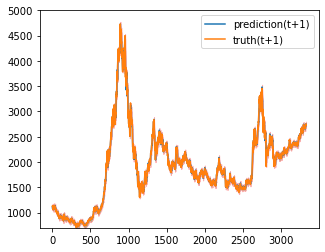

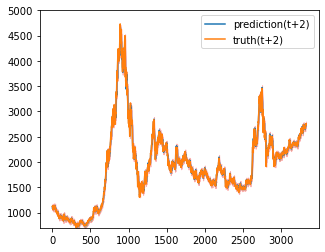

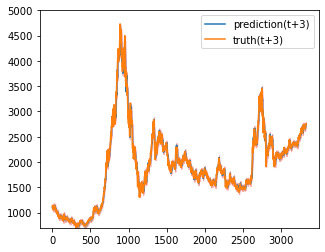

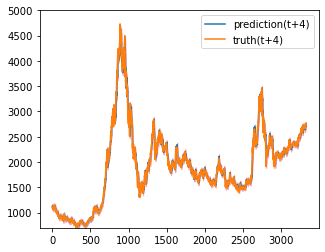

Train epoch:83 	Loss: -18.429143| Loss_in: 0.010923| Loss_out: 0.009606


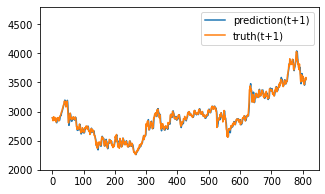

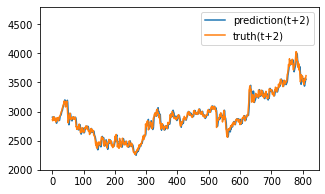

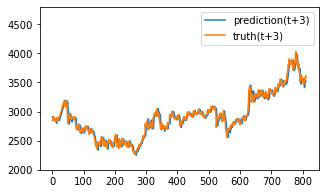

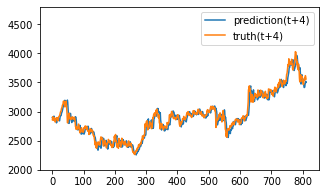

Test epoch:83 	Loss: 0.179176

Epoch: 84


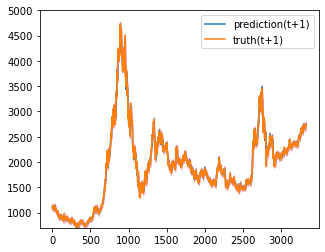

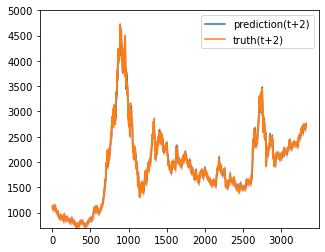

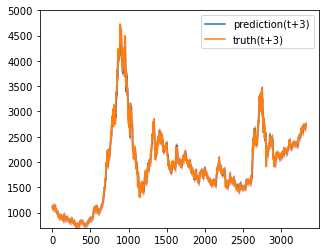

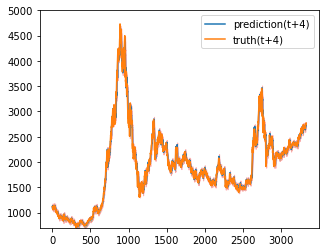

Train epoch:84 	Loss: -18.449602| Loss_in: 0.010871| Loss_out: 0.009495


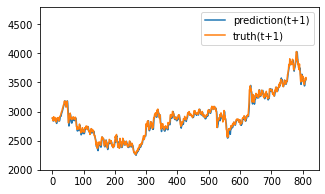

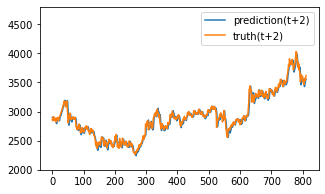

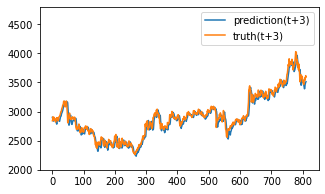

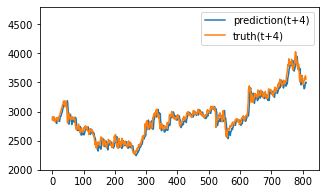

Test epoch:84 	Loss: 0.185986

Epoch: 85


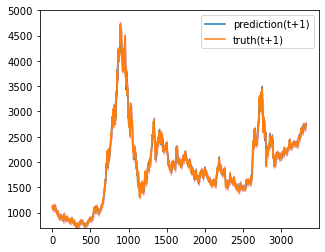

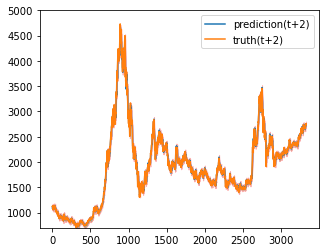

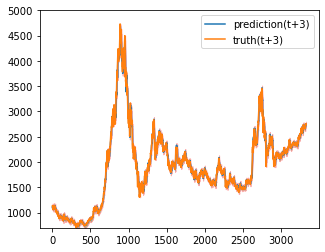

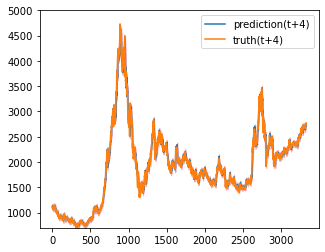

Train epoch:85 	Loss: -18.455520| Loss_in: 0.010816| Loss_out: 0.009655


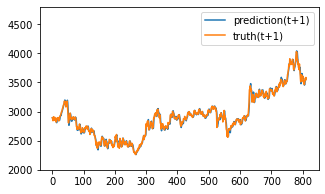

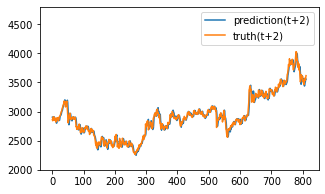

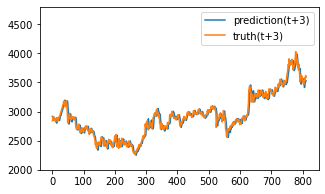

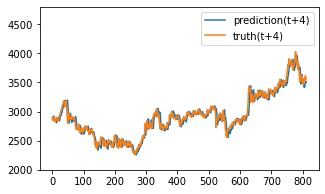

Test epoch:85 	Loss: 0.178832

Epoch: 86


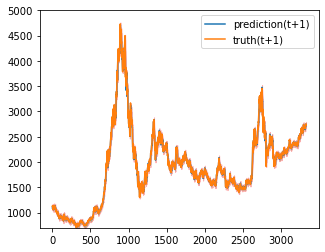

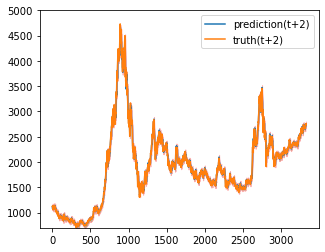

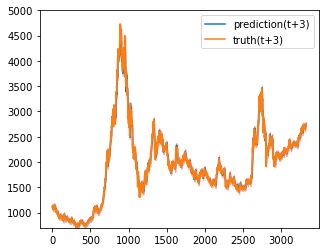

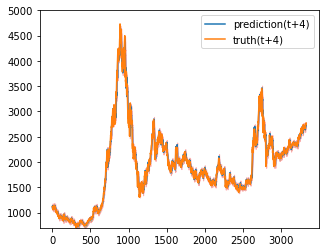

Train epoch:86 	Loss: -18.450593| Loss_in: 0.010799| Loss_out: 0.009590


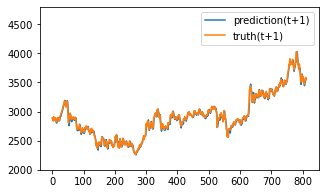

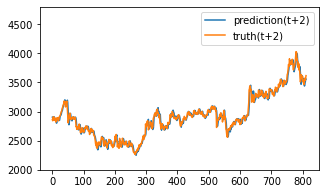

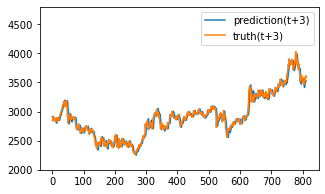

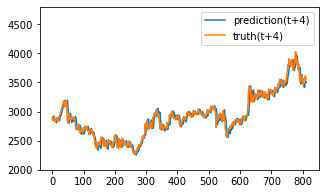

Test epoch:86 	Loss: 0.179141

Epoch: 87


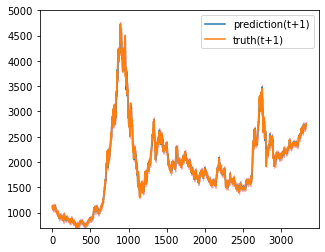

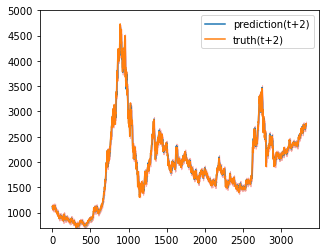

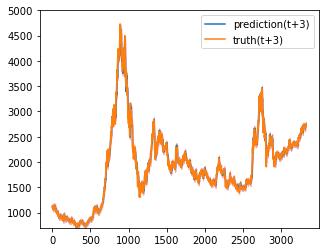

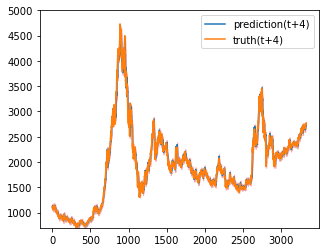

Train epoch:87 	Loss: -18.462187| Loss_in: 0.010761| Loss_out: 0.009449


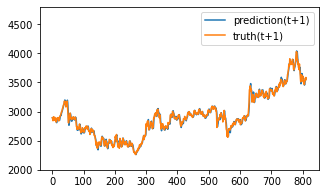

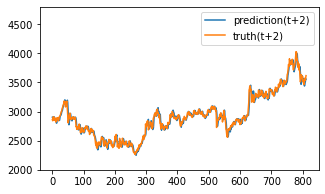

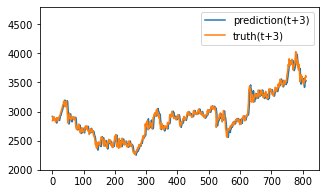

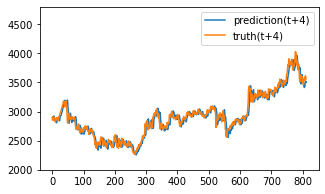

Test epoch:87 	Loss: 0.178660

Epoch: 88


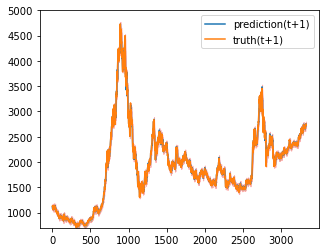

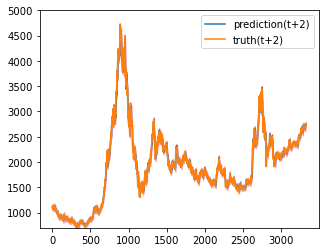

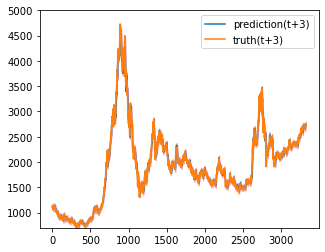

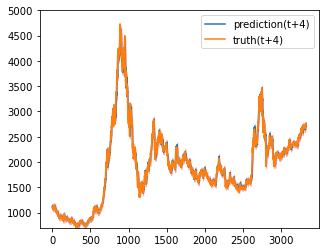

Train epoch:88 	Loss: -18.463811| Loss_in: 0.010707| Loss_out: 0.009413


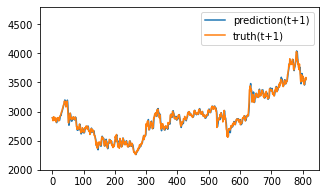

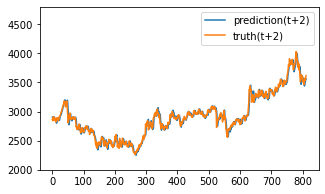

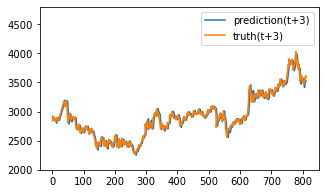

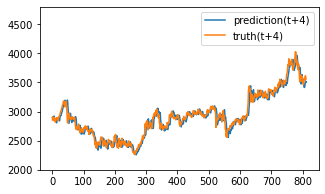

Test epoch:88 	Loss: 0.178557

Epoch: 89


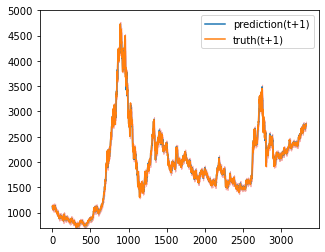

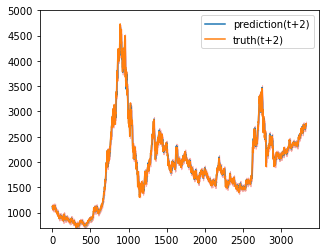

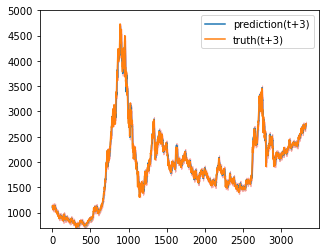

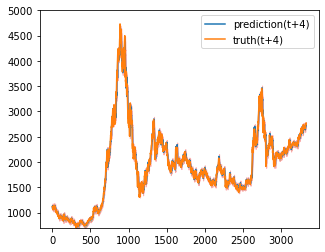

Train epoch:89 	Loss: -18.467317| Loss_in: 0.010668| Loss_out: 0.009556


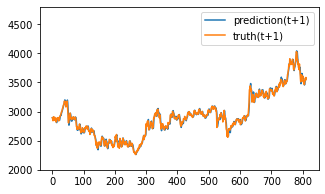

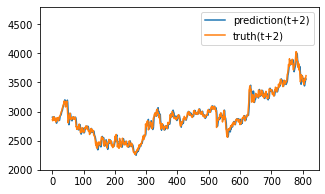

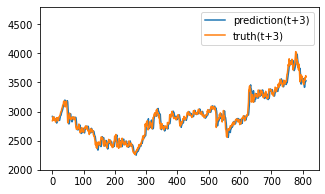

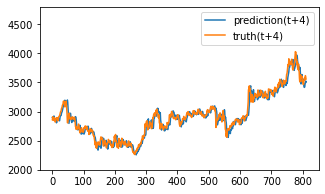

Test epoch:89 	Loss: 0.178404

Epoch: 90


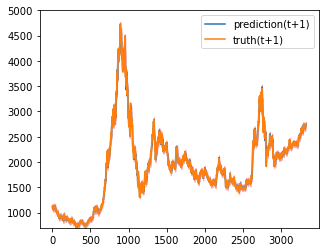

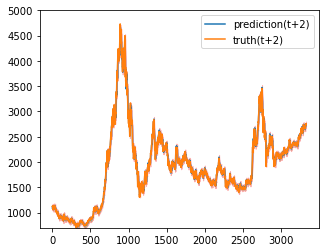

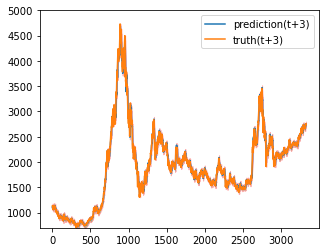

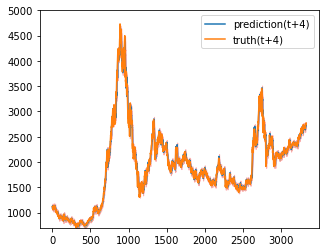

Train epoch:90 	Loss: -18.473580| Loss_in: 0.010655| Loss_out: 0.009341


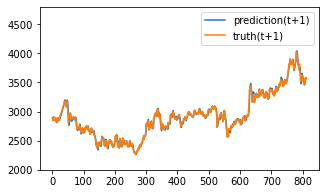

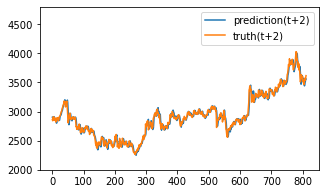

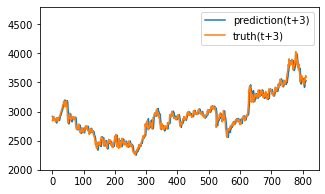

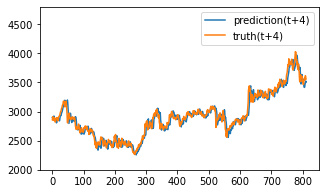

Test epoch:90 	Loss: 0.178376

Epoch: 91


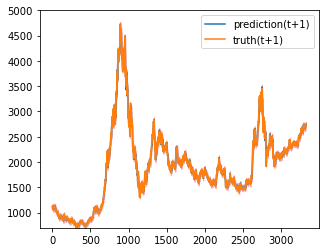

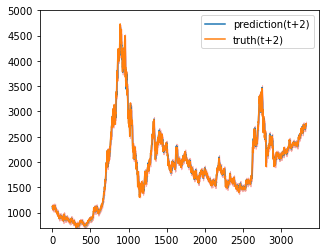

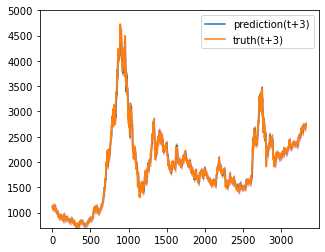

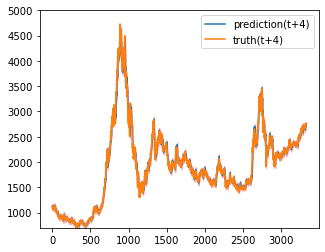

Train epoch:91 	Loss: -18.479526| Loss_in: 0.010592| Loss_out: 0.009186


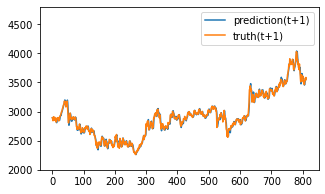

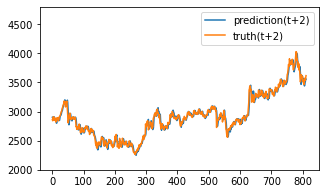

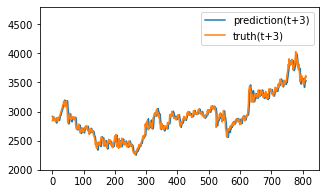

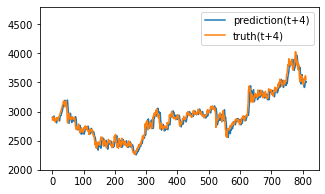

Test epoch:91 	Loss: 0.178423

Epoch: 92


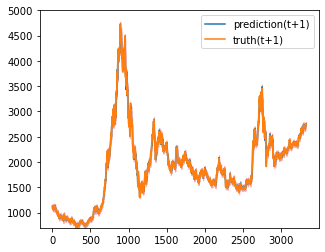

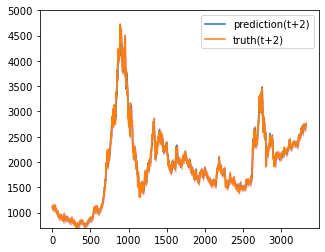

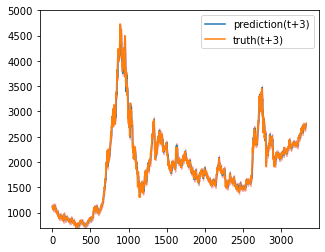

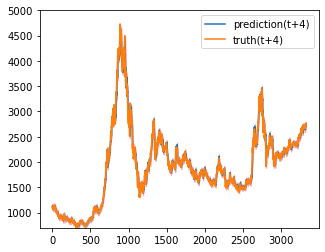

Train epoch:92 	Loss: -18.486108| Loss_in: 0.010540| Loss_out: 0.009283


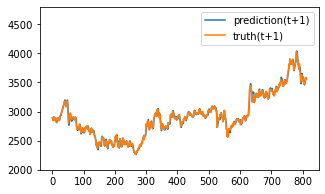

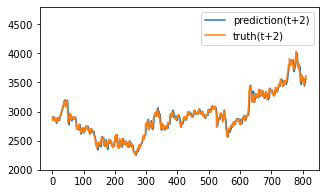

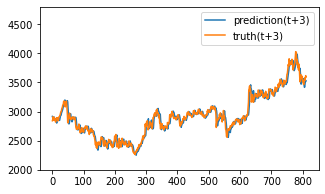

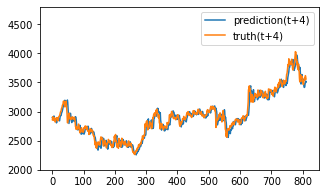

Test epoch:92 	Loss: 0.178308

Epoch: 93


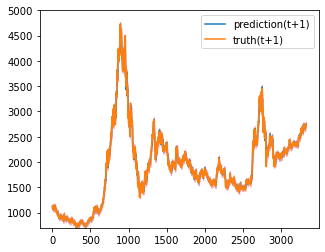

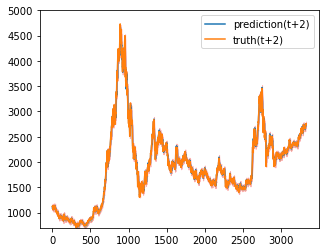

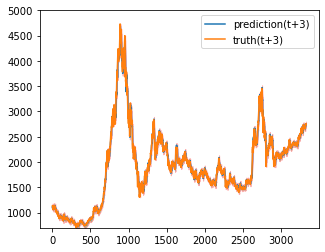

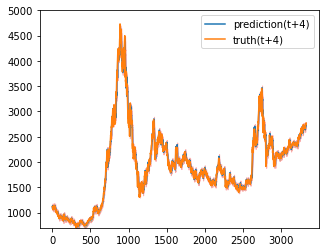

Train epoch:93 	Loss: -18.488618| Loss_in: 0.010523| Loss_out: 0.009289


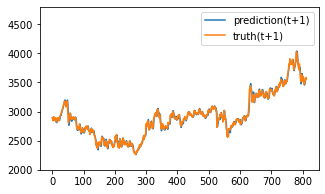

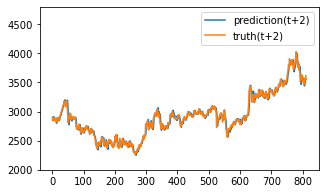

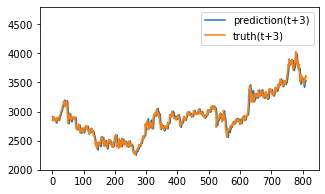

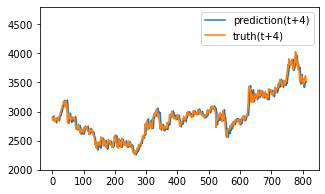

Test epoch:93 	Loss: 0.178214

Epoch: 94


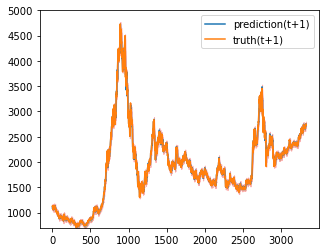

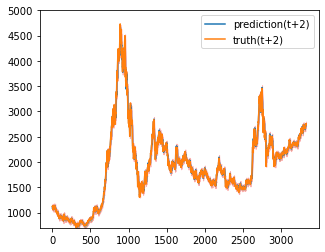

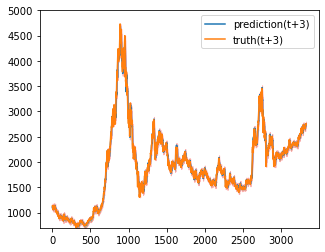

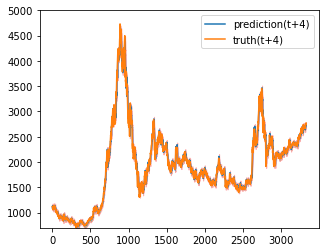

Train epoch:94 	Loss: -18.496119| Loss_in: 0.010530| Loss_out: 0.009460


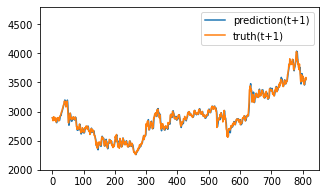

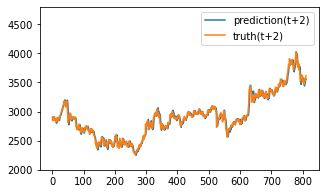

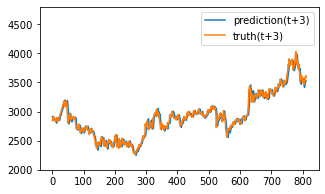

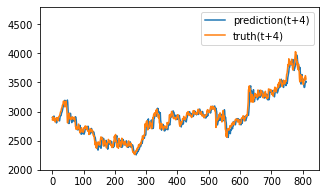

Test epoch:94 	Loss: 0.178376

Epoch: 95


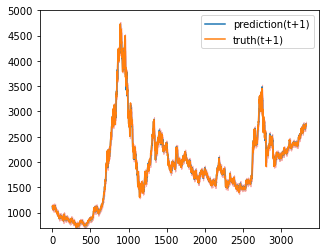

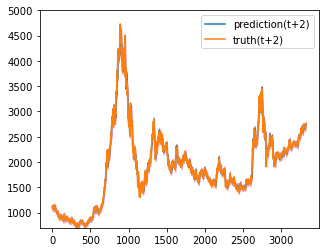

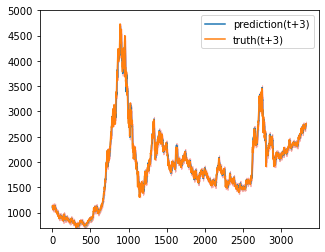

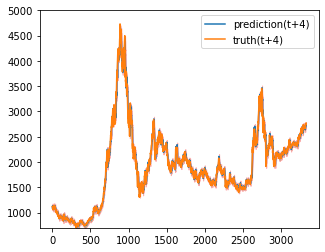

Train epoch:95 	Loss: -18.465265| Loss_in: 0.010508| Loss_out: 0.009151


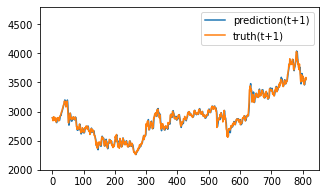

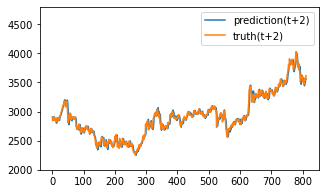

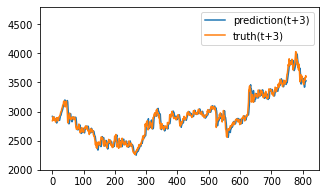

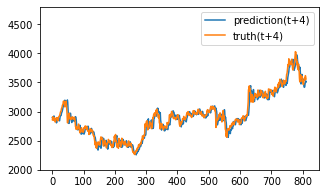

Test epoch:95 	Loss: 0.178004

Epoch: 96


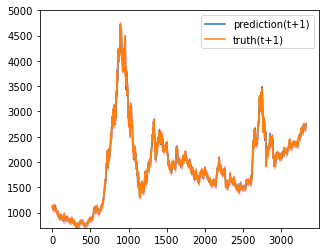

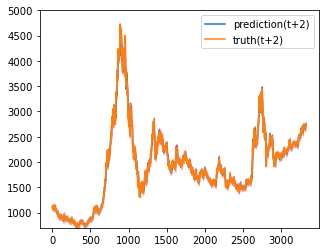

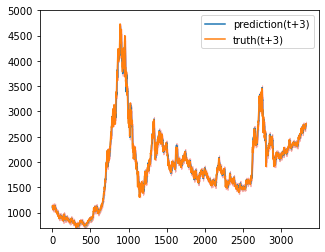

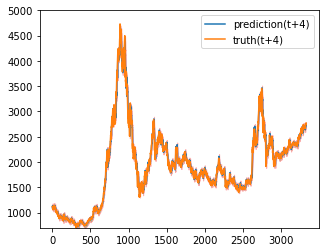

Train epoch:96 	Loss: -18.498493| Loss_in: 0.010466| Loss_out: 0.009321


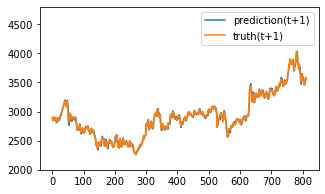

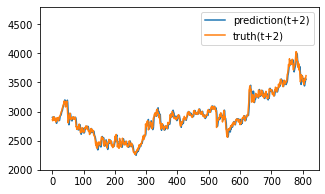

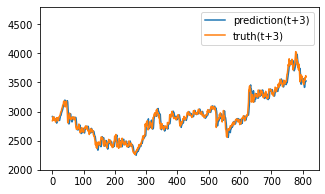

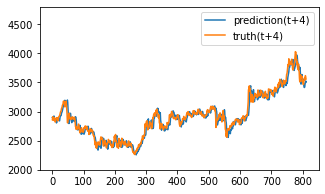

Test epoch:96 	Loss: 0.178323

Epoch: 97


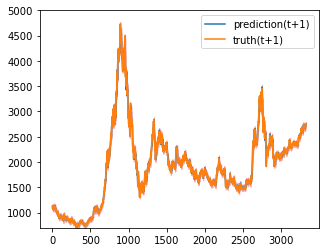

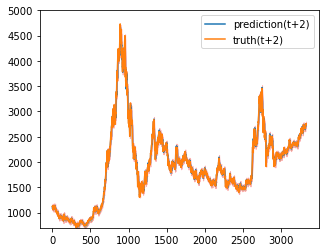

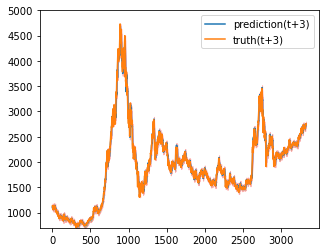

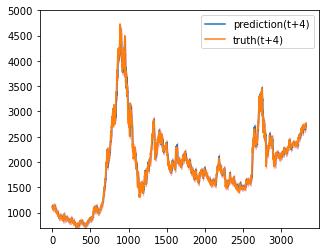

Train epoch:97 	Loss: -18.488834| Loss_in: 0.010428| Loss_out: 0.009196


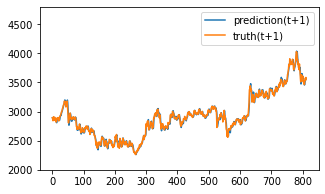

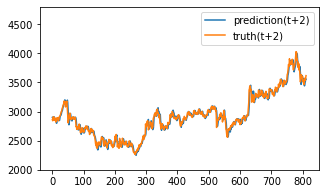

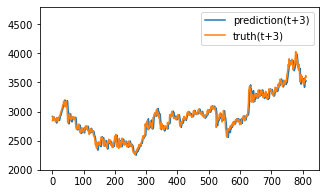

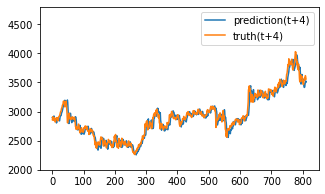

Test epoch:97 	Loss: 0.178151

Epoch: 98


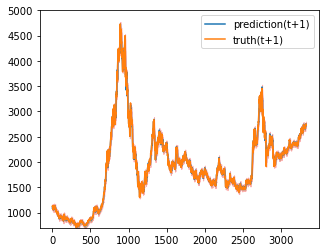

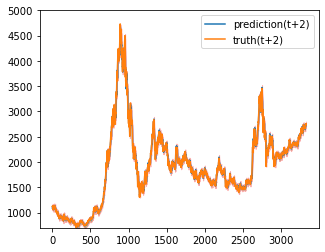

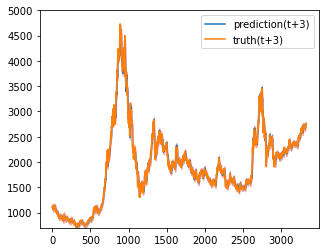

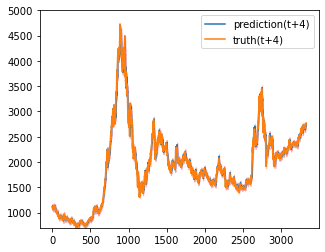

Train epoch:98 	Loss: -18.327279| Loss_in: 0.010426| Loss_out: 0.009221


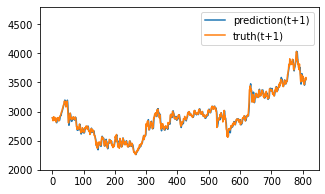

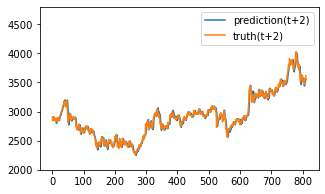

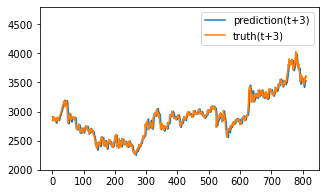

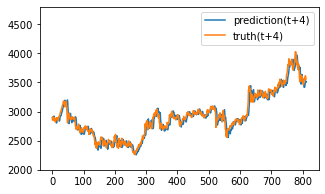

Test epoch:98 	Loss: 0.178364

Epoch: 99


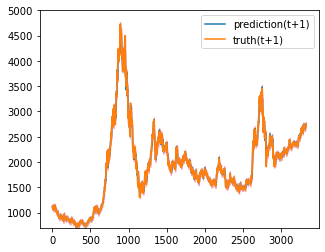

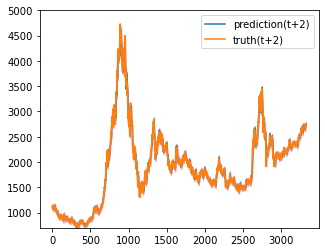

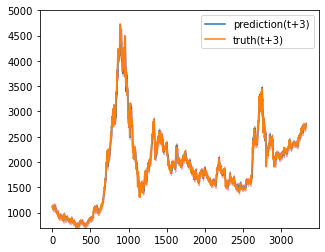

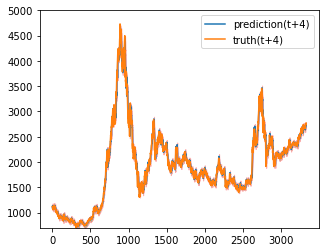

Train epoch:99 	Loss: -18.492187| Loss_in: 0.010386| Loss_out: 0.009089


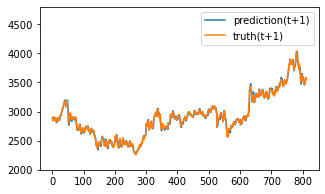

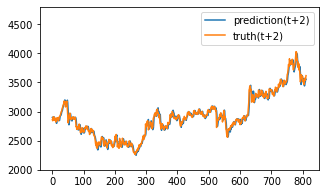

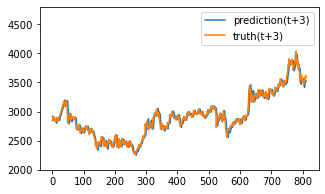

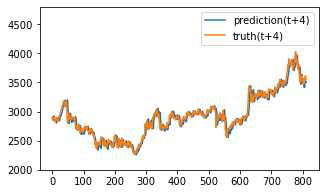

Test epoch:99 	Loss: 0.178200

Epoch: 100


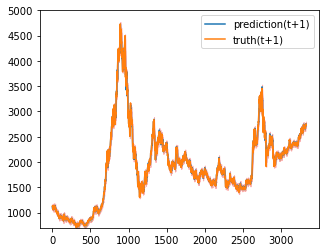

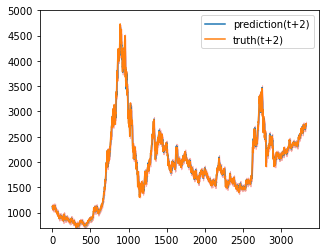

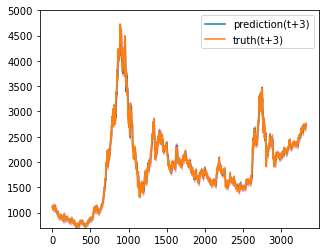

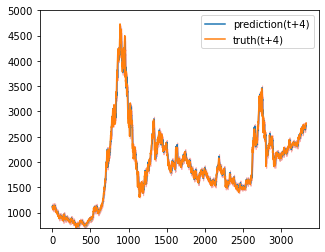

Train epoch:100 	Loss: -18.507976| Loss_in: 0.010352| Loss_out: 0.009077


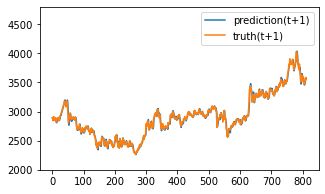

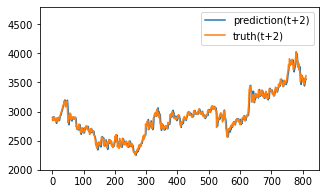

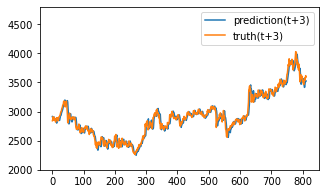

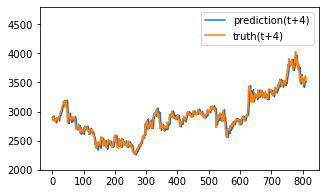

Test epoch:100 	Loss: 0.178095


In [49]:
path = os.path.join('/content/', 'output')
os.makedirs(path, exist_ok=True)
train_losses = []
test_losses = []
for epoch in range(1, args.epochs + 1):
    train_losses.append(train(epoch))
    test_losses.append(test(epoch))
    if epoch in args.decreasing_lr:
        for param_group in optimizer_F.param_groups:
            param_group['lr'] *= args.droprate

    if epoch in args.decreasing_lr2:
        for param_group in optimizer_G.param_groups:
            param_group['lr'] *= args.droprate

In [50]:
train_losses

[(0.037223205, 0.26822698, 0.25987196, 0.09691089),
 (1.3359303, 0.049173553, 0.039415423, 0.03950896),
 (0.518383, 0.036958504, 0.025515236, 0.03352938),
 (0.24801365, 0.026237685, 0.022220664, 0.029040268),
 (0.040309243, 0.01908861, 0.019177945, 0.022840586),
 (0.09947073, 0.013766746, 0.01627709, 0.019502606),
 (0.012663282, 0.011926344, 0.014264969, 0.018302858),
 (0.00950498, 0.009945391, 0.0128499605, 0.016682213),
 (0.007957398, 0.009309543, 0.012398789, 0.016045531),
 (0.009444622, 0.009766329, 0.013002984, 0.016563),
 (0.0075764144, 0.008290616, 0.012468887, 0.016065635),
 (0.0074670007, 0.008378949, 0.01199546, 0.015735738),
 (0.0050624744, 0.00803297, 0.010808351, 0.014490506),
 (0.004813269, 0.0070838053, 0.010314164, 0.013990222),
 (0.0044603525, 0.006852448, 0.010105704, 0.013573101),
 (0.004338015, 0.0067972797, 0.010129939, 0.013468496),
 (0.004015773, 0.0065150172, 0.009662156, 0.013070726),
 (0.15167852, 0.05645595, 0.020516627, 0.017380986),
 (0.06857962, 0.00748667

In [51]:
test_losses

[(0.015366306, 0.50509405, 0.41946837, 0.09761284),
 (4.0647564, 0.03721469, 0.020554246, 0.027869906),
 (1.6463374, 0.019965082, 0.017338704, 0.025220364),
 (0.77142155, 0.0148682585, 0.015912088, 0.022462474),
 (0.090878606, 0.012762182, 0.014279685, 0.01879262),
 (0.01207398, 0.010482115, 0.014764414, 0.0181375),
 (0.008844619, 0.010220503, 0.013349425, 0.016205661),
 (0.007461617, 0.009695502, 0.01313914, 0.016607651),
 (0.007040843, 0.010232711, 0.013505568, 0.016822498),
 (0.006594853, 0.009089203, 0.012034367, 0.015254974),
 (0.0066176564, 0.008682404, 0.012138527, 0.014709806),
 (0.0053680497, 0.009926606, 0.011787107, 0.015691014),
 (0.004948287, 0.008840712, 0.011205618, 0.01395328),
 (0.004883987, 0.0072258213, 0.010868346, 0.013625443),
 (0.004355909, 0.0072576343, 0.01052698, 0.013430923),
 (0.0044798004, 0.0072976486, 0.012033192, 0.013699877),
 (0.0043490515, 0.0068335226, 0.010255056, 0.013172511),
 (0.5402268, 0.13769156, 0.034592256, 0.023329673),
 (0.21926671, 0.0072

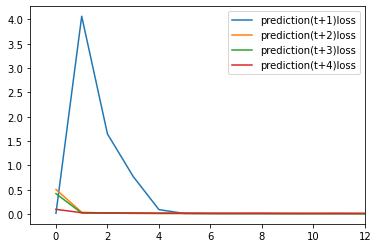

In [52]:
plt.plot(test_losses)
plt.xlim(-1,12)
plt.legend(('prediction(t+1)loss','prediction(t+2)loss','prediction(t+3)loss','prediction(t+4)loss'))
plt.show()

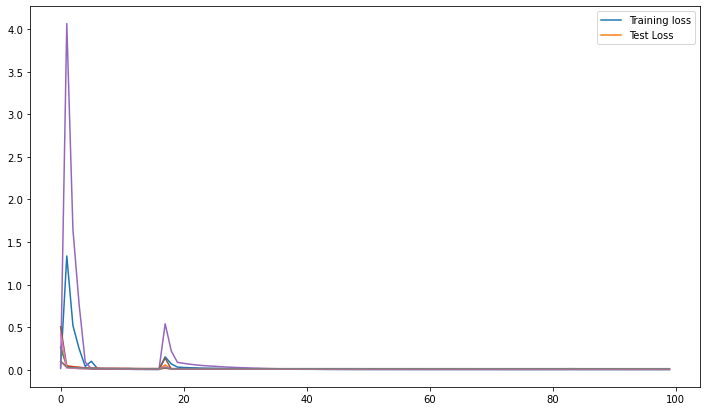

(0.0031861137, 0.0060211895, 0.009657195, 0.012853298)


In [53]:
plt.figure(figsize=(12,7))
plt.plot(train_losses)
plt.plot(test_losses)
plt.legend(('Training loss','Test Loss'))
plt.savefig(os.path.join('/content/output/','Loss'), dpi=300)
plt.show()
print(test_losses[-1])

In [54]:
type(np.array(range(10)))

numpy.ndarray